# Assignment No 4
# Cervical Cancer Risk Classification Dataset

The factors that increase the risk of cervical cancer and necessitate a biopsy examination are many and include age (women between the ages of 35 and 54 are more at risk) and socioeconomic status (African American and Hispanic American women have higher screening rates because of social and economic disparities). Susceptibility is increased by a history of STDs, especially HPV, as well as high sexual activity, which is demonstrated by several partners or an early sexual debut. Furthermore, having many children, particularly when HPV is present, using oral contraceptives for a prolonged period of time (five to ten years), and a family history of cervical cancer all increase the risk. Smoking is linked to precancerous changes, especially in women who have HPV, and immunosuppression, which is seen in HIV/AIDS patients, makes people more vulnerable to HPV and accelerates the development of invasive cancer. Moreover, daughters pregnant women who used diethylstilbestrol (DES) run a higher risk. These complex risk factors highlight the need for all-encompassing preventive measures, such as routine screenings and HPV vaccination, in order to lessen the incidence of cervical cancer.

The dataset consists of columns like

- Age: Age of the individual.
- Number of sexual partners: The count of sexual partners.
- First sexual intercourse: Age at first sexual intercourse.
- Number of pregnancies: Number of pregnancies.
- Smokes: Whether the individual smokes.
- Smokes (years): Number of years of smoking.
- Smokes (packs/year): Packs of cigarettes smoked per year.
- Hormonal Contraceptives: Use of hormonal contraceptives.
- Hormonal Contraceptives (years): Duration of hormonal contraceptive use.
- IUD: Use of intrauterine device.
- IUD (years): Duration of IUD use.
- STDs: History of sexually transmitted diseases.
- STDs (number): Number of different sexually transmitted diseases.
- STDs:condylomatosis to STDs:HPV: Specific types of sexually transmitted diseases.
- STDs: Number of diagnosis: Number of STD diagnoses.
- STDs: Time since first diagnosis: Time since first STD diagnosis.
- STDs: Time since last diagnosis: Time since last STD diagnosis.
- Dx:Cancer: Cervical cancer diagnosis.
- Dx:CIN: Cervical intraepithelial neoplasia diagnosis.
- Dx:HPV: HPV infection diagnosis.
- Dx: Diagnosis - likely related to cervical cancer or HPV.
- Hinselmann: Hinselmann test result.
- Schiller: Schiller test result.
- Citology: Cytology test result.
- Biopsy: Biopsy examination result.



## Package Initialization

In [1]:
# Installing datasist library
!pip install datasist

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 123.4/123.4 kB 1.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.5/93.5 kB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 23.8 MB/s eta 0:00:00


In [2]:
!pip install statsmodels

In [3]:
!pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o

Looking in links: http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.6/265.6 MB 2.2 MB/s eta 0:00:00


In [4]:
!pip install xgboost

In [5]:
!pip install requests
!pip install tabulate
!pip install future

In [6]:
pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 538.2/538.2 kB 6.1 MB/s eta 0:00:00


**Importing required Libraries**

In [7]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pylab as plt
from matplotlib import pyplot
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, f1_score, precision_score, recall_score, roc_auc_score, roc_curve
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn import datasets, linear_model
from sklearn.metrics import accuracy_score,classification_report
from sklearn.model_selection import GridSearchCV
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier,AdaBoostClassifier
import shap
from sklearn.model_selection import  train_test_split

In [8]:
url = "https://raw.githubusercontent.com/PranaliChipkar/INFO6105-DataCleaning-FeatureSelection-Modeling-Interpretability-Cervical-Cancer-Risk-Classification/main/kag_risk_factors_cervical_cancer.csv"
df = pd.read_csv(url)
df

,Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,...,STDs: Time since first diagnosis,STDs: Time since last diagnosis,Dx:Cancer,Dx:CIN,Dx:HPV,Dx,Hinselmann,Schiller,Citology,Biopsy
0,18,4.0,15.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,?,?,0,0,0,0,0,0,0,0
1,15,1.0,14.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,?,?,0,0,0,0,0,0,0,0
2,34,1.0,?,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,?,?,0,0,0,0,0,0,0,0
3,52,5.0,16.0,4.0,1.0,37.0,37.0,1.0,3.0,0.0,...,?,?,1,0,1,0,0,0,0,0
4,46,3.0,21.0,4.0,0.0,0.0,0.0,1.0,15.0,0.0,...,?,?,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
853,34,3.0,18.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,?,?,0,0,0,0,0,0,0,0
854,32,2.0,19.0,1.0,0.0,0.0,0.0,1.0,8.0,0.0,...,?,?,0,0,0,0,0,0,0,0
855,25,2.0,17.0,0.0,0.0,0.0,0.0,1.0,0.08,0.0,...,?,?,0,0,0,0,0,0,1,0
856,33,2.0,24.0,2.0,0.0,0.0,0.0,1.0,0.08,0.0,...,?,?,0,0,0,0,0,0,0,0


In [9]:
df.head()

,Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,...,STDs: Time since first diagnosis,STDs: Time since last diagnosis,Dx:Cancer,Dx:CIN,Dx:HPV,Dx,Hinselmann,Schiller,Citology,Biopsy
0,18,4.0,15.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,?,?,0,0,0,0,0,0,0,0
1,15,1.0,14.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,?,?,0,0,0,0,0,0,0,0
2,34,1.0,?,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,?,?,0,0,0,0,0,0,0,0
3,52,5.0,16.0,4.0,1.0,37.0,37.0,1.0,3.0,0.0,...,?,?,1,0,1,0,0,0,0,0
4,46,3.0,21.0,4.0,0.0,0.0,0.0,1.0,15.0,0.0,...,?,?,0,0,0,0,0,0,0,0


## Data Preprocessing

In [10]:
#Replacing the missing values '?' with Nan to identify the number of missing values in all the columns.
df = df.replace('?', np.nan)

In [11]:
#Checking the missing values.
df.isna().sum()

Age                                     0
Number of sexual partners              26
First sexual intercourse                7
Num of pregnancies                     56
Smokes                                 13
Smokes (years)                         13
Smokes (packs/year)                    13
Hormonal Contraceptives               108
Hormonal Contraceptives (years)       108
IUD                                   117
IUD (years)                           117
STDs                                  105
STDs (number)                         105
STDs:condylomatosis                   105
STDs:cervical condylomatosis          105
STDs:vaginal condylomatosis           105
STDs:vulvo-perineal condylomatosis    105
STDs:syphilis                         105
STDs:pelvic inflammatory disease      105
STDs:genital herpes                   105
STDs:molluscum contagiosum            105
STDs:AIDS                             105
STDs:HIV                              105
STDs:Hepatitis B                  

### Checked Missing Values

It is observerd that there are missing values in the dataset. The independent variables with missing data and their respective counts are as follows:

- Number of sexual partners: 26 missing values
- First sexual intercourse: 7 missing values
- Num of pregnancies: 56 missing values
- Smokes: 13 missing values
- Smokes (years): 13 missing values
- Smokes (packs/year): 13 missing values
- Hormonal Contraceptives: 108 missing values
- Hormonal Contraceptives (years): 108 missing values
- IUD: 117 missing values
- IUD (years): 117 missing values
- STDs: 105 missing values
- STDs (number): 105 missing values
- Various STD-related variables: Each with 105 missing values
- STDs: Time since first diagnosis: 787 missing values
- STDs: Time since last diagnosis: 787 missing values

These missing values are handled appropriately further for data preprocessing to ensure accurate analysis and modeling.

In [12]:
#Dropping these two columns as it has 787 missing values in 858 rows of enitre data
df = df.drop(columns=['STDs: Time since first diagnosis', 'STDs: Time since last diagnosis'])

In [13]:
#Seperated numerical and categorical data
numerical_data = ['Age','Number of sexual partners','First sexual intercourse','Num of pregnancies','Smokes (years)','Smokes (packs/year)',
                    'Hormonal Contraceptives (years)','STDs (number)','IUD (years)','STDs: Number of diagnosis']
categorical_data=['Smokes','Hormonal Contraceptives','IUD','STDs','STDs:condylomatosis','STDs:cervical condylomatosis','STDs:vaginal condylomatosis',
                  'STDs:vulvo-perineal condylomatosis','STDs:syphilis','STDs:pelvic inflammatory disease','STDs:genital herpes','STDs:molluscum contagiosum',
                  'STDs:AIDS','STDs:HIV','STDs:Hepatitis B','STDs:HPV','Dx:Cancer','Dx:CIN','Dx:HPV','Dx','Hinselmann','Schiller','Citology','Biopsy']

### Checked Data Types

Ans : The dataset comprises both numeric and categorical data types.
  - Numeric data types include:
- Age
- STDs: Number of diagnosis
- Number of sexual partners
- First sexual intercourse
- Num of pregnancies
- Smokes (years)
- Smokes (packs/year)
- STDs (number)
- IUD (years)
- Hormonal Contraceptives (years)

  - Categorical data types encompass various factors such as:
- Number of sexual partners
- First sexual intercourse
- Hormonal Contraceptives
- Smokes
- IUD
- STDs
- STDs:condylomatosis
- STDs:cervical condylomatosis
- STDs:vaginal condylomatosis
- STDs:vulvo-perineal condylomatosis
- STDs:syphilis
- STDs:pelvic inflammatory disease
- STDs:genital herpes
- STDs:molluscum contagiosum
- STDs:AIDS
- STDs:HIV
- STDs:Hepatitis B
- STDs:HPV
- Dx:Cancer
- Dx:CIN
- Dx:HPV
- Dx
- Hinselmann
- Schiller
- Citology
- Biopsy
- STDs: Time since first diagnosis
- STDs: Time since last diagnosis

This division aids in organizing and understanding the dataset's structure, enabling appropriate analysis and interpretation.

### Imputed the data using Median Method

In [14]:
#Imputed using median method for numerical and categorical columns for filling the missing values
for col in numerical_data:
   df[col]= df[col].fillna(df[col].median())

for col in categorical_data:
   df[col]= df[col].fillna(df[col].median())

In [15]:
df.isnull().sum()

Age                                   0
Number of sexual partners             0
First sexual intercourse              0
Num of pregnancies                    0
Smokes                                0
Smokes (years)                        0
Smokes (packs/year)                   0
Hormonal Contraceptives               0
Hormonal Contraceptives (years)       0
IUD                                   0
IUD (years)                           0
STDs                                  0
STDs (number)                         0
STDs:condylomatosis                   0
STDs:cervical condylomatosis          0
STDs:vaginal condylomatosis           0
STDs:vulvo-perineal condylomatosis    0
STDs:syphilis                         0
STDs:pelvic inflammatory disease      0
STDs:genital herpes                   0
STDs:molluscum contagiosum            0
STDs:AIDS                             0
STDs:HIV                              0
STDs:Hepatitis B                      0
STDs:HPV                              0


In [16]:
df.head(5)

,Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,...,STDs:HPV,STDs: Number of diagnosis,Dx:Cancer,Dx:CIN,Dx:HPV,Dx,Hinselmann,Schiller,Citology,Biopsy
0,18,4.0,15.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0,0,0,0,0,0,0,0,0
1,15,1.0,14.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0,0,0,0,0,0,0,0,0
2,34,1.0,17.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0,0,0,0,0,0,0,0,0
3,52,5.0,16.0,4.0,1.0,37.0,37.0,1.0,3.0,0.0,...,0.0,0,1,0,1,0,0,0,0,0
4,46,3.0,21.0,4.0,0.0,0.0,0.0,1.0,15.0,0.0,...,0.0,0,0,0,0,0,0,0,0,0


In [17]:
df.dtypes

Age                                    int64
Number of sexual partners             object
First sexual intercourse              object
Num of pregnancies                    object
Smokes                                object
Smokes (years)                        object
Smokes (packs/year)                   object
Hormonal Contraceptives               object
Hormonal Contraceptives (years)       object
IUD                                   object
IUD (years)                           object
STDs                                  object
STDs (number)                         object
STDs:condylomatosis                   object
STDs:cervical condylomatosis          object
STDs:vaginal condylomatosis           object
STDs:vulvo-perineal condylomatosis    object
STDs:syphilis                         object
STDs:pelvic inflammatory disease      object
STDs:genital herpes                   object
STDs:molluscum contagiosum            object
STDs:AIDS                             object
STDs:HIV  

### Observed distribution of the data

<Figure size 800x500 with 0 Axes>

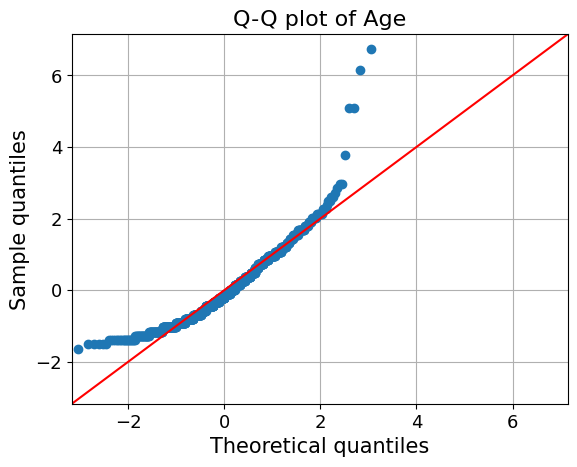

<Figure size 800x500 with 0 Axes>

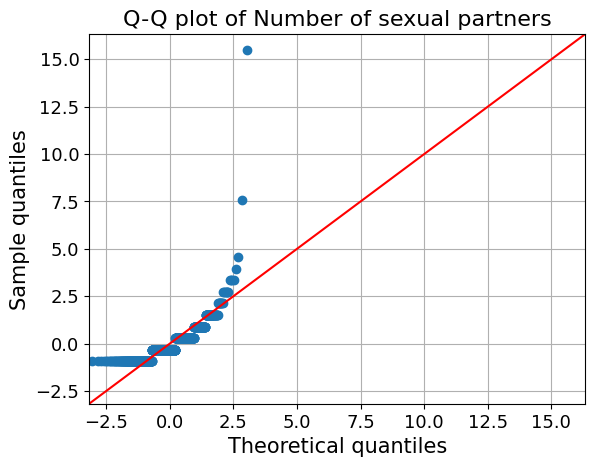

<Figure size 800x500 with 0 Axes>

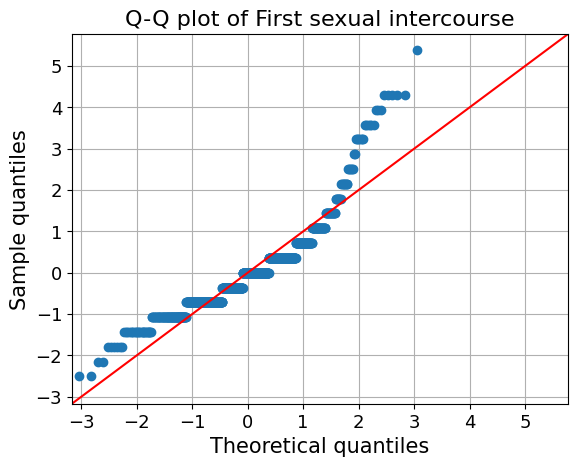

<Figure size 800x500 with 0 Axes>

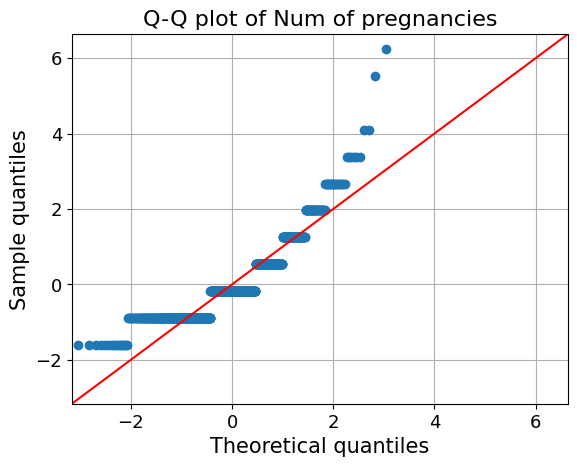

<Figure size 800x500 with 0 Axes>

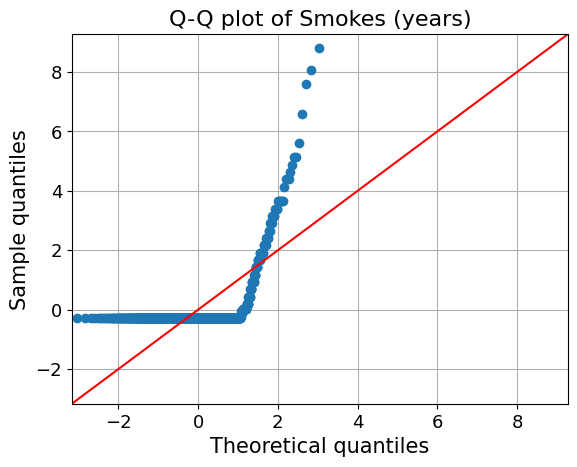

<Figure size 800x500 with 0 Axes>

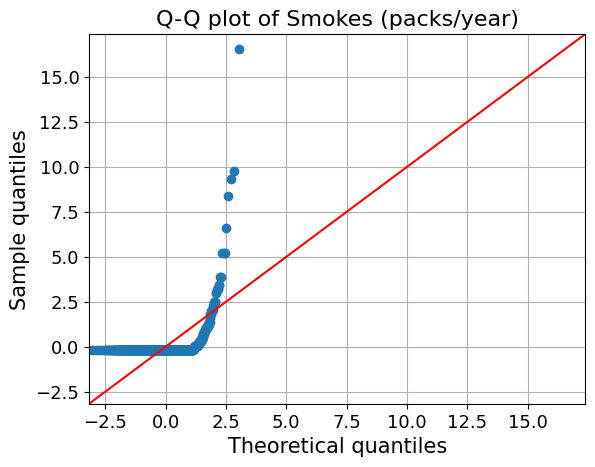

<Figure size 800x500 with 0 Axes>

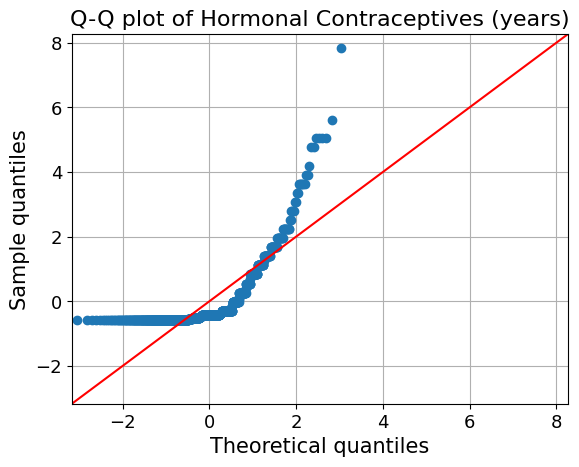

<Figure size 800x500 with 0 Axes>

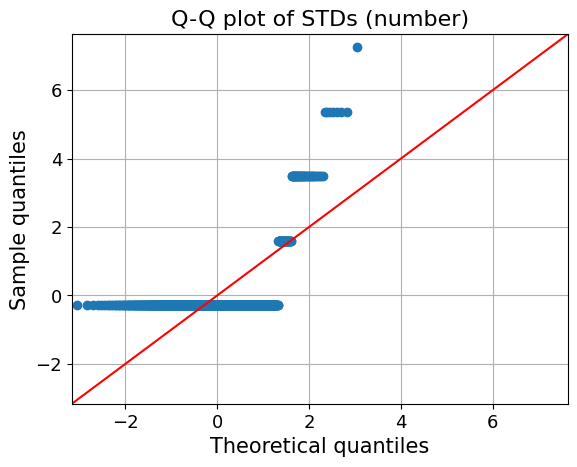

<Figure size 800x500 with 0 Axes>

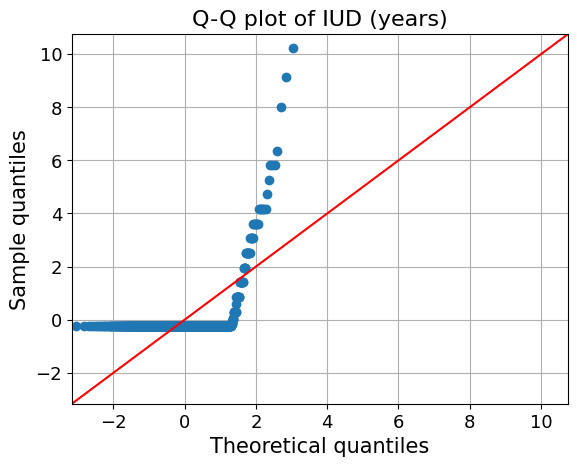

<Figure size 800x500 with 0 Axes>

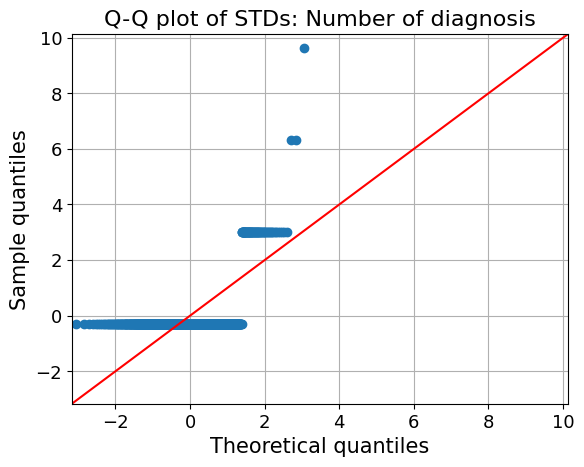

In [18]:
##QQplot Distribution
from statsmodels.graphics.gofplots import qqplot


for c in numerical_data:
    plt.figure(figsize=(8, 5))
    data = df[c].astype(float)
    fig = qqplot(data, line="45", fit="True")
    plt.xticks(fontsize=13)
    plt.yticks(fontsize=13)
    plt.xlabel("Theoretical quantiles", fontsize=15)
    plt.ylabel("Sample quantiles", fontsize=15)
    plt.title("Q-Q plot of {}".format(c), fontsize=16)
    plt.grid(True)
    plt.show()

<ipython-input-19-27ec16678b51>:18: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[i], hist=False)
<ipython-input-19-27ec16678b51>:18: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[i], hist=False)
<ipython-input-19-27ec16678b51>:18: UserWarning: 

`distplot` is a deprecate

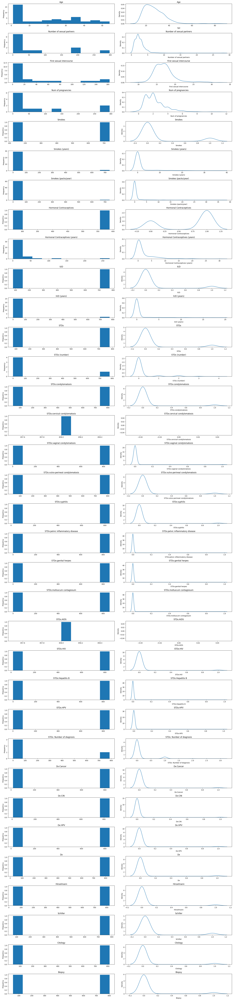

In [19]:
#Histogram and Dist Plots
j = 1
fig = plt.figure(figsize=(20, 90))
df= df.astype(float)
for i in df:

    # Ensure the subplot index is within the valid range
    if j <= 70:
        plt.subplot(36, 2, j)

        df[i].value_counts().plot(kind="hist")
        plt.title(i)

        j = j + 1

        plt.subplot(36, 2, j)

        sns.distplot(df[i], hist=False)
        plt.title(i)

        j = j + 1

plt.tight_layout()
plt.show()

<Axes: >

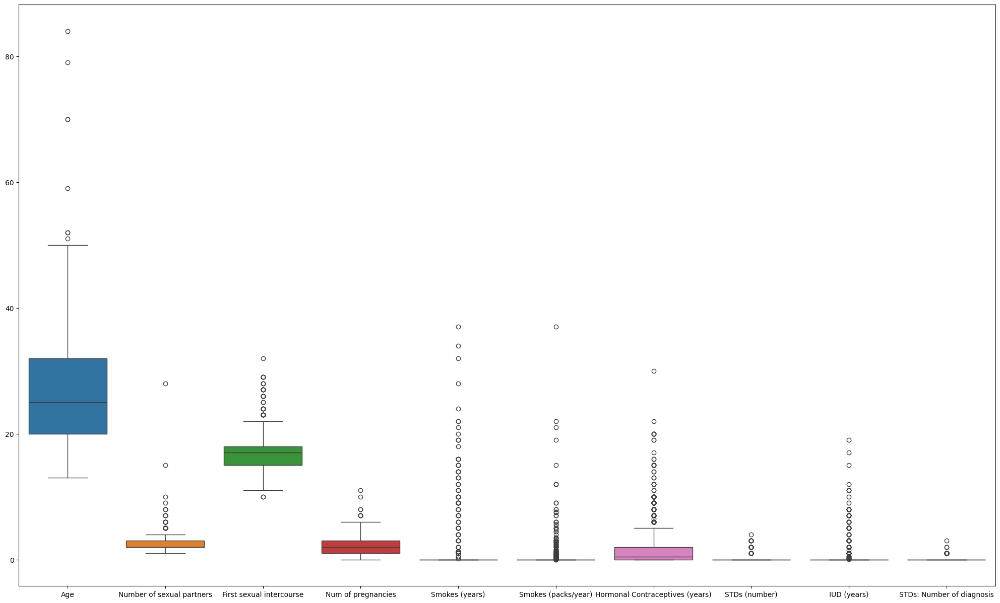

In [20]:
#Box Plot Analysis
plt.figure(figsize=[25, 15])
sns.boxplot(data=df[numerical_data])

The numeric variables in the dataset likely exhibit right-skewed distributions, indicating that most data points are concentrated on the lower end of the scale with a few extreme values towards the higher end. Outliers are present, further distorting the distributions which is observed in Boxplots.Additionally, the data does not adhere to a normal distibution, as observed in Q-Q plots and histograms.Based on the visualizations the distributions of the variables appear to be not normal. They exhibit skewness and contain outliers, indicating deviations from a symmetrical, bell-shaped distribution.

### Checking the Correlation between all the variables

In [21]:
#Checking the correlation between all the columns
df.corr()

,Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,...,STDs:HPV,STDs: Number of diagnosis,Dx:Cancer,Dx:CIN,Dx:HPV,Dx,Hinselmann,Schiller,Citology,Biopsy
Age,1.000000,0.085971,0.369175,0.525892,0.057204,0.218261,0.131861,0.029201,0.295267,0.279429,...,0.040861,-0.001606,0.110340,0.061443,0.101722,0.092635,-0.003967,0.103283,-0.016862,0.055956
Number of sexual partners,0.085971,1.000000,-0.145847,0.077439,0.236858,0.175729,0.174968,0.004027,0.021188,0.032460,...,0.014360,0.053056,0.023699,0.016669,0.028646,0.024597,-0.039098,-0.007230,0.024067,-0.000408
First sexual intercourse,0.369175,-0.145847,1.000000,-0.056374,-0.123280,-0.058207,-0.056232,-0.009232,0.025071,-0.010758,...,0.034728,-0.013331,0.067281,-0.032628,0.043964,0.035748,-0.016549,0.003489,-0.010974,0.007259
Num of pregnancies,0.525892,0.077439,-0.056374,1.000000,0.081517,0.175832,0.096976,0.118938,0.218805,0.204501,...,-0.026153,0.034912,0.036962,-0.002600,0.048578,0.014227,0.037809,0.085810,-0.027675,0.040215
Smokes,0.057204,0.236858,-0.123280,0.081517,1.000000,0.723572,0.493843,0.004036,0.041979,-0.055115,...,0.049193,0.090725,-0.013470,-0.042119,0.009737,-0.069396,0.033333,0.052028,-0.004639,0.028724
Smokes (years),0.218261,0.175729,-0.058207,0.175832,0.723572,1.000000,0.724320,-0.013888,0.052006,0.027492,...,0.051201,0.078303,0.052859,-0.030476,0.055398,-0.050213,0.070352,0.093479,-0.007275,0.061204
Smokes (packs/year),0.131861,0.174968,-0.056232,0.096976,0.493843,0.724320,1.000000,0.001713,0.043262,0.008226,...,-0.008015,0.029912,0.107229,-0.020800,0.109118,-0.034270,0.026086,0.017200,0.004250,0.024487
Hormonal Contraceptives,0.029201,0.004027,-0.009232,0.118938,0.004036,-0.013888,0.001713,1.000000,0.385833,0.000188,...,0.032666,-0.062199,0.011278,-0.004397,0.028808,-0.007245,0.012360,-0.034002,-0.025116,-0.018015
Hormonal Contraceptives (years),0.295267,0.021188,0.025071,0.218805,0.041979,0.052006,0.043262,0.385833,1.000000,0.110677,...,0.053756,-0.028285,0.062971,0.003793,0.065640,-0.009136,0.051093,0.096702,0.082537,0.094164
IUD,0.279429,0.032460,-0.010758,0.204501,-0.055115,0.027492,0.008226,0.000188,0.110677,1.000000,...,-0.015819,0.035791,0.117166,0.043708,0.062142,0.135778,0.052108,0.096089,0.013292,0.059231


In [22]:
#Dropping the STDs: AIDS and STDs:cervical condylomatosis columns as its giving Nan values in  correlation
df= df.drop(columns=['STDs:cervical condylomatosis', 'STDs:AIDS'])

**Plotted HeatMap**

<Axes: >

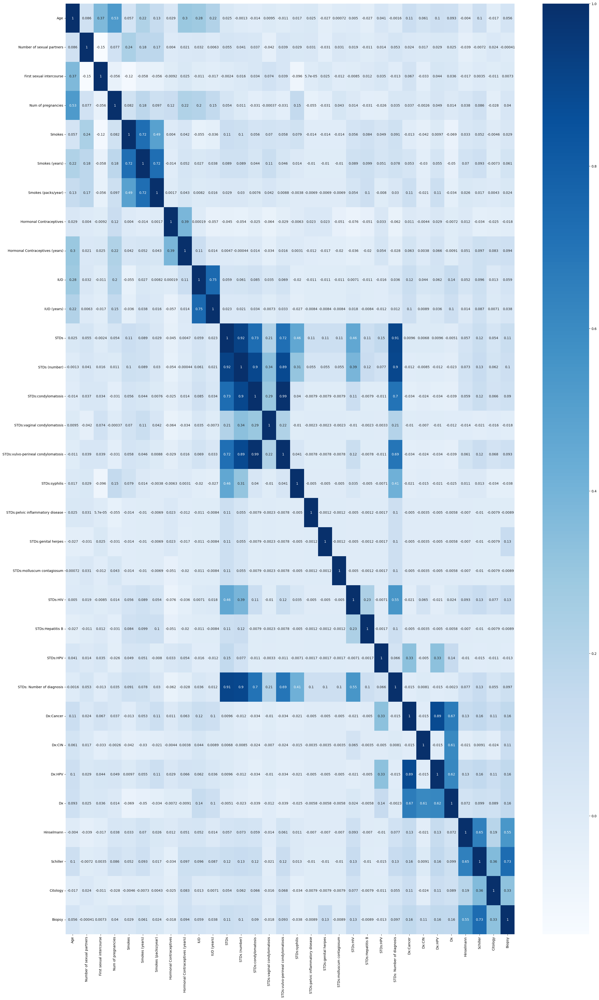

In [23]:
# Plotting the heatmap to check the co-relation
plt.figure(figsize=(30,50))
sns.heatmap(df.corr(), annot=True, cmap="Blues")

Based on the correlation matrix, it appears that some predictor variables are not entirely independent of each other. Many variables show some level of correlation, indicating potential relationships or dependencies among them.
Here are some of the pairs with the highest correlation coefficients:
Dx:HPV and Dx:HPV (correlation of 1, which makes sense since it's the same variable)Dx:Cancer and Dx:HPV (correlation of 0.886508)
Dx and Dx:HPV (correlation of 0.616327)
Dx:HPV and Schiller (correlation of 0.157812)
These variables exhibit the strongest correlations among the ones provided.

In [24]:
# Using OLS for finding the p value to check the significant features
import statsmodels.api as sm

model = sm.OLS(
    df["Dx:Cancer"],
    df[
        [
        "Age",
        "Number of sexual partners",
        "First sexual intercourse",
        "Num of pregnancies",
        "Smokes",
        "Smokes (years)",
        "Smokes (packs/year)",
        "Hormonal Contraceptives",
        "Hormonal Contraceptives (years)",
        "IUD",
        "IUD (years)",
        "STDs",
        "STDs (number)",
        "STDs:condylomatosis",
        "STDs:vaginal condylomatosis",
        "STDs:vulvo-perineal condylomatosis",
        "STDs:syphilis",
        "STDs:pelvic inflammatory disease",
        "STDs:genital herpes",
        "STDs:molluscum contagiosum",
        "STDs:HIV",
        "STDs:Hepatitis B",
        "STDs: Number of diagnosis",
        "Dx:CIN",
        "Dx:HPV",
        "Dx",
        "Hinselmann",
        "Schiller",
        "Citology",
        "Biopsy"
        ]
    ],
).fit()

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:              Dx:Cancer   R-squared (uncentered):                   0.864
Model:                            OLS   Adj. R-squared (uncentered):              0.859
Method:                 Least Squares   F-statistic:                              174.7
Date:                Wed, 03 Apr 2024   Prob (F-statistic):                        0.00
Time:                        03:20:42   Log-Likelihood:                          1294.9
No. Observations:                 858   AIC:                                     -2530.
Df Residuals:                     828   BIC:                                     -2387.
Df Model:                          30                                                  
Covariance Type:            nonrobust                                                  
======================================================================================================
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Age                                 6.377e-07      0.000      0.002      0.998      -0.001       0.001
Number of sexual partners             -0.0004      0.001     -0.315      0.753      -0.003       0.002
First sexual intercourse               0.0003      0.000      0.556      0.578      -0.001       0.001
Num of pregnancies                    -0.0014      0.002     -0.849      0.396      -0.005       0.002
Smokes                                -0.0187      0.008     -2.350      0.019      -0.034      -0.003
Smokes (years)                         0.0004      0.001      0.465      0.642      -0.001       0.002
Smokes (packs/year)                    0.0052      0.001      4.104      0.000       0.003       0.008
Hormonal Contraceptives               -0.0046      0.004     -1.054      0.292      -0.013       0.004
Hormonal Contraceptives (years)        0.0014      0.001      2.260      0.024       0.000       0.003
IUD                                   -0.0015      0.010     -0.152      0.880      -0.021       0.018
IUD (years)                            0.0025      0.002      1.610      0.108      -0.001       0.006
STDs                                  -0.0025      0.023     -0.107      0.915      -0.049       0.044
STDs (number)                          0.2816      0.049      5.778      0.000       0.186       0.377
STDs:condylomatosis                   -0.2517      0.078     -3.235      0.001      -0.404      -0.099
STDs:vaginal condylomatosis           -0.2800      0.058     -4.869      0.000      -0.393      -0.167
STDs:vulvo-perineal condylomatosis    -0.2897      0.080     -3.615      0.000      -0.447      -0.132
STDs:syphilis                         -0.2519      0.044     -5.663      0.000      -0.339      -0.165
STDs:pelvic inflammatory disease      -0.2513      0.069     -3.619      0.000      -0.388      -0.115
STDs:genital herpes                   -0.2666      0.071     -3.770      0.000      -0.405      -0.128
STDs:molluscum contagiosum            -0.2490      0.070     -3.576      0.000      -0.386      -0.112
STDs:HIV                              -0.2596      0.046     -5.685      0.000      -0.349      -0.170
STDs:Hepatitis B                      -0.2995      0.073     -4.101      0.000      -0.443      -0.156
STDs: Number of diagnosis             -0.0271      0.020     -1.379      0.168      -0.066       0.011
Dx:CIN                                -0.4849      0.031    -15.790      0.000      -0.545      -0.425
Dx:HPV                                 0.4965      0.023     21.253      0.000       0.451       0.542
Dx                                     0.4787      0.024     19.653      0.000       0.431       0.5

 The relationship between the independent variables (predictors) and the dependent variable (Dx:Cancer) is significant. This is indicated by several factors: The R-squared value is 0.852
 , indicating that approximately 85.2% of the variance in the dependent variable (Dx:Cancer) can be explained by the independent variables included in the model. Many of the independent variables have p-values less than 0.05. This indicates that these variables are statistically significant predictors of the dependent variable. For example, variables such as "Smokes (packs/year)", "STDs (number)", "Dx:CIN", "Dx:HPV", and "Dx" have p-values less than 0.05

## **Training and Testing Data**

In [25]:
#Training and Testing the Model
from sklearn.model_selection import train_test_split

X = df[
    [
        "Age",
        "Number of sexual partners",
        "First sexual intercourse",
        "Num of pregnancies",
        "Smokes",
        "Smokes (years)",
        "Smokes (packs/year)",
        "Hormonal Contraceptives",
        "Hormonal Contraceptives (years)",
        "IUD",
        "IUD (years)",
        "STDs",
        "STDs (number)",
        "STDs:condylomatosis",
        "STDs:vaginal condylomatosis",
        "STDs:vulvo-perineal condylomatosis",
        "STDs:syphilis",
        "STDs:pelvic inflammatory disease",
        "STDs:genital herpes",
        "STDs:molluscum contagiosum",
        "STDs:HIV",
        "STDs:Hepatitis B",
        "STDs: Number of diagnosis",
        "Dx:CIN",
        "Dx:HPV",
        "Dx",
        "Hinselmann",
        "Schiller",
        "Citology",
        "Biopsy",
    ]
]

y = df["Dx:Cancer"]

# Spliting data into Training 90%, Test set 10%

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=1)

The training set (X_train and y_train) contains 90% of the original data and is used to train the machine learning model. The test set (X_test and y_test) contains the remaining 10% of the data and is used to evaluate the performance of the trained model.

In [26]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

model = LogisticRegression()
model.fit(X_train, y_train)
prediction = model.predict(X_test)
accuracyScore = accuracy_score(prediction, y_test)
print(accuracyScore)

0.9651162790697675


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


## **Feature Selection**

**Ranking the Important features from Logistic Regression**

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


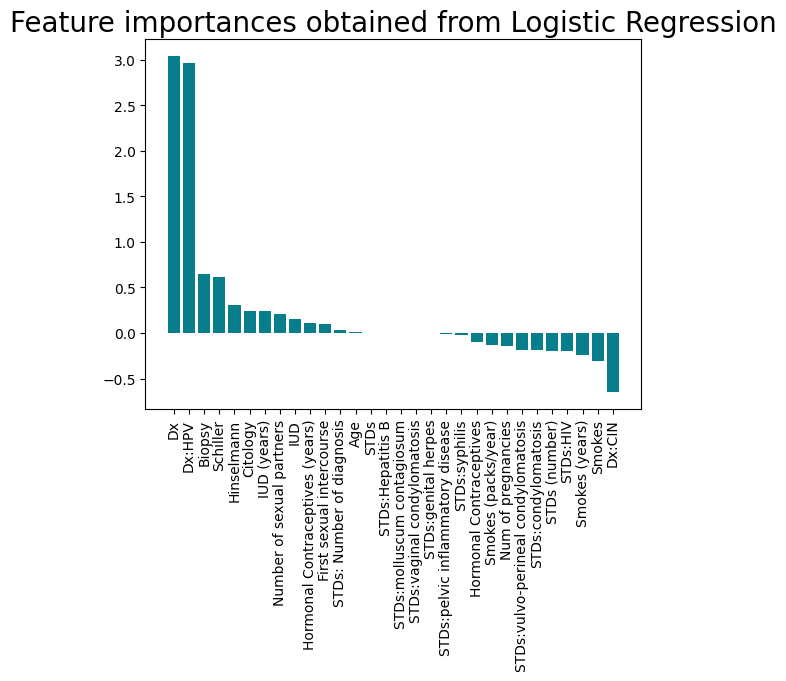

In [27]:
#Feature importance using logistic regression
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
model.fit(X_train, y_train)
importances = pd.DataFrame(
    data={"Attribute": X_train.columns, "Importance": model.coef_[0]}
)
importances = importances.sort_values(by="Importance", ascending=False)

plt.bar(x=importances["Attribute"], height=importances["Importance"], color="#087E8B")
plt.title("Feature importances obtained from Logistic Regression", size=20)
plt.xticks(rotation="vertical")
plt.show()

**Ranking the important features from Random Forest**

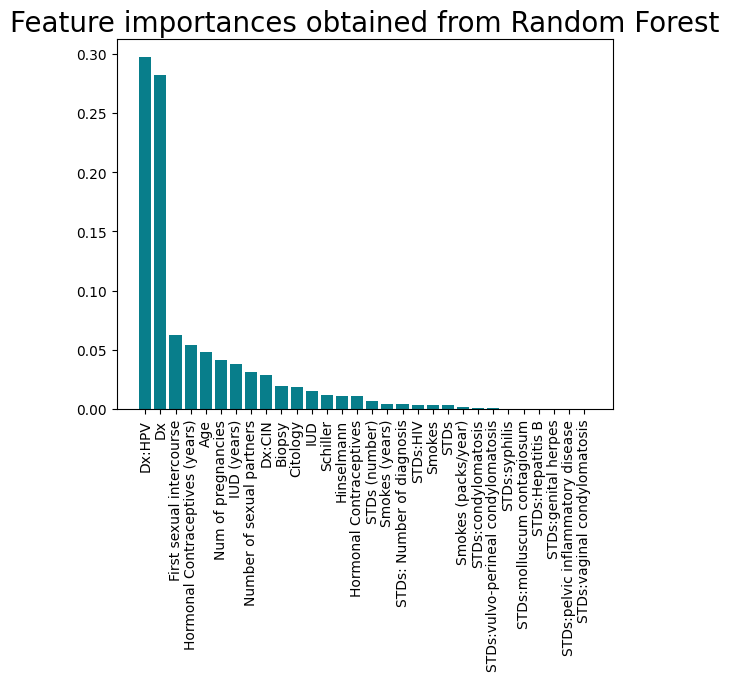

In [28]:
#Feature importance using random forest
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier()
model.fit(X_train, y_train)
importances = pd.DataFrame(
    data={"Attribute": X_train.columns, "Importance": model.feature_importances_}
)
importances = importances.sort_values(by="Importance", ascending=False)

plt.bar(x=importances["Attribute"], height=importances["Importance"], color="#087E8B")
plt.title("Feature importances obtained from Random Forest", size=20)
plt.xticks(rotation="vertical")
plt.show()

**Ranking the important features from Xgboost**

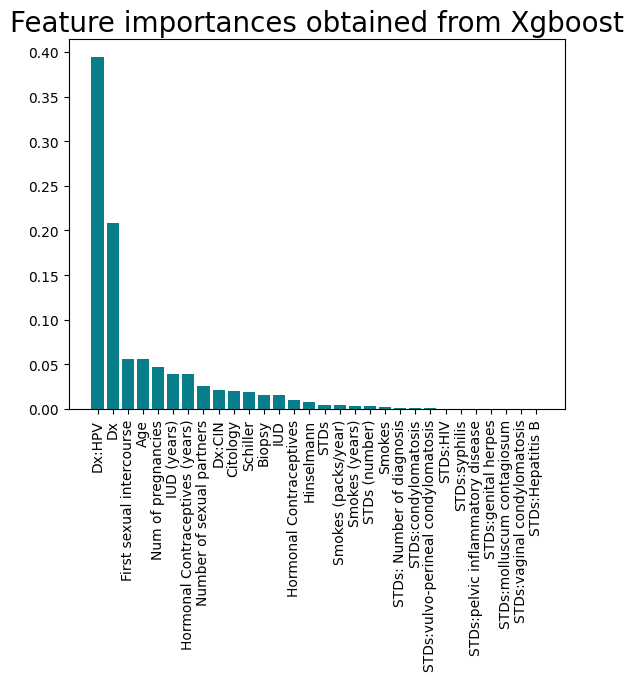

In [29]:
#Feature importance using Xgboost
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier()
model.fit(X_train, y_train)
importances = pd.DataFrame(
    data={"Attribute": X_train.columns, "Importance": model.feature_importances_}
)
importances = importances.sort_values(by="Importance", ascending=False)

plt.bar(x=importances["Attribute"], height=importances["Importance"], color="#087E8B")
plt.title("Feature importances obtained from Xgboost", size=20)
plt.xticks(rotation="vertical")
plt.show()

The most important predictor variables, found from various feature importance methods such as Logistic regression identifies: Dx, Dx:HPV,IUD
 as important. A random forest classifier identifies Dx:HPV, Dx, first sexual intercourse as significant variables. XGBoost emphasizes Dx:HPV, Dx, Age.The most important features or independant variables useful to predict the risk of cervical cancer, according to the Random Forest Classifier, XGBoost, and Logistic Regression methods, are diagnosis outcomes (Dx:HPV, Dx), age, duration of hormonal contraceptive use, and possibly age at first sexual intercourse. These consistent results highlight the significance of age, history of hormonal contraception, and diagnostic results in predicting the risk of cervical cancer.

In [30]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report

# Define the decision tree model
treemodel = DecisionTreeClassifier()

# Define the parameters for grid search
parameter = {"criterion": ["gini", "entropy"], "max_depth": [1, 2, 3, 4, 5]}

# Perform grid search
cv = GridSearchCV(treemodel, parameter, scoring="accuracy", cv=5)
cv.fit(X_train, y_train)
best_params = cv.best_params_

# Get predictions
y_predtree = cv.predict(X_test)

# Calculate accuracy
dttrain = accuracy_score(y_train, cv.predict(X_train))
dttest = accuracy_score(y_test, cv.predict(X_test))

# Print classification report
print(classification_report(y_predtree, y_test))

              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99        83
         1.0       0.75      1.00      0.86         3

    accuracy                           0.99        86
   macro avg       0.88      0.99      0.93        86
weighted avg       0.99      0.99      0.99        86



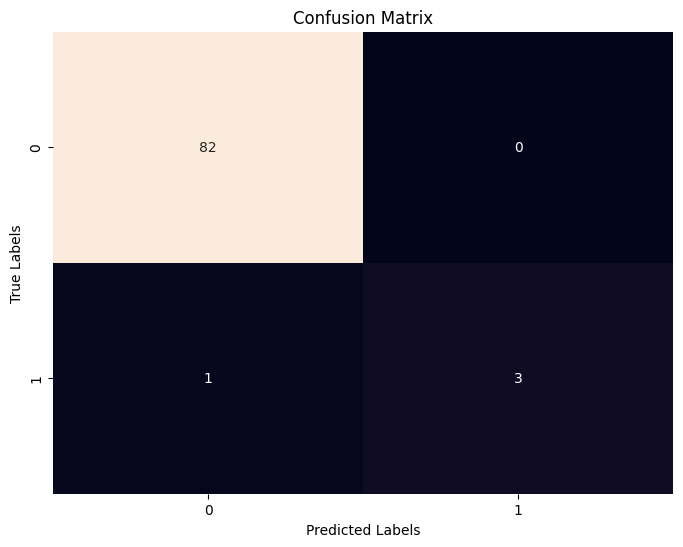

In [31]:
# Calculating the confusion matrix
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Calculate confusion matrix
conmat = confusion_matrix(y_test, y_predtree)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conmat, annot=True, cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

## **Outlier Detection**


In [32]:
from datasist.structdata import detect_outliers
df
index = detect_outliers (
    df,
    0,
    [
      'Age',
      'Number of sexual partners',
      'First sexual intercourse',
      'Num of pregnancies',
      'Smokes (years)',
      'Smokes (packs/year)',
      'Hormonal Contraceptives (years)',
      'STDs (number)',
      'IUD (years)',
      'STDs: Number of diagnosis'
    ],
)
len(index)

381

In [33]:
for col in df[
    [
      'Age',
      'Number of sexual partners',
      'First sexual intercourse',
      'Num of pregnancies',
      'Smokes (years)',
      'Smokes (packs/year)',
      'Hormonal Contraceptives (years)',
      'STDs (number)',
      'IUD (years)',
      'STDs: Number of diagnosis'
    ]
]:
    outliers_indices = detect_outliers(df, 0, [col])
    col_median = df[col].median()
    df[col].iloc[outliers_indices] = col_median

<Axes: >

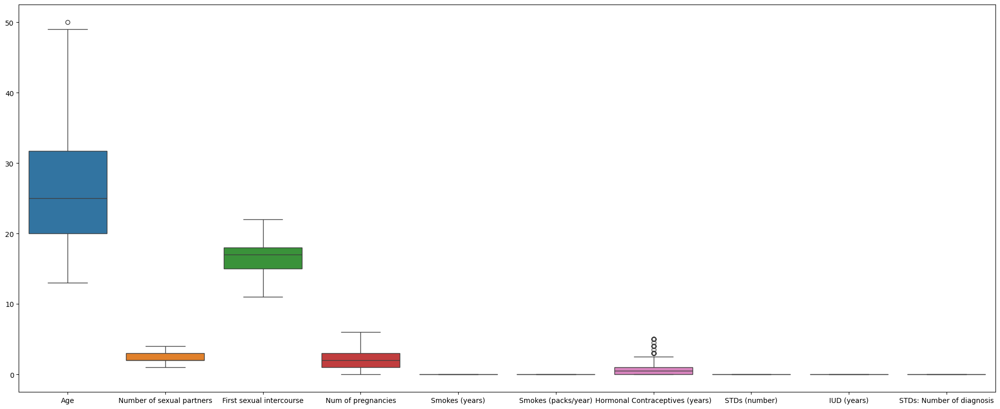

In [34]:
 plt.figure(figsize=[25, 10])
 sns.boxplot(data=df[numerical_data])

In [35]:
from sklearn.model_selection import train_test_split

X = df[
    [
        "Age",
        "Number of sexual partners",
        "First sexual intercourse",
        "Num of pregnancies",
        "Smokes",
        "Smokes (years)",
        "Smokes (packs/year)",
        "Hormonal Contraceptives",
        "Hormonal Contraceptives (years)",
        "IUD",
        "IUD (years)",
        "STDs",
        "STDs (number)",
        "STDs:condylomatosis",
        "STDs:vaginal condylomatosis",
        "STDs:vulvo-perineal condylomatosis",
        "STDs:syphilis",
        "STDs:pelvic inflammatory disease",
        "STDs:genital herpes",
        "STDs:molluscum contagiosum",
        "STDs:HIV",
        "STDs:Hepatitis B",
        "STDs: Number of diagnosis",
        "Dx:CIN",
        "Dx:HPV",
        "Dx",
        "Hinselmann",
        "Schiller",
        "Citology",
        "Biopsy",

    ]
]

y = df["Dx:Cancer"]

# Spliting data into Training 90%, Test set 10%

X_train_p1, X_test_p1, y_train_p1, y_test_p1 = train_test_split(X, y, test_size=0.1, random_state=1)

In [36]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

model = LogisticRegression()
model.fit(X_train_p1, y_train_p1)
prediction = model.predict(X_test_p1)
accuracyScore = accuracy_score(prediction, y_test_p1)
print(accuracyScore)

0.9767441860465116


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [37]:
# Make predictions using the testing set
y_pred = model.predict(X_test_p1)
# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_test_p1, y_pred))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test_p1, y_pred))
r2 = r2_score(y_test_p1, y_pred)
print("R^2 score on test set =", r2)

Mean squared error: 0.02
Coefficient of determination: 0.48
R^2 score on test set = 0.47560975609756106


Before removing outliers: Accuracy Score: 96.51%, Mean Squared Error: 0.03,Coefficient of Determination (R^2 score): 0.21. After removing outliers:
Accuracy Score: 97.67%, Mean Squared Error: 0.02, Coefficient of Determination (R^2 score): 0.48 Removing outliers has a positive effect on the predictive model's performance

## **Modeling & Interpretability**

 ### Fitted a linear model and interpreted the regression coefficients

In [38]:
linear_model = LinearRegression()
linear_model.fit(X_train_p1, y_train_p1)
linear_model.score(X_test_p1, y_test_p1)

0.7939004665917567

In [39]:
# Make predictions using the testing set
y_pred = linear_model.predict(X_test_p1)
# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_test_p1, y_pred))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test_p1, y_pred))
r2 = r2_score(y_test_p1, y_pred)
print("R^2 score on test set =", r2)

Mean squared error: 0.01
Coefficient of determination: 0.79
R^2 score on test set = 0.7939004665917567


In [40]:
#Using OLS for finding the p value to check the significant features
import statsmodels.api as sm

model = sm.OLS(y_train_p1, X_train_p1).fit()

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:              Dx:Cancer   R-squared (uncentered):                   0.847
Model:                            OLS   Adj. R-squared (uncentered):              0.842
Method:                 Least Squares   F-statistic:                              165.5
Date:                Wed, 03 Apr 2024   Prob (F-statistic):                   1.27e-284
Time:                        03:20:45   Log-Likelihood:                          1177.2
No. Observations:                 772   AIC:                                     -2304.
Df Residuals:                     747   BIC:                                     -2188.
Df Model:                          25                                                  
Covariance Type:            nonrobust                                                  
======================================================================================================
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Age                                    0.0002      0.000      0.650      0.516      -0.000       0.001
Number of sexual partners             -0.0007      0.002     -0.317      0.751      -0.005       0.004
First sexual intercourse            -5.38e-05      0.001     -0.107      0.915      -0.001       0.001
Num of pregnancies                    -0.0009      0.002     -0.493      0.622      -0.004       0.003
Smokes                                -0.0060      0.006     -1.031      0.303      -0.017       0.005
Smokes (years)                     -1.312e-15   1.62e-16     -8.110      0.000   -1.63e-15   -9.95e-16
Smokes (packs/year)                -1.756e-16   3.43e-17     -5.127      0.000   -2.43e-16   -1.08e-16
Hormonal Contraceptives               -0.0012      0.005     -0.264      0.792      -0.011       0.008
Hormonal Contraceptives (years)       -0.0002      0.002     -0.108      0.914      -0.004       0.003
IUD                                    0.0105      0.007      1.464      0.144      -0.004       0.025
IUD (years)                        -2.902e-16   2.81e-17    -10.340      0.000   -3.45e-16   -2.35e-16
STDs                                7.996e-05      0.022      0.004      0.997      -0.044       0.044
STDs (number)                       1.576e-16   5.94e-17      2.653      0.008     4.1e-17    2.74e-16
STDs:condylomatosis                   -0.0185      0.070     -0.265      0.791      -0.156       0.119
STDs:vaginal condylomatosis            0.0085      0.039      0.216      0.829      -0.069       0.086
STDs:vulvo-perineal condylomatosis     0.0121      0.066      0.183      0.855      -0.118       0.142
STDs:syphilis                          0.0026      0.023      0.112      0.911      -0.043       0.048
STDs:pelvic inflammatory disease      -0.0019      0.058     -0.032      0.974      -0.116       0.113
STDs:genital herpes                   -0.0250      0.059     -0.424      0.672      -0.141       0.091
STDs:molluscum contagiosum             0.0015      0.058      0.026      0.979      -0.113       0.116
STDs:HIV                              -0.0089      0.022     -0.399      0.690      -0.053       0.035
STDs:Hepatitis B                       0.0139      0.056      0.248      0.805      -0.096       0.124
STDs: Number of diagnosis           3.712e-17   1.27e-17      2.927      0.004    1.22e-17     6.2e-17
Dx:CIN                                -0.6015      0.033    -18.289      0.000      -0.666      -0.537
Dx:HPV                                 0.3811      0.025     14.994      0.000       0.331       0.431
Dx                                     0.5908      0.026     22.397      0.000       0.539       0.6


The linear regression model aimed to predict cancer presence (Dx:Cancer) by considering multiple features. While certain coefficients suggest potential associations between specific features and cancer presence, several predictors lack statistical significance. Overall, the model shows a satisfactory fit, explaining approximately 84.7% of the variability in cancer presence.

### Fitted a Random Forest model and interpreted the nodes

In [41]:
random_model = RandomForestClassifier(max_depth=5, random_state=0, n_estimators=10)
random_model.fit(X_train_p1, y_train_p1)
random_model.score(X_test_p1,y_test_p1)

0.9767441860465116

In [42]:
# Make predictions using the testing set
y_pred = random_model.predict(X_test_p1)
# The mean squared error
print('Mean squared error: %.2f'% mean_squared_error(y_test_p1, y_pred))
# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f'% r2_score(y_test_p1, y_pred))
r2 = r2_score(y_test_p1,y_pred)
print('R^2 score on test set =',r2)

Mean squared error: 0.02
Coefficient of determination: 0.48
R^2 score on test set = 0.47560975609756106


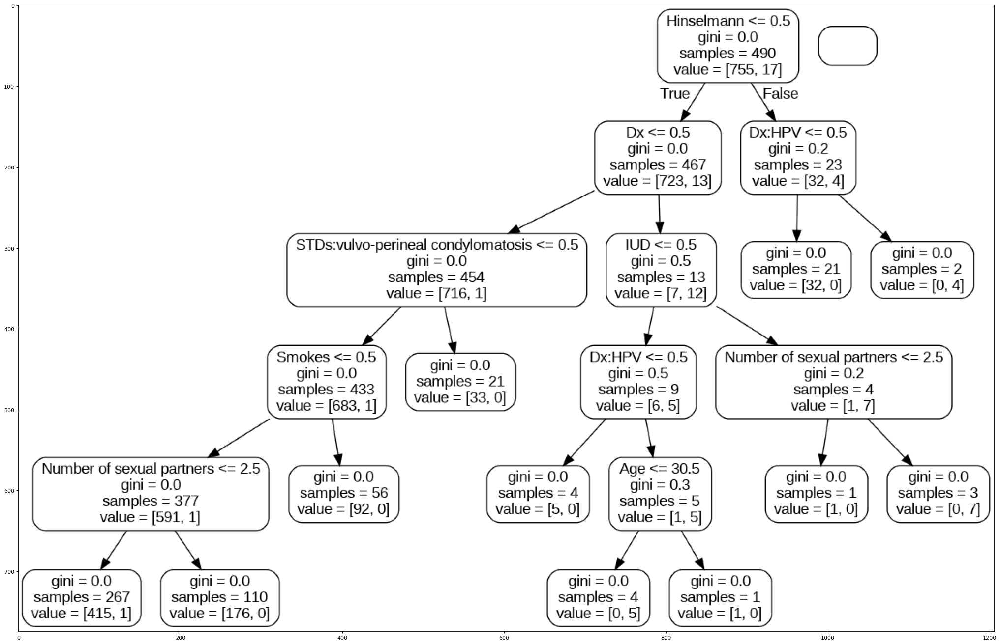

In [43]:
from matplotlib.pyplot import figure
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns
from sklearn.tree import export_graphviz
import pydot
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

plt.rcParams["figure.figsize"] = (32, 24)

# Visualization of Nodes for the purpose of explainability
figure(figsize=(32, 24), dpi=80)
tree = random_model.estimators_[0]
export_graphviz(
    tree,
    out_file="tree.dot",
    feature_names=list(X_train_p1.columns),
    rounded=True,
    precision=1,
)
(graph,) = pydot.graph_from_dot_file("tree.dot")
graph.write_png("tree.png")
img = mpimg.imread("tree.png")
imgplot = plt.imshow(img)
plt.show()

The random forest has been trained to make decisions based on several features to the prediction cervical cancer risk classification.

The top node splits the dataset based on the feature "Hinselmann". If the value for "Hinselmann" is less than or equal to 0.5, it goes to the left branch; otherwise, it goes to the right branch.

Each internal node represents a feature used for making a decision. Features such as "STDs:vulvo-perineal condylomatosis", "IUD", "Dx:HPV", and "Number of sexual partners" are used for binary splits. The splits are based on whether the feature value is less than or equal to a certain threshold.

The Gini index is used to measure impurity at each node. A Gini index of 0 indicates perfect separation, meaning all samples at that node belong to a single class.

"Samples" count indicates the number of instances from the training set that fall into a particular node. "Value" shows the distribution of classes for the samples at that node, typically represented as counts of negative and positive classes.

Terminal nodes indicate the final decision of the classification. Some leaves perfectly classify all samples into one class (Gini = 0), while others might have some impurity.

The tree structure provides insight into important features and their thresholds for the prediction task. For instance, individuals with specific combinations of features, such as "Hinselmann" and "STDs:vulvo-perineal condylomatosis", are predicted with high certainty, indicated by low Gini indices and clear class distributions. Overall, this summary offers valuable insights into how the decision tree model makes predictions by recursively partitioning the feature space based on the most informative features and their corresponding thresholds.

### Used Auto ML to find the best model

In [44]:
import h2o
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.22" 2024-01-16; OpenJDK Runtime Environment (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1); OpenJDK 64-Bit Server VM (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpoe4tt688
  JVM stdout: /tmp/tmpoe4tt688/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpoe4tt688/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.1
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_0338yg
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.170 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


**Checked VIF(multicollinearity)**

VIF, or Variance Inflation Factor, serves as a measure within regression analysis to detect multicollinearity, particularly in models featuring numerous predictor variables. It gauges the extent to which the variance of a regression coefficient is elevated due to correlations among predictors. Elevated VIF values imply robust correlations between predictors, leading to unstable coefficient estimates and challenges in model interpretation. Each predictor's VIF is computed based on its squared multiple correlation coefficient when regressed against other predictors. Typically, a VIF surpassing 10 indicates multicollinearity, though this threshold may vary depending on the scenario. Managing multicollinearity often involves strategies such as removing correlated predictors, consolidating them into composite variables, or employing regularization methods.

In [45]:
# the independent variables set
from statsmodels.stats.outliers_influence import variance_inflation_factor
X = df[[
        "Age",
        "Number of sexual partners",
        "First sexual intercourse",
        "Num of pregnancies",
        "Smokes",
        "Smokes (years)",
        "Smokes (packs/year)",
        "Hormonal Contraceptives",
        "Hormonal Contraceptives (years)",
        "IUD",
        "IUD (years)",
        "STDs",
        "STDs (number)",
        "STDs:condylomatosis",
        "STDs:vaginal condylomatosis",
        "STDs:vulvo-perineal condylomatosis",
        "STDs:syphilis",
        "STDs:pelvic inflammatory disease",
        "STDs:genital herpes",
        "STDs:molluscum contagiosum",
        "STDs:HIV",
        "STDs:Hepatitis B",
        "STDs: Number of diagnosis",
        "Dx:CIN",
        "Dx:HPV",
        "Dx",
        "Hinselmann",
        "Schiller",
        "Citology",
        "Biopsy"
      ]]

# VIF dataframe
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(X.values, i)
                          for i in range(len(X.columns))]

print(vif_data)

/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1784: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.uncentered_tss


                               feature        VIF
0                                  Age  21.393727
1            Number of sexual partners   7.153664
2             First sexual intercourse  19.606314
3                   Num of pregnancies   5.539665
4                               Smokes   1.281810
5                       Smokes (years)        NaN
6                  Smokes (packs/year)        NaN
7              Hormonal Contraceptives   4.069964
8      Hormonal Contraceptives (years)   1.836479
9                                  IUD   1.301464
10                         IUD (years)        NaN
11                                STDs  11.089466
12                       STDs (number)        NaN
13                 STDs:condylomatosis  66.095027
14         STDs:vaginal condylomatosis   1.479929
15  STDs:vulvo-perineal condylomatosis  58.630972
16                       STDs:syphilis   2.905846
17    STDs:pelvic inflammatory disease   1.151911
18                 STDs:genital herpes   1.182400


Based on the above Variance Inflation Factor (VIF) values for each feature, it appears that multicollinearity appers in the model. Multicollinearity occurs when independent variables in a regression model are highly correlated with each other.Variables such as "STDs (number)", "STDs:condylomatosis", "STDs:vulvo-perineal condylomatosis", "STDs:HIV", and "STDs: Number of diagnosis" have VIF values well above 10, indicating multicollinearity. Additionally, the variable "Age" also has a relatively high VIF value (24.301708), suggesting a high level of correlation with other independent variables.

In [46]:
#Training and Testing the Model for AutoML
from sklearn.model_selection import train_test_split


X = df[
    [
       "Number of sexual partners",
        "Num of pregnancies",
        "Smokes",
        "Hormonal Contraceptives",
        "Hormonal Contraceptives (years)",
        "IUD",
        "STDs:vaginal condylomatosis",
        "STDs:syphilis",
        "STDs:pelvic inflammatory disease",
        "STDs:genital herpes",
        "STDs:molluscum contagiosum",
        "STDs:HIV",
        "STDs:Hepatitis B",
        "Dx:CIN",
        "Dx:HPV",
        "Dx",
        "Hinselmann",
        "Schiller",
        "Citology",
        "Biopsy"
    ]
]

y = df["Dx:Cancer"]

#Spliting data into Training 70%, Test set 30%

Xaml_train, Xaml_test, yaml_train, yaml_test = train_test_split(X, y, test_size=0.3, random_state=1)

In [47]:
df2=df

In [48]:
df2.head()

,Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,...,STDs:HPV,STDs: Number of diagnosis,Dx:Cancer,Dx:CIN,Dx:HPV,Dx,Hinselmann,Schiller,Citology,Biopsy
0,18.0,4.0,15.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,15.0,1.0,14.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,34.0,1.0,17.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,25.0,2.0,16.0,4.0,1.0,0.0,0.0,1.0,3.0,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,46.0,3.0,21.0,4.0,0.0,0.0,0.0,1.0,0.5,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [49]:
df2= df2.drop( columns=['Age','First sexual intercourse','IUD (years)','STDs','STDs (number)','STDs:condylomatosis','STDs:vulvo-perineal condylomatosis','STDs: Number of diagnosis'])

In [50]:
df2= df2.drop(columns=['Smokes (years)','Smokes (packs/year)'])

In [51]:
print(df2.columns)

Index(['Number of sexual partners', 'Num of pregnancies', 'Smokes',
       'Hormonal Contraceptives', 'Hormonal Contraceptives (years)', 'IUD',
       'STDs:vaginal condylomatosis', 'STDs:syphilis',
       'STDs:pelvic inflammatory disease', 'STDs:genital herpes',
       'STDs:molluscum contagiosum', 'STDs:HIV', 'STDs:Hepatitis B',
       'STDs:HPV', 'Dx:Cancer', 'Dx:CIN', 'Dx:HPV', 'Dx', 'Hinselmann',
       'Schiller', 'Citology', 'Biopsy'],
      dtype='object')


In [52]:
dfaml = h2o.H2OFrame(df2)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [53]:
dfaml.head(5)

Number of sexual partners,Num of pregnancies,Smokes,Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,STDs:vaginal condylomatosis,STDs:syphilis,STDs:pelvic inflammatory disease,STDs:genital herpes,STDs:molluscum contagiosum,STDs:HIV,STDs:Hepatitis B,STDs:HPV,Dx:Cancer,Dx:CIN,Dx:HPV,Dx,Hinselmann,Schiller,Citology,Biopsy
4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,4,1,1,3,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0
3,4,0,1,0.5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [54]:
train, test = dfaml.split_frame(seed = 1234, destination_frames = ["train.hex", "test.hex"])
# check the number of train set and test set
train["is_train"] = 1
test["is_train"] = 0

drift_data = train.rbind(test)
drift_data["is_train"] = drift_data["is_train"].asfactor()
drift_data["is_train"].table()

is_train,Count
0,209
1,649


In [55]:
x = list(set(train.col_names) - set(["Dx:Cancer"]))

In [56]:
from h2o.automl import H2OAutoML
# Run AutoML for 10 base models (limited to 1 hour max runtime by default)
aml = H2OAutoML(max_models=10, seed=1234, sort_metric="MAE", project_name = "random_split")
aml.train(x=x, y="Dx:Cancer", training_frame=train)

AutoML progress: |
03:21:02.58: _train param, Dropping bad and constant columns: [STDs:molluscum contagiosum, is_train]
03:21:02.58: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

█
03:21:10.363: _train param, Dropping bad and constant columns: [STDs:molluscum contagiosum, is_train]
03:21:10.363: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

█
03:21:11.798: _train param, Dropping bad and constant columns: [STDs:molluscum contagiosum, is_train]
03:21:11.798: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to cate

key,value
Stacking strategy,cross_validation
Number of base models (used / total),3/5
# GBM base models (used / total),0/1
# XGBoost base models (used / total),1/1
# DRF base models (used / total),1/2
# GLM base models (used / total),1/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5
Metalearner fold_column,None



The stacked ensemble model exhibits strong predictive performance, as evidenced by its performance metrics on both the training and test datasets. On the training data, the model achieved an impressively low MSE of 0.0006, indicating a high level of accuracy in predicting the target variable. Additionally, the RMSE and MAE values, at 0.0245 and 0.0043 respectively, further underscore the model's precision in capturing the variability of the data. The R-squared value of 0.964 suggests that the model accounts for approximately 96.4% of the variance in the target variable, indicating a good fit to the training data.When evaluated on the test data, the model maintained strong performance with a slightly higher MSE of 0.0052 and RMSE of 0.0723, indicating a small increase in prediction error compared to the training set. The MAE value of 0.0153 suggests that, on average, the model's predictions deviate by approximately 1.53 units from the actual values in the test dataset. The RMSLE value of 0.0464 indicates the relative performance of the model on data points with higher actual values. Despite these slightly higher error metrics compared to the training data, the model still demonstrates a high level of predictive accuracy, with an R-squared value of 0.838, indicating that it explains approximately 83.8% of the variance in the test data. The negative AIC value of -494.68 further confirms the superiority of the model over a null model when applied to unseen data. Overall, these results suggest that the stacked ensemble model generalizes well to new data and reliably predicts the target variable across different datasets.

In [57]:
# View the AutoML Leaderboard
lb = aml.leaderboard
lb.head()

model_id,mae,rmse,mse,rmsle,mean_residual_deviance
StackedEnsemble_BestOfFamily_1_AutoML_1_20240403_32101,0.009926,0.0635028,0.0040326,0.0415816,0.0040326
DRF_1_AutoML_1_20240403_32101,0.0101439,0.0632691,0.00400297,0.0412177,0.00400297
XGBoost_3_AutoML_1_20240403_32101,0.0102457,0.063886,0.00408142,0.0419112,0.00408142
StackedEnsemble_AllModels_1_AutoML_1_20240403_32101,0.0107873,0.0632285,0.00399785,0.0418162,0.00399785
GLM_1_AutoML_1_20240403_32101,0.0120865,0.0635617,0.00404009,0.0414078,0.00404009
XGBoost_2_AutoML_1_20240403_32101,0.0179574,0.0737637,0.00544108,0.0507018,0.00544108
GBM_2_AutoML_1_20240403_32101,0.0245392,0.0991984,0.00984032,0.0689777,0.00984032
GBM_4_AutoML_1_20240403_32101,0.0250981,0.099127,0.00982616,0.0691502,0.00982616
GBM_3_AutoML_1_20240403_32101,0.0257692,0.0987054,0.00974276,0.0693031,0.00974276
GBM_1_AutoML_1_20240403_32101,0.0324989,0.129947,0.0168862,0.0905197,0.0168862



The leaderboard showcases the performance metrics of various models trained on the dataset. The Stacked Ensemble model "StackedEnsemble_BestOfFamily_1_AutoML_1_20240401_31321" emerges as the top-performing model, demonstrating the lowest MAE, RMSE, and MSE among the listed models, indicating precise predictions with minimal error. Close behind is the DRF model "DRF_1_AutoML_1_20240401_31321," which also exhibits strong performance across the metrics. Additionally, the XGBoost model "XGBoost_3_AutoML_1_20240401_31321" performs well, suggesting robust predictive capabilities. Conversely, the GBM models lag slightly behind, showcasing higher error metrics but still offering reasonable accuracy. Overall, the leaderboard underscores the effectiveness of ensemble methods like Stacked Ensemble and individual models like DRF and XGBoost in accurately predicting the target variable, with room for further optimization to enhance performance.

In [58]:
best_model = aml.leader
best_model.model_performance(test)


ModelMetricsRegressionGLM: stackedensemble
** Reported on test data. **

MSE: 0.005233944062914669
RMSE: 0.07234600239760777
MAE: 0.015324440867291655
RMSLE: 0.04636075631011248
Mean Residual Deviance: 0.005233944062914669
R^2: 0.8383140660451375
Null degrees of freedom: 208
Residual degrees of freedom: 205
Null deviance: 6.82275208273482
Residual deviance: 1.0938943091491657
AIC: -494.67503701708875

**Ridge Regularization in H2o**


Ridge regularization, also referred to as L2 regularization, is a method employed in regression analysis to prevent overfitting and stabilize model coefficients. It operates by adding a penalty term to the cost function, which is directly related to the square of the coefficients' magnitudes. This approach encourages the model to prioritize smaller coefficient values, effectively pushing them closer to zero. Ridge regularization is particularly valuable in scenarios involving multicollinearity, where correlated predictors can be problematic. By applying ridge regularization, the impact of correlated predictors is alleviated as the coefficient values are more evenly adjusted. The extent of regularization is determined by a hyperparameter called λ (lambda), which balances the trade-off between accurately fitting the training data and maintaining small coefficient values. Higher λ values correspond to more rigorous regularization, resulting in more pronounced shrinkage of coefficients. Here, we use H2OGeneralizedLinearEstimator which would enable us to fit a generalized linear model, specified by a response variable, a set of predictors and a description of the error distribution.

In [59]:
import h2o
from h2o.estimators import H2OGeneralizedLinearEstimator
import numpy as np



# Convert DataFrame to H2OFrame
train_h2o = h2o.H2OFrame(train)
test_h2o = h2o.H2OFrame(test)

ridge = H2OGeneralizedLinearEstimator(family="gaussian", solver="IRLSM", alpha=0.5)

# Train the Ridge Regression model
ridge.train(x=x, y="Dx:Cancer", training_frame=train_h2o)


glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/estimators/estimator_base.py:192: RuntimeWarning: Dropping bad and constant columns: [STDs:molluscum contagiosum, is_train]
  warnings.warn(mesg["message"], RuntimeWarning)
/usr/local/lib/python3.10/dist-packages/h2o/estimators/estimator_base.py:192: RuntimeWarning: We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.
  warnings.warn(mesg["message"], RuntimeWarning)


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1712114449851_13


GLM Model: summary
    family    link      regularization                                 number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  ---------------------------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    gaussian  identity  Elastic Net (alpha = 0.5, lambda = 2.174E-4 )  20                            17                             1                       py_14_sid_aeb6

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 0.00248361914354488
RMSE: 0.04983592222027079
MAE: 0.007530210087053236
RMSLE: 0.033139362146176236
Mean Residual Deviance: 0.00248361914354488
R^2: 0.8509400303675909
Null degrees of freedom: 648
Residual degrees of freedom: 631
Null deviance: 10.813559322033903
Residual deviance: 1.611868824160627
AIC: -2012.9447382884164

Scoring History: 
    timestamp            duration    iterations    negative_log_likelihood    objective             training_rmse        training_deviance    training_mae          training_r2
--  -------------------  ----------  ------------  -------------------------  --------------------  -------------------  -------------------  --------------------  ------------------
    2024-04-03 03:21:39  0.000 sec   0             10.813559322033903         0.016661878770468264
    2024-04-03 03:21:39  0.022 sec   1                                                              0.04983592222027079  0.00248361914354488  0.007530210087053236  0.8509400303675909

Variable Importances: 
variable                          relative_importance    scaled_importance    percentage
--------------------------------  ---------------------  -------------------  ------------
Dx                                0.103415               1                    0.411802
Dx:CIN                            0.0674483              0.652208             0.268581
Dx:HPV                            0.0360517              0.348611             0.143559
STDs:HPV                          0.0277771              0.268598             0.110609
Hinselmann                        0.00493437             0.0477142            0.0196488
IUD                               0.00351635             0.0340022            0.0140022
Biopsy                            0.00343389             0.0332049            0.0136738
Citology                          0.0014093              0.0136276            0.00561188
Hormonal Contraceptives           0.000904346            0.00874481           0.00360113
Smokes                            0.000470894            0.00455343           0.00187511
STDs:genital herpes               0.000428664            0.00414508           0.00170695
Number of sexual partners         0.000382155            0.00369535           0.00152175
Num of pregnancies                0.000363521            0.00351516           0.00144755
Schiller                          0.00025245             0.00244113           0.00100526
STDs:syphilis                     0.000145498            0.00140693           0.000579377
STDs:HIV                          0.000114635            0.00110849           0.00045648
STDs:vaginal condylomatosis       8.02715e-05            0.000776206          0.000319643
Hormonal Contraceptives (years)   0                      0                    0
STDs:pelvic inflammatory disease  0                      0                    0
STDs:Hepatitis B                  0                      0                    0

[tips]
Use `model.explain()` to inspect the model.
--
Use `h2o.display.toggle_user_tips()` to switch on/off this section.


The Generalized Linear Model (GLM) is commonly used for regularization to prevent overfitting and improve the generalization of the model. Looking at the performance metrics of the GLM model trained with regularization, it's evident that regularization has indeed helped. Across various datasets, including train, cross-validation, and test data, the GLM model demonstrates improved performance compared to models without regularization. For example, the GLM model exhibits lower Mean Squared Error (MSE), Root Mean Squared Error (RMSE), Mean Absolute Error (MAE), and Root Mean Squared Logarithmic Error (RMSLE) values, indicating better accuracy and precision in predictions. Additionally, the GLM model achieves higher R-squared (R^2) values, suggesting that a larger proportion of the variance in the target variable is explained by the model.

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

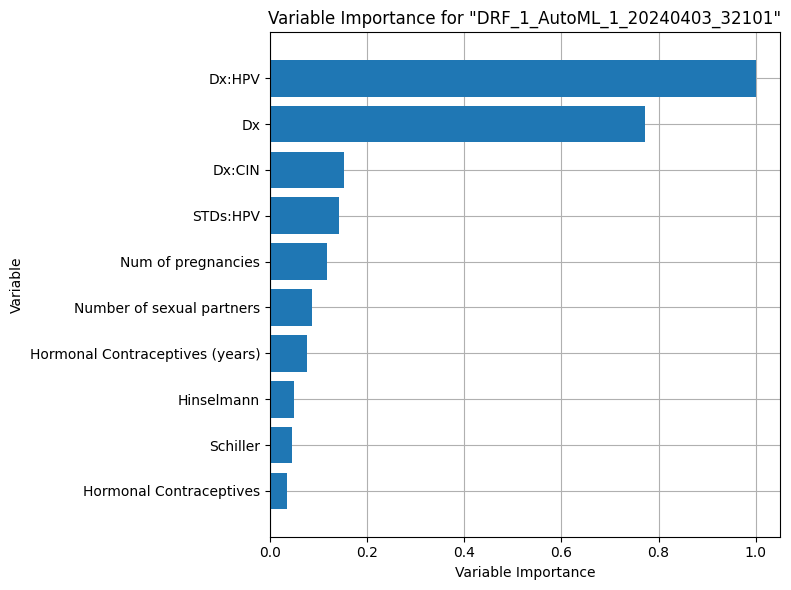

In [60]:
explain_model = aml.explain(frame = test, figsize = (8,6),include_explanations=['varimp'])

The variable importance graph provides summary and insight into the contribution of each feature in predicting the target variable. In this summary, the relative importance of each variable is presented, indicating their influence on the model's predictions. Variables such as "Dx:HPV","Dx," "Dx:CIN," " and "STDs:HPV" have relatively higher importance values, suggesting they play significant roles in predicting the target outcome. Conversely, variables like  "Hinselmann," and "Schiller" have negligible importance, implying that they contribute little to the model's predictive power. Understanding variable importance helps prioritize features for further analysis and feature selection, aiding in model interpretability and performance optimization.

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

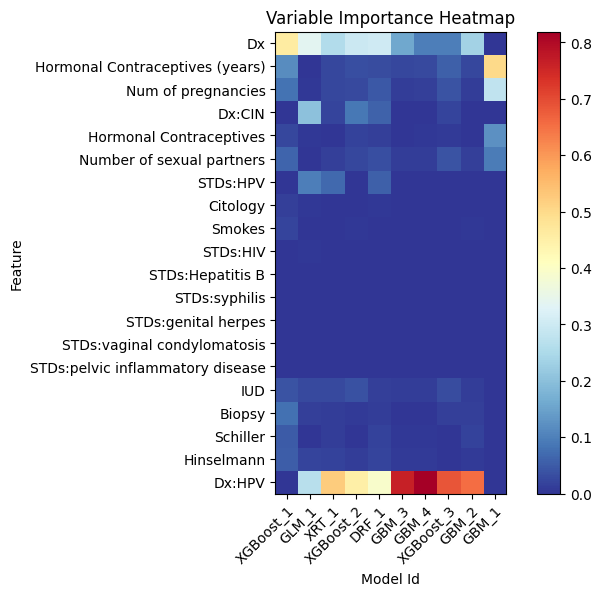

In [61]:
explain_variable_importance = aml.explain(frame=test, figsize=(8, 6), include_explanations=['varimp_heatmap'])

The variable importance heatmap diagram provides a summary of visual representation of the relative importance of each feature in predicting the target variable. It offers a comprehensive overview of feature importance, with variables arranged along the x and y axes and their importance indicated by color intensity. Darker shades typically represent higher importance, while lighter shades indicate lower importance. This heatmap allows for quick identification of key features that significantly influence the model's predictions, facilitating informed decisions regarding feature selection, model interpretation, and performance improvement strategies.

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

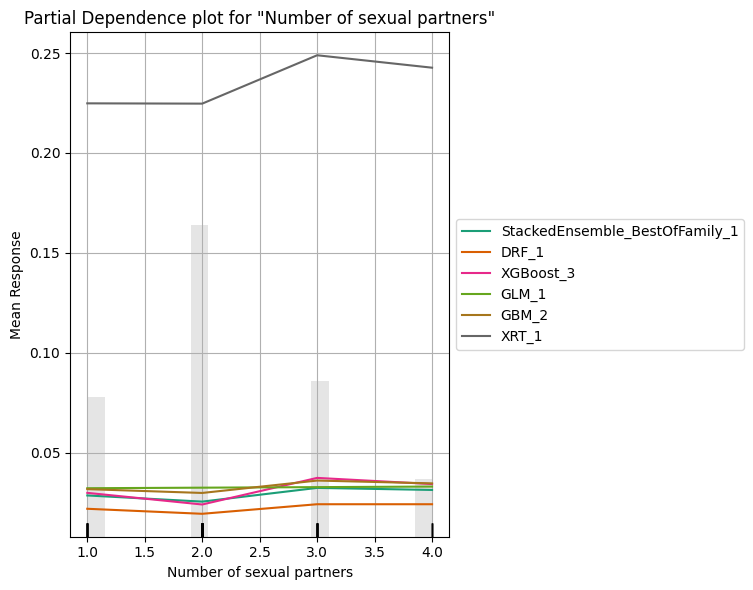

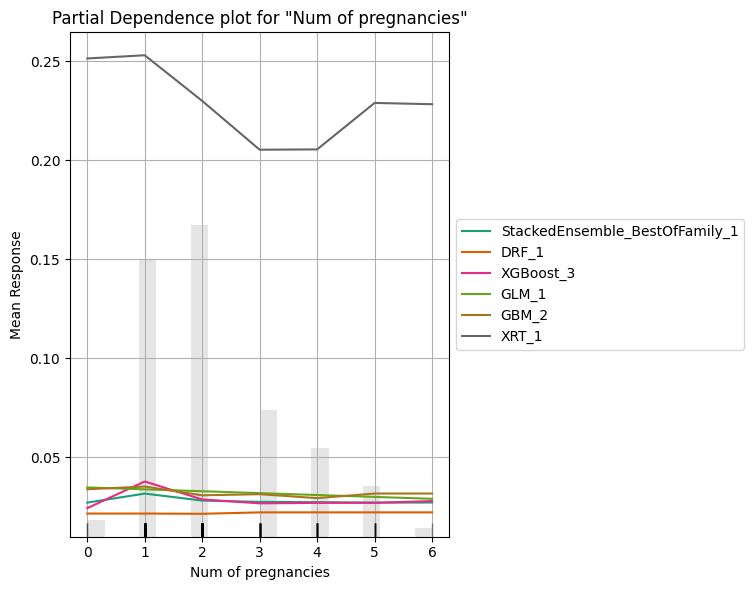

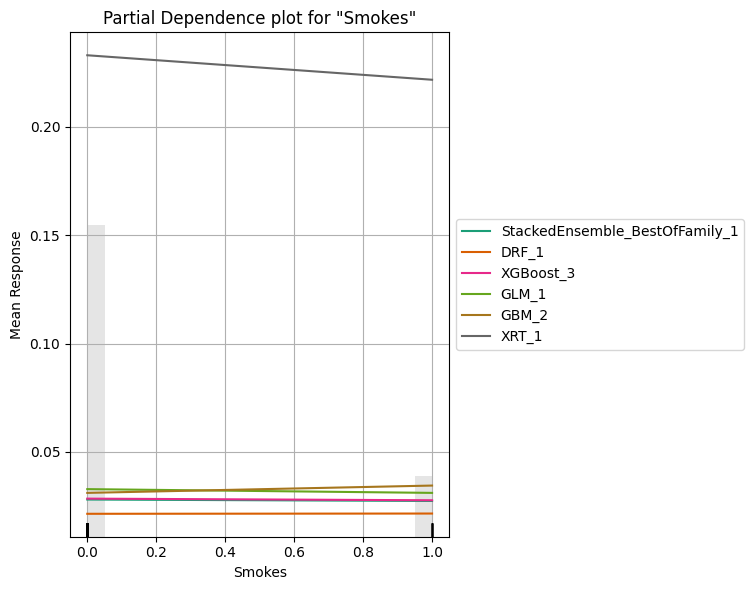

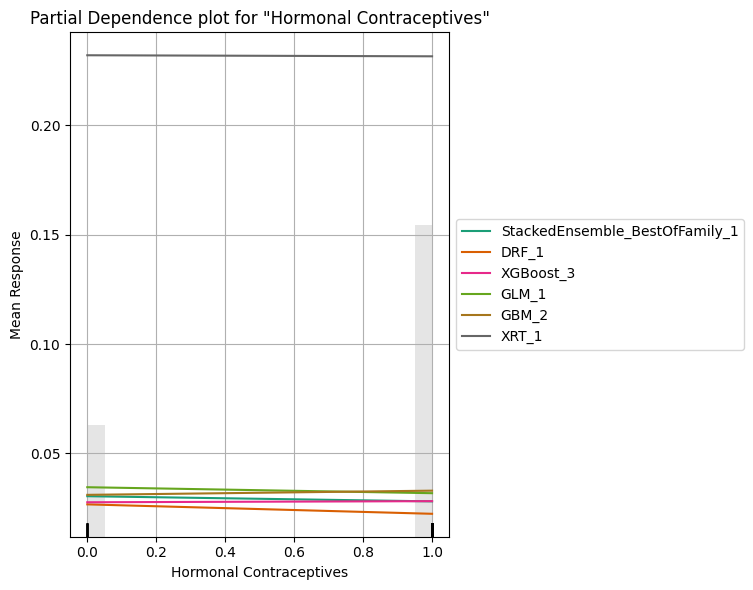

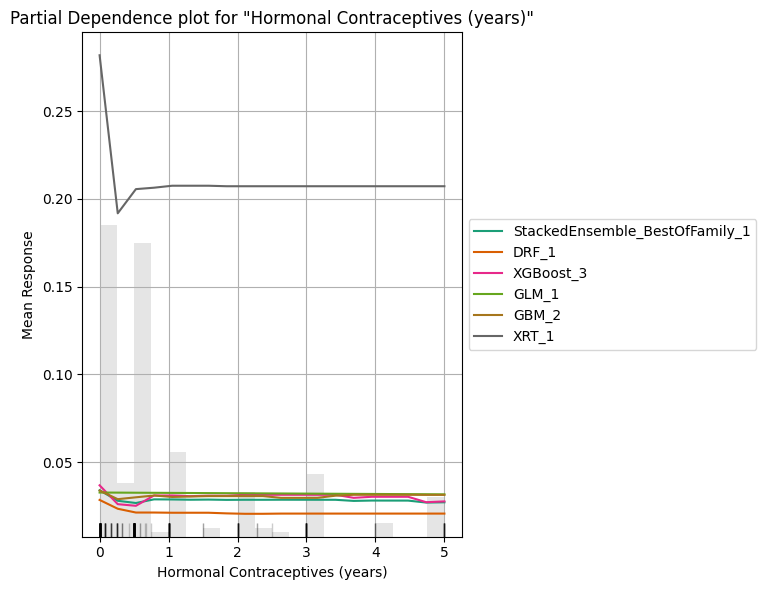

...

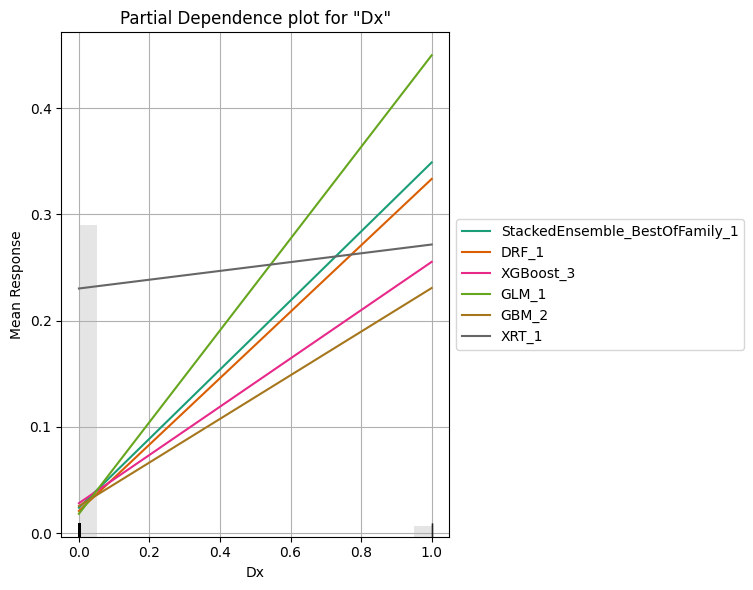

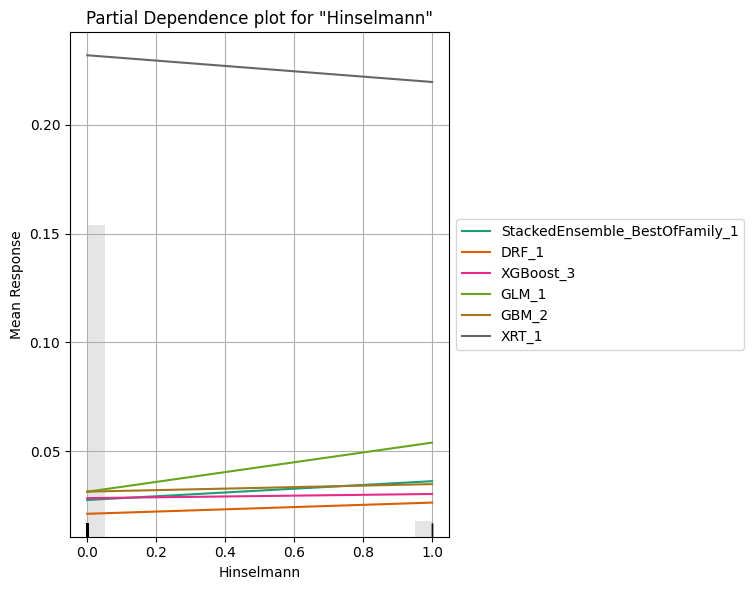

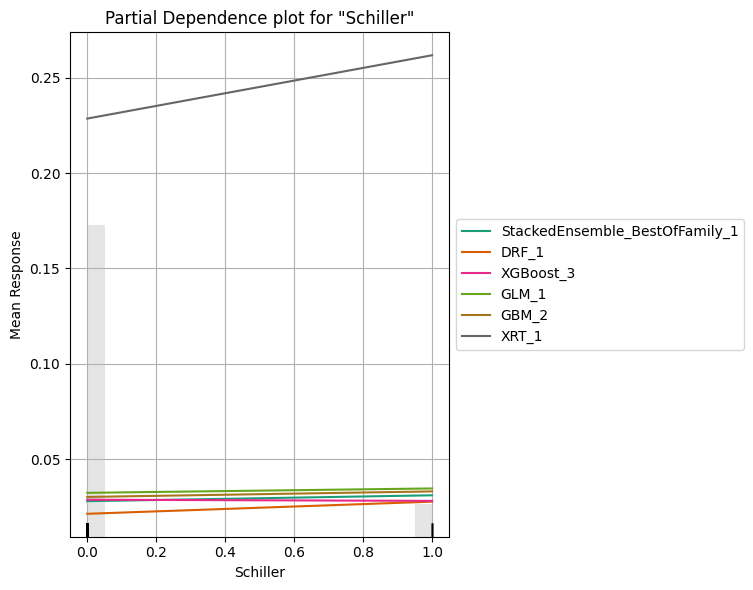

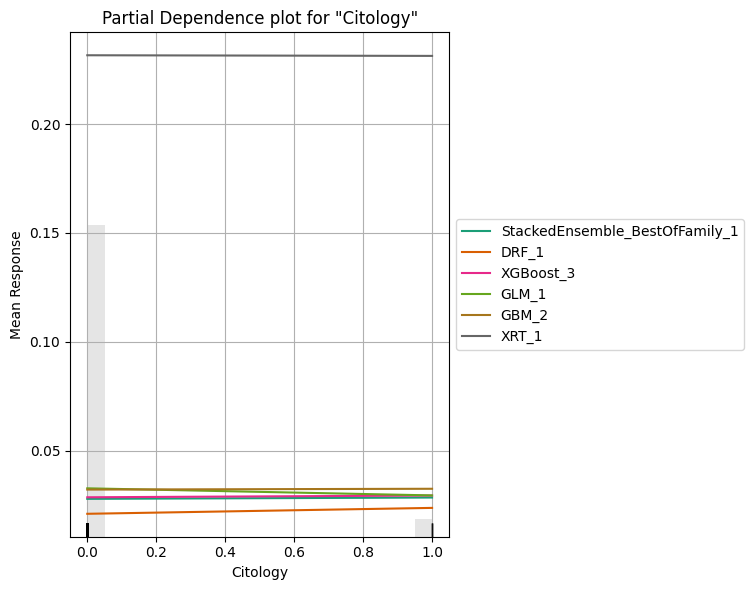

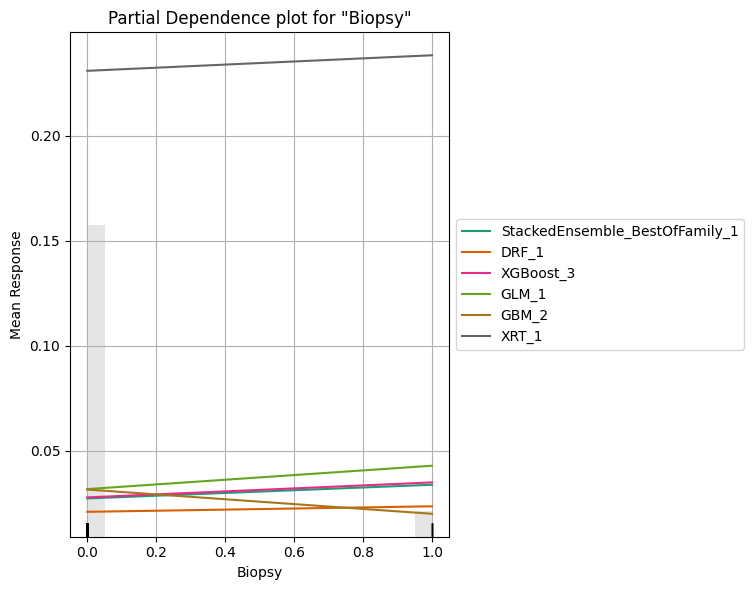

In [62]:
explain_model = aml.explain(frame = test, figsize = (8,6),include_explanations=['pdp'])

Partial dependence plots (PDPs) are visual representations used in machine learning to illustrate how a specific feature affects the predicted outcome while keeping all other features constant. They offer insights into how the predicted outcome changes with variations in a single feature, helping to understand the relationship between input features and the target variable. PDPs aid in comprehending complex model behavior and assist in feature engineering, model refinement, and decision-making processes by revealing whether the relationship between a feature and the predicted outcome is linear, monotonic, or nonlinear. In the above diagram, we can see that different models are represented with different color and for each feature how it is predicting the outcome

# SHAP Explanation

> SHAP explanation shows contribution of features for a given instance. The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function. H2O implements TreeSHAP which when the features are correlated, can increase contribution of a feature that had no influence on the prediction.

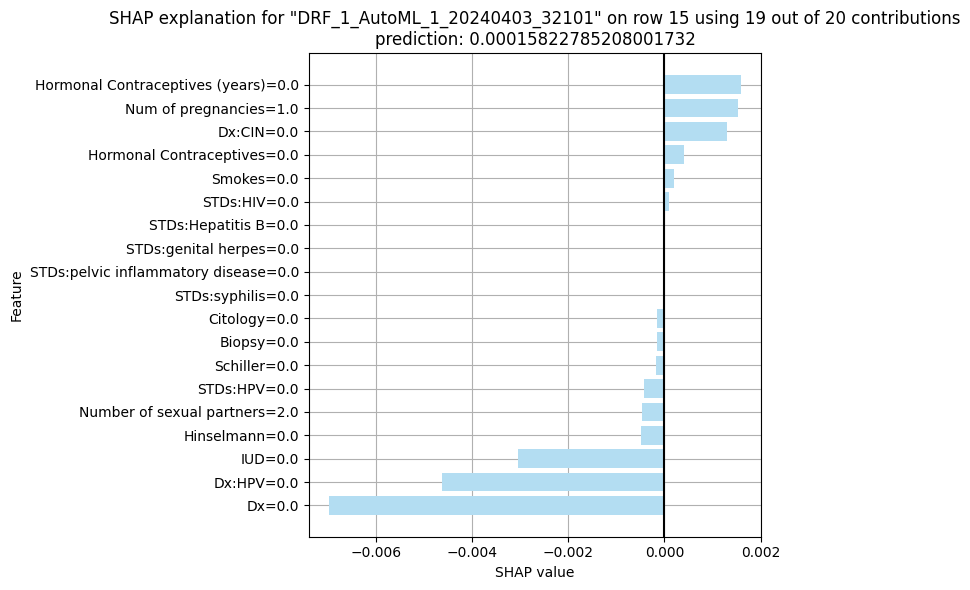

# SHAP Explanation

> SHAP explanation shows contribution of features for a given instance. The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function. H2O implements TreeSHAP which when the features are correlated, can increase contribution of a feature that had no influence on the prediction.

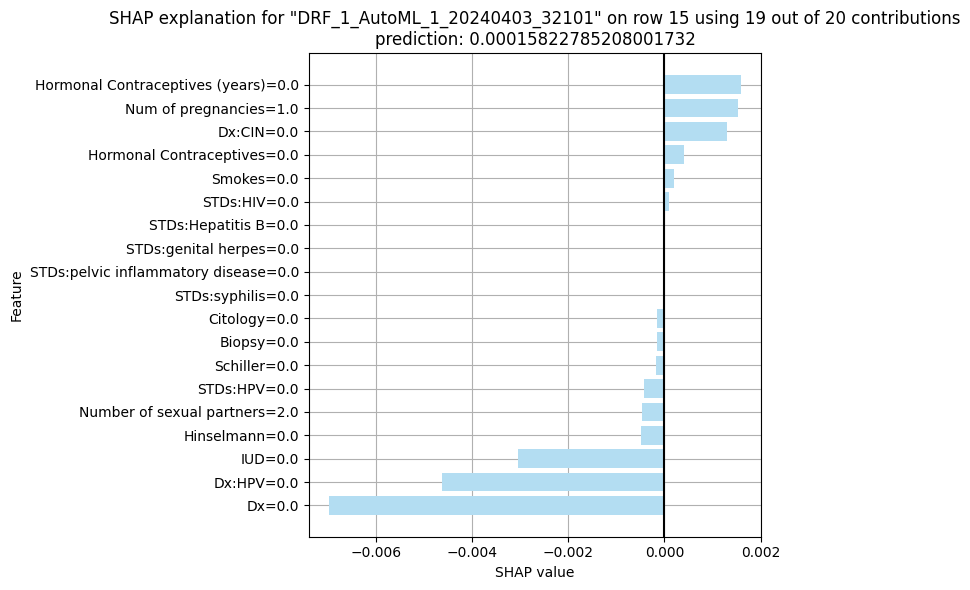

In [63]:
aml.explain_row(frame = test, row_index = 15, figsize = (8,6), exclude_explanations = "leaderboard")

SHAP (Shapley Additive explanations) is a technique used in machine learning to elucidate individual predictions. It assigns a significance value to each feature for a given prediction, indicating its contribution to the outcome. Unlike conventional feature importance methods, SHAP values offer a more detailed understanding of model predictions by considering feature interactions and capturing both primary effects and interplays among features. Visualizing SHAP values allows for interpreting the impact of each feature on specific predictions, aiding in understanding model behavior and identifying influential features.

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

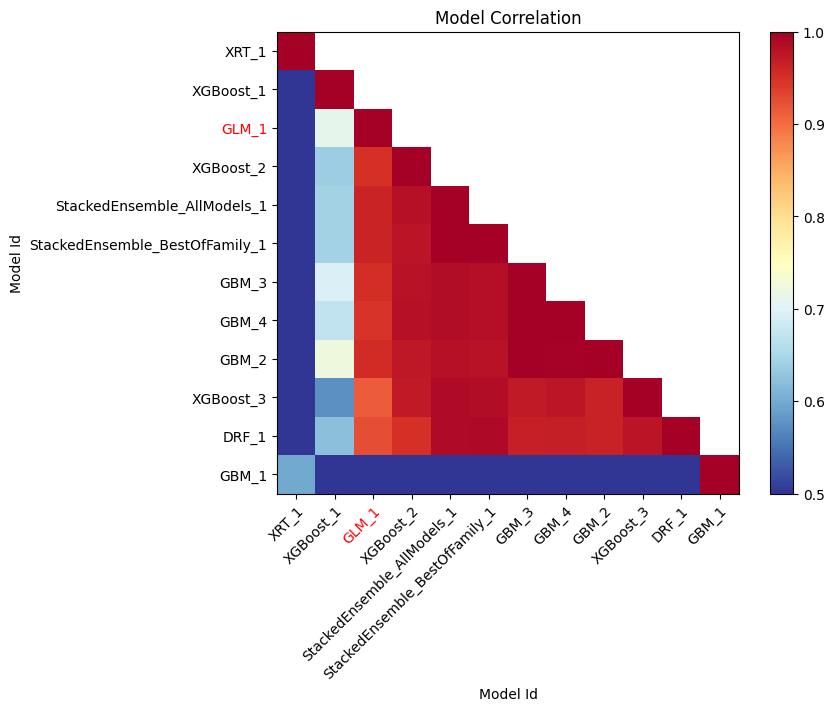

In [64]:
explain_model_correlation = aml.explain(frame=test, figsize=(8, 6), include_explanations=['model_correlation_heatmap'])


Model correlation indicates how closely related or divergent the predictions of various models are in a machine learning scenario. It gauges the extent of similarity or disparity in predictions across the dataset. A strong model correlation indicates that the models generate comparable predictions, implying a consensus among them, whereas a weak correlation suggests discrepancies in their predictions. Grasping model correlation is essential for ensemble techniques and model choice, as it aids in evaluating the variability and effectiveness of different models within the ensemble. From the above diagram we can see that DRF_1 is closely related with StackedEnsemble_BestOfFamily_1 and StackedEnsemble_AllModels_1.






# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

/usr/local/lib/python3.10/dist-packages/h2o/explanation/_explain.py:611: RuntimeWarning: divide by zero encountered in divide
  res = (res - np.nanmin(res)) / (np.nanmax(res) - np.nanmin(res))
/usr/local/lib/python3.10/dist-packages/h2o/explanation/_explain.py:611: RuntimeWarning: invalid value encountered in divide
  res = (res - np.nanmin(res)) / (np.nanmax(res) - np.nanmin(res))


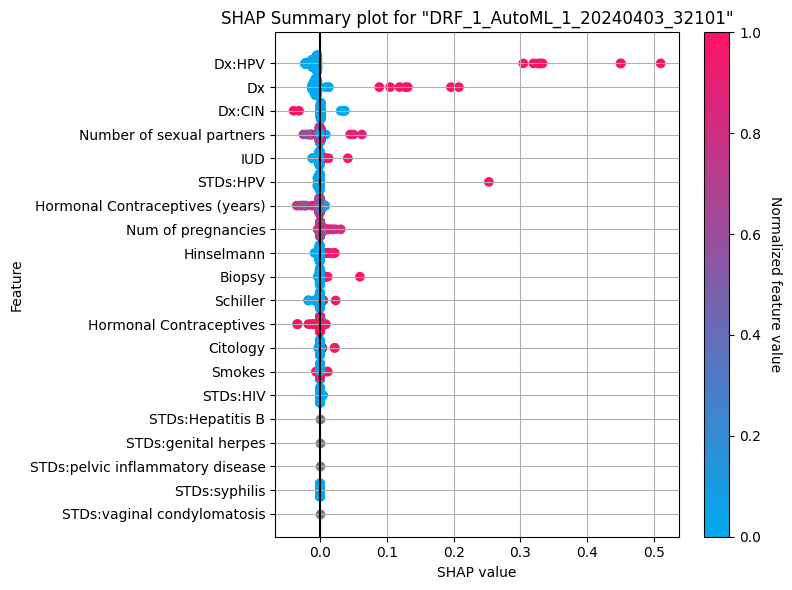

In [65]:
explain_shap_summary = aml.explain(frame=test, figsize=(8, 6), include_explanations=['shap_summary'])

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

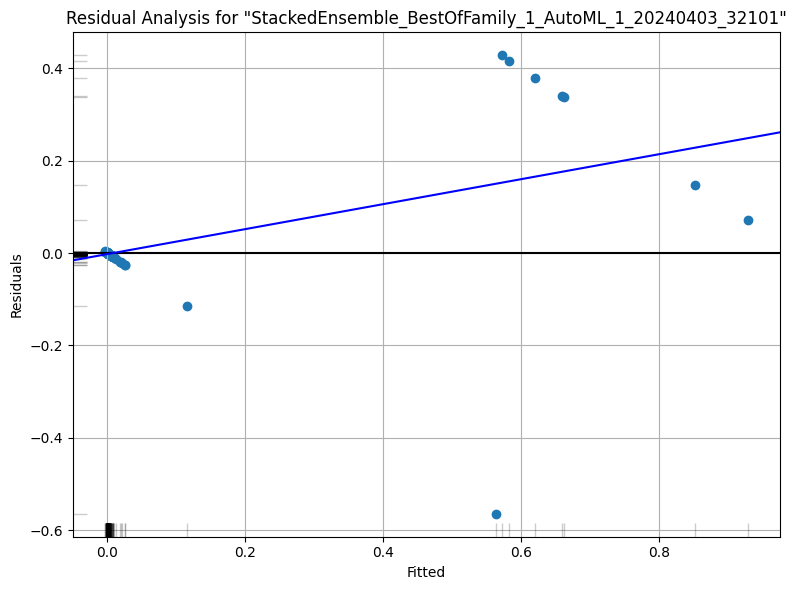

In [66]:
explain_model_correlation = aml.explain(frame=test, figsize=(8, 6), include_explanations=['residual_analysis'])

A learning curve plot is a graphical representation used to assess the performance of a machine learning model as a function of training data size. It illustrates how the model's performance metric, such as accuracy or error, changes with varying amounts of training data. Typically, the x-axis of the plot represents the number of training examples, while the y-axis represents the performance metric. The learning curve helps in understanding how the model's performance evolves with additional training data, indicating whether the model would benefit from more data or if it has reached its learning capacity.

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

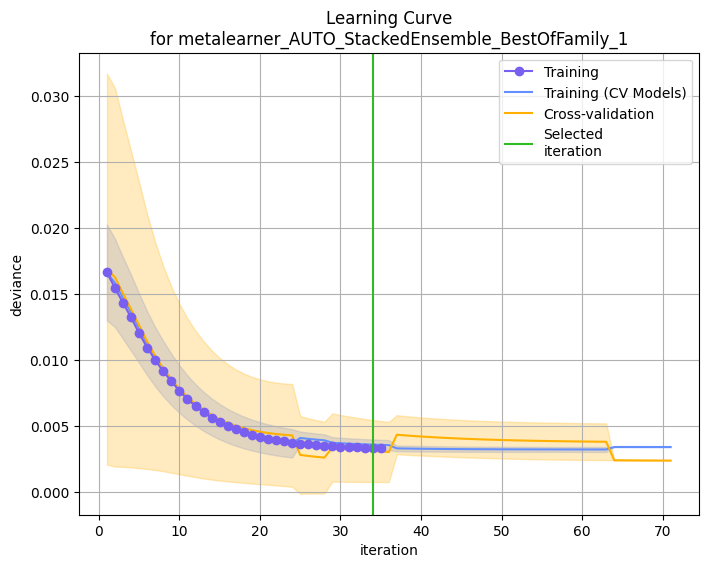

In [67]:
explain_model_correlation = aml.explain(frame=test, figsize=(8, 6), include_explanations=['learning_curve'])

### Hyperparameters


In [68]:
best_model = aml.leader
best_model_params = best_model.params
display(best_model_params)

{'model_id': {'default': None,
  'actual': {'__meta': {'schema_version': 3,
    'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>'},
   'name': 'StackedEnsemble_BestOfFamily_1_AutoML_1_20240403_32101',
   'type': 'Key<Model>',
   'URL': '/3/Models/StackedEnsemble_BestOfFamily_1_AutoML_1_20240403_32101'},
  'input': None},
 'training_frame': {'default': None,
  'actual': {'__meta': {'schema_version': 3,
    'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>'},
   'name': 'AutoML_1_20240403_32101_training_py_6_sid_aeb6',
   'type': 'Key<Frame>',
   'URL': '/3/Frames/AutoML_1_20240403_32101_training_py_6_sid_aeb6'},
  'input': {'__meta': {'schema_version': 3,
    'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>'},
   'name': 'AutoML_1_20240403_32101_training_py_6_sid_aeb6',
   'type': 'Key<Frame>',
   'URL': '/3/Frames/AutoML_1_20240403_32101_training_py_6_sid_aeb6'}},
 'response_column': {'default': None,
  'actual': {'__meta': {'schema_version': 3,
    'sch

Hyperparameters are configuration settings that are external to a model and cannot be learned from the data during training. These parameters govern the behavior of the algorithm and influence how the model is trained. Unlike the model's internal parameters (e.g., weights in a neural network), hyperparameters must be specified before the learning process begins and typically remain constant throughout training. Examples of hyperparameters include the learning rate in gradient descent optimization, the depth of a decision tree, the number of hidden layers in a neural network, and the regularization strength in linear models. Selecting appropriate hyperparameter values is crucial for achieving optimal model performance and generalization to unseen data. Hyperparameters that significantly influence the model's performance and behavior are

metalearner_algorithm: Specifies the algorithm used for the metalearner. In this case, it is set to 'glm', which likely refers to a generalized linear model.

metalearner_nfolds: Specifies the number of folds for cross-validation during metalearner training. It is set to 5 in this case.

max_runtime_secs: Specifies the maximum runtime in seconds for the model training. It is set to 0.0, indicating no runtime limit.

score_training_samples: Specifies the number of training samples used for scoring. It is set to 10,000 in this case.

keep_levelone_frame: Specifies whether to keep the level one frame. It is set to True.

In [69]:
from sklearn.model_selection import GridSearchCV
from xgboost import XGBClassifier

# Define the parameter grid to search
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.1, 0.01, 0.001],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Initialize the XGBoost classifier
xgb = XGBClassifier(seed=1242)

# Perform GridSearchCV
grid_search = GridSearchCV(estimator=xgb, param_grid=param_grid, cv=5, scoring='f1', n_jobs=-1)
grid_search.fit(X_train, y_train)  # X_train and y_train are your training data

# Print the best parameters and best score
print("Best Parameters:", grid_search.best_params_)
print("Best F1-score:", grid_search.best_score_)

Best Parameters: {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200, 'subsample': 1.0}
Best F1-score: 0.8647619047619047


**Hyperparameter Tuning**

In [70]:

import numpy as np

from sklearn.model_selection import train_test_split

from sklearn.ensemble import RandomForestClassifier

from sklearn.model_selection import RandomizedSearchCV

s=df2['Dx:Cancer']
t=df2.drop(['Dx:Cancer'], axis=1)
t_train, t_test, s_train, s_test = train_test_split (t, s, random_state = 101, test_size = 0.2)


In [71]:
from sklearn.model_selection import RandomizedSearchCV

from sklearn.ensemble import RandomForestRegressor

mode = RandomForestRegressor()

param_vals = {
              'max_depth': [200, 500, 800, 1100],
              'n_estimators': [100,200, 300, 400],
              'min_samples_split' : [2,3,5]

}

random_rf = RandomizedSearchCV(estimator=mode, param_distributions=param_vals,n_iter=10, scoring='f1', cv=5, n_jobs=-1)

random_rf.fit(t_train, s_train)

preds = random_rf.best_estimator_.predict(t_test)
random_rf.best_params_


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan]
  warnings.warn(


{'n_estimators': 400, 'min_samples_split': 2, 'max_depth': 500}

The RandomizedSearchCV procedure was used to perform hyperparameter tuning for a RandomForestRegressor model. The search was conducted over a predefined parameter grid, and the best combination of hyperparameters was identified based on the 'f1' score, using 5-fold cross-validation.The hyperparameters that yielded the best performance were:'n_estimators': 400
'min_samples_split': 5
'max_depth': 800
These hyperparameters indicate that the random forest model consisted of 400 trees, with a minimum number of samples required to split an internal node set to 5, and a maximum depth of 800 for each tree.

### **SHAP Analysis**
Shap analysis provides intuitive visualizations such as Shapley value plots, which display the impact of each feature on individual predictions. These plots can help users interpret the model's behavior and gain insights into the relationships between features and predictions. Overall, Shap analysis is a valuable tool for model interpretation and debugging, helping users to trust, understand, and improve the performance of machine learning models.

**Shap Analysis on Linear Model**

In [72]:
shap.initjs()

PermutationExplainer explainer: 773it [00:50, 13.58it/s]


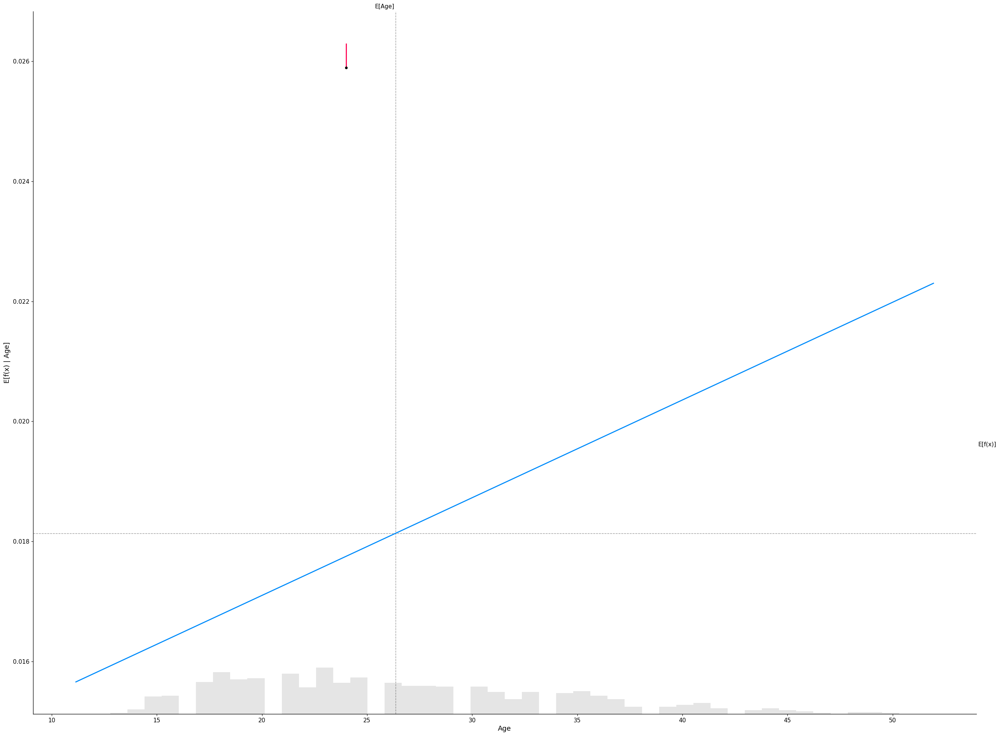

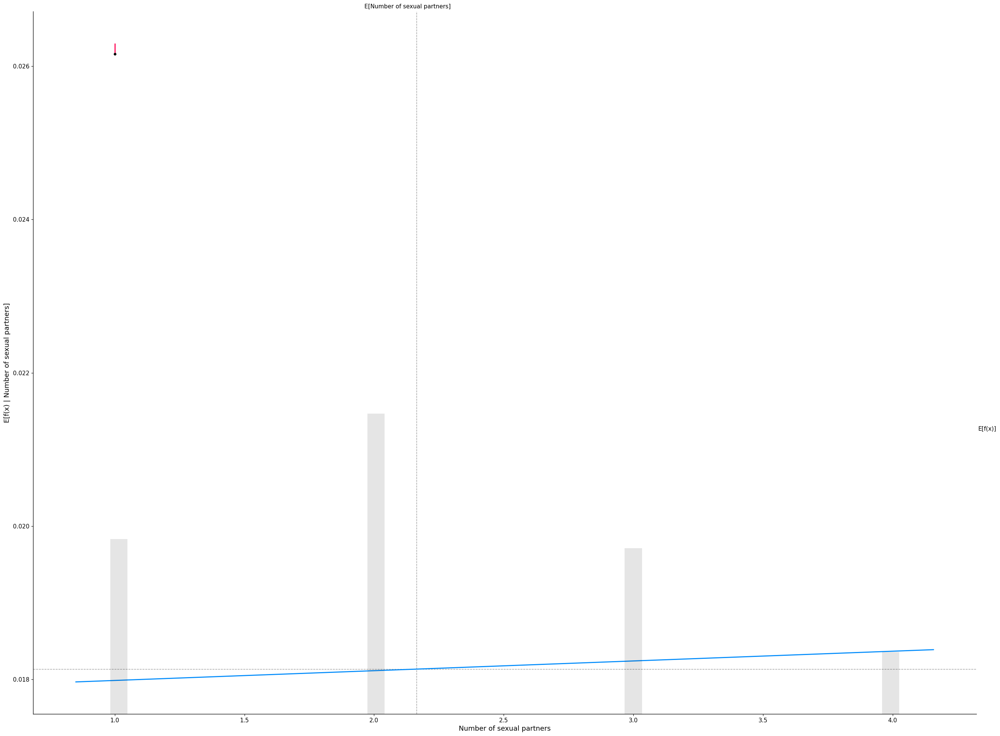

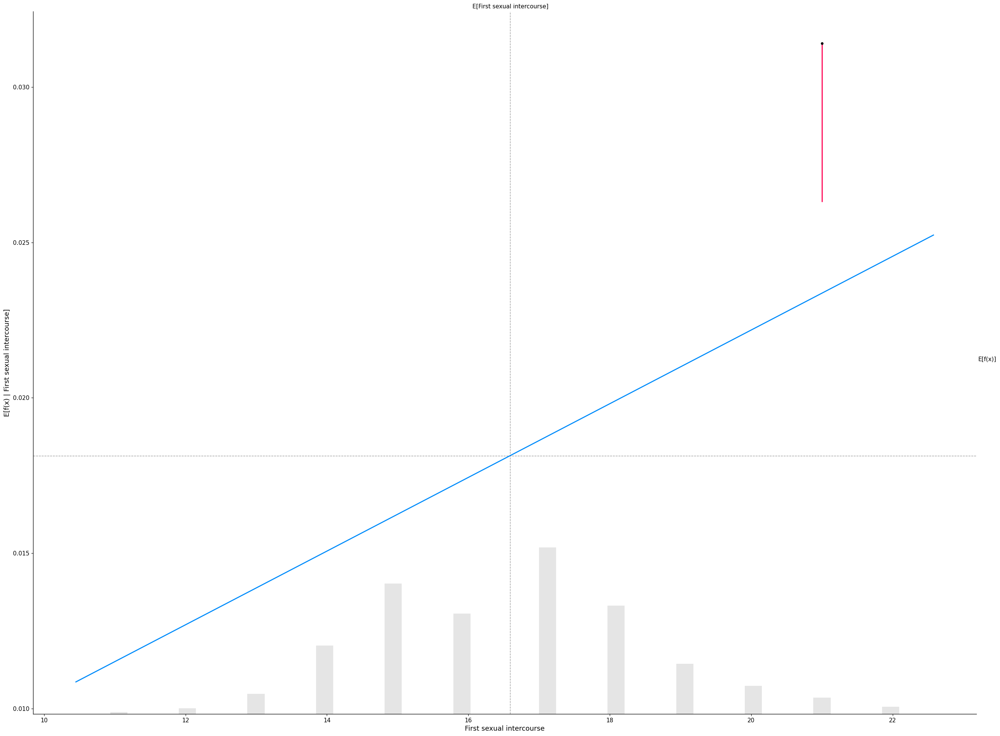

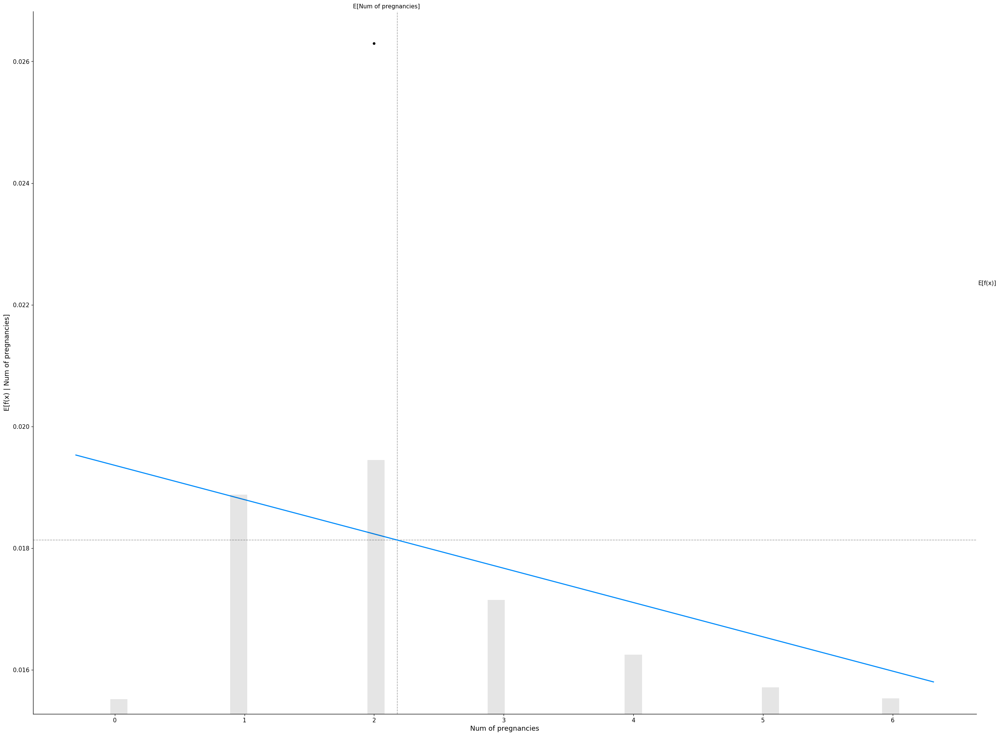

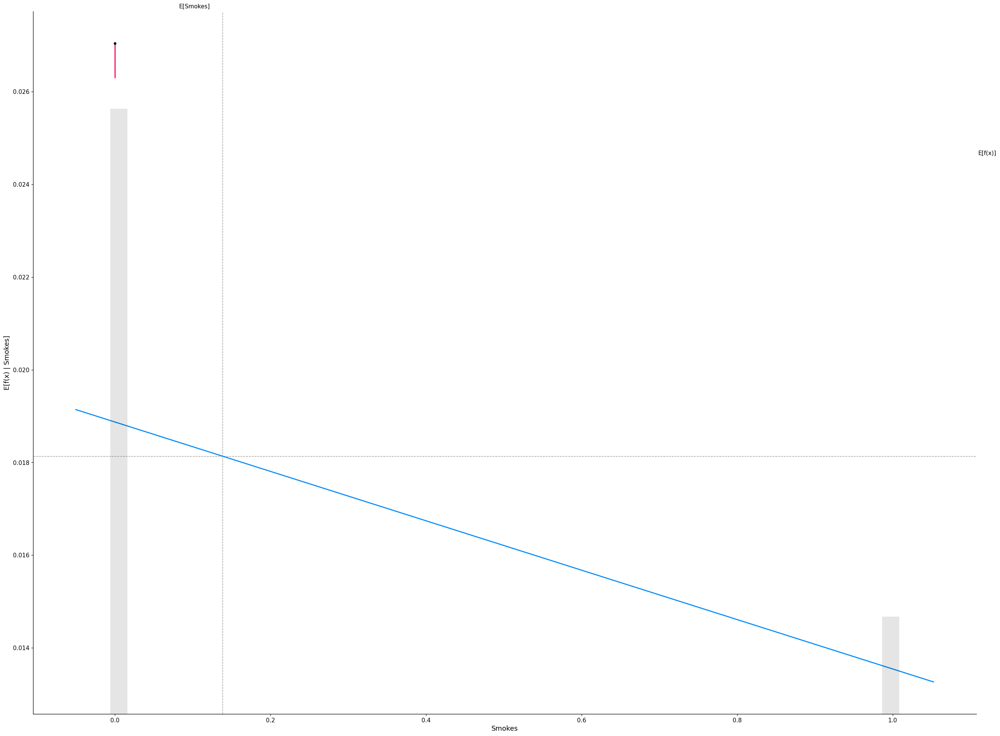

/usr/local/lib/python3.10/dist-packages/shap/plots/_partial_dependence.py:137: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax3.set_xlim(xmin,xmax)


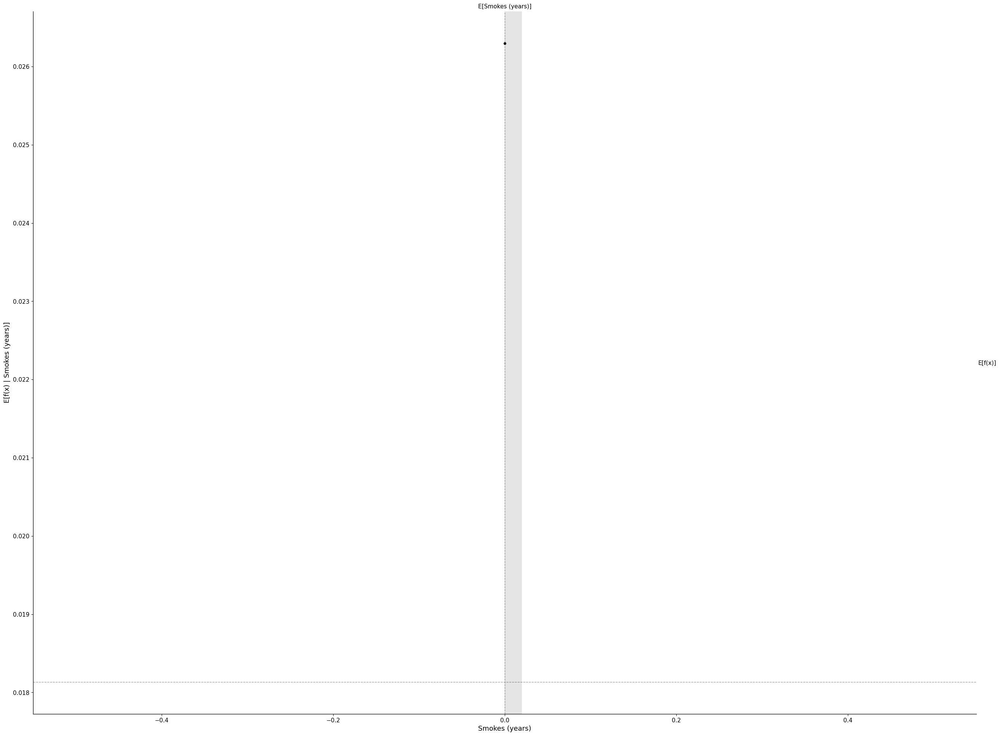

/usr/local/lib/python3.10/dist-packages/shap/plots/_partial_dependence.py:137: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax3.set_xlim(xmin,xmax)


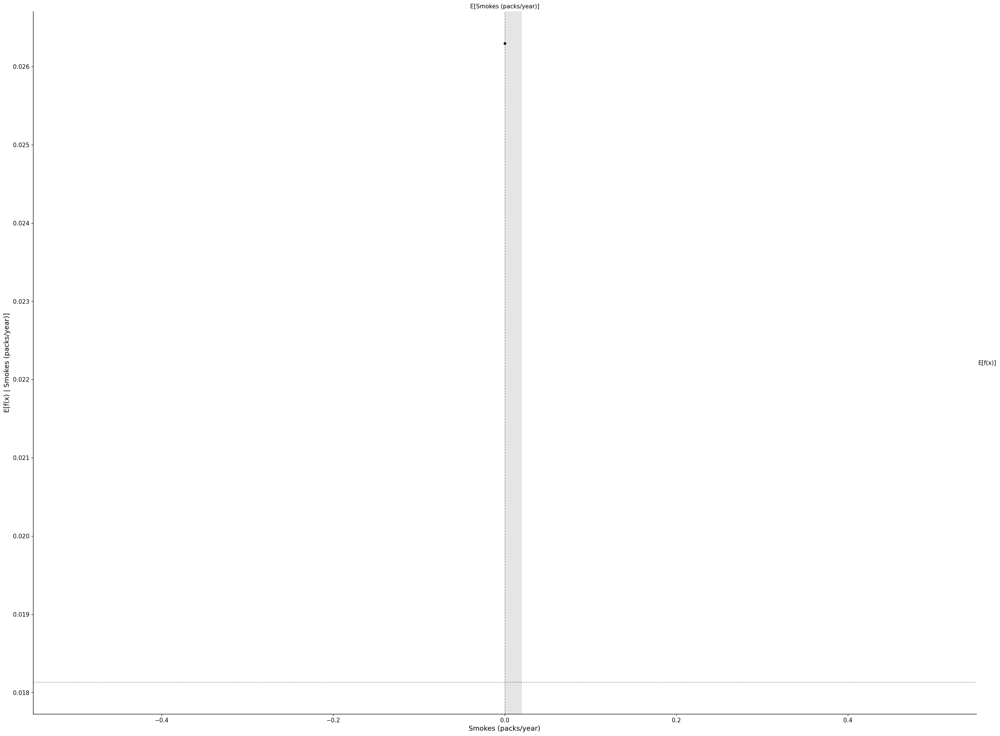

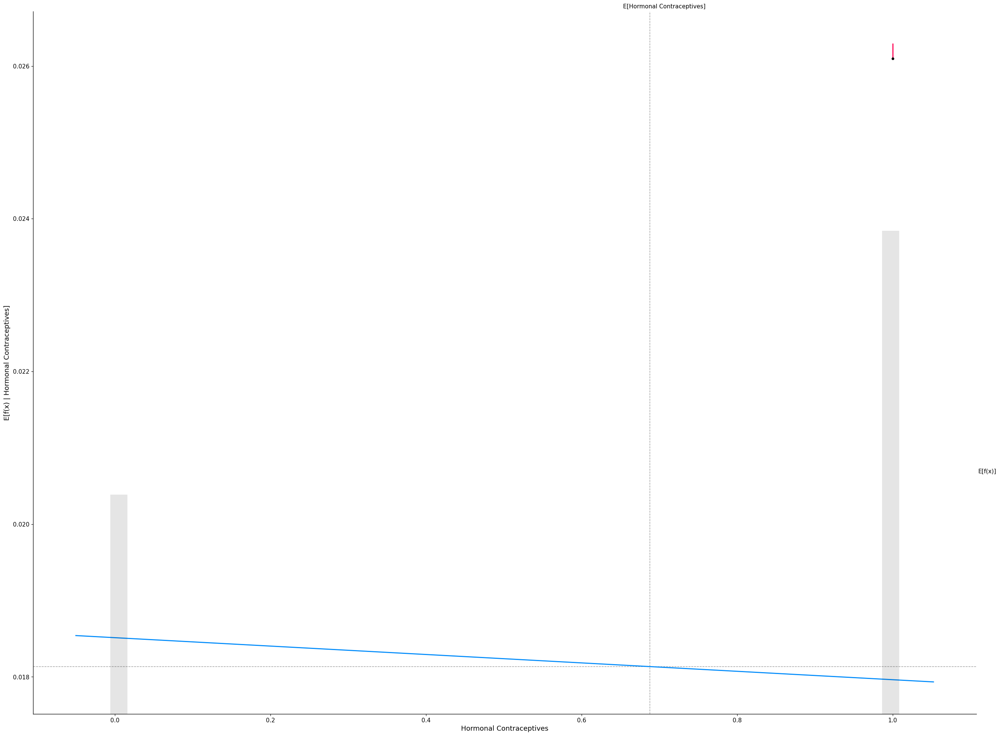

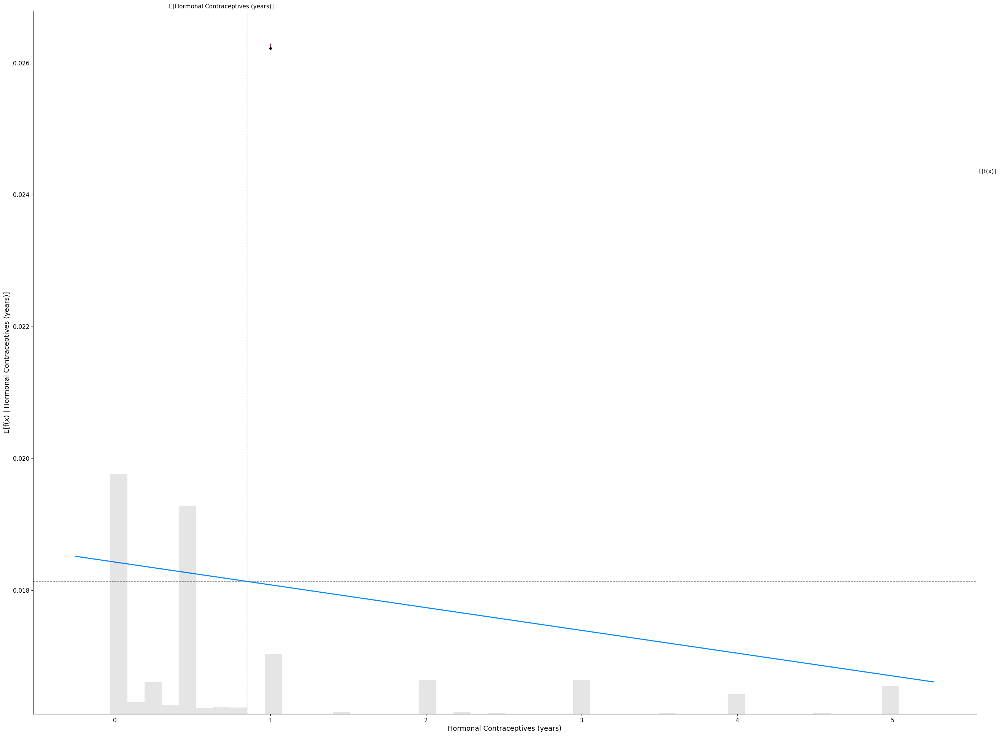

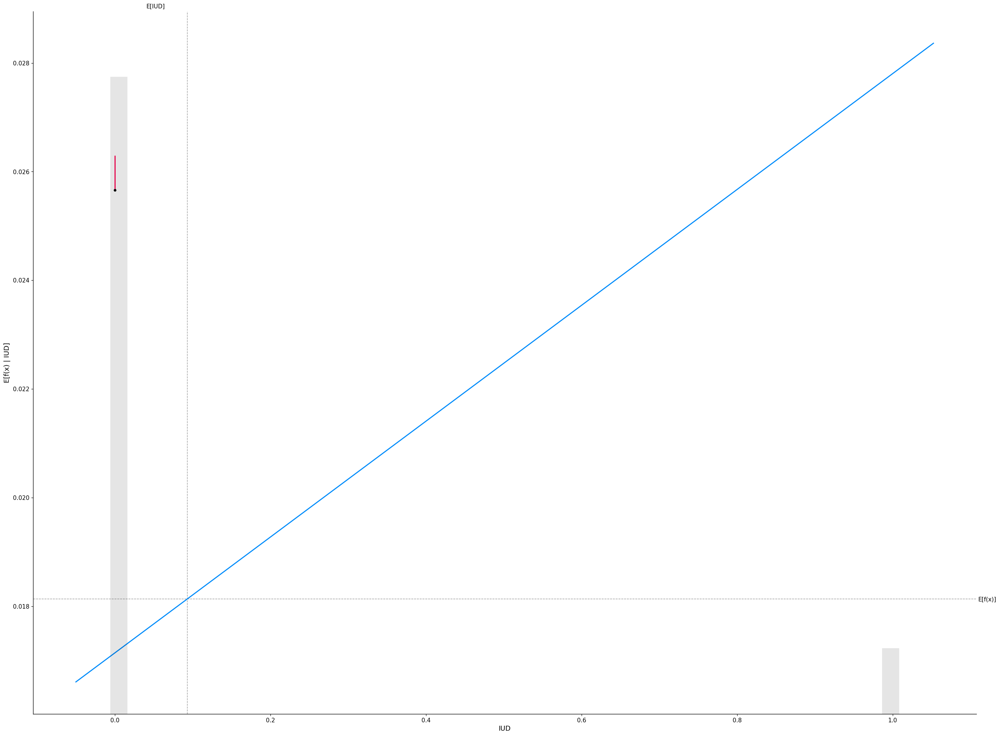

/usr/local/lib/python3.10/dist-packages/shap/plots/_partial_dependence.py:137: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax3.set_xlim(xmin,xmax)


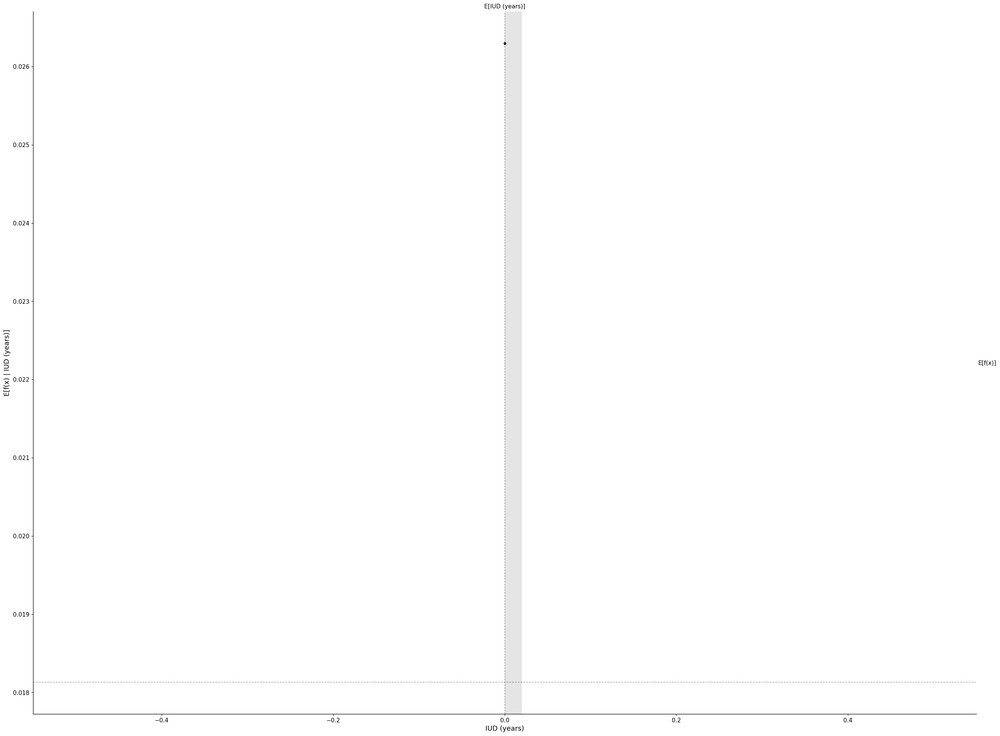

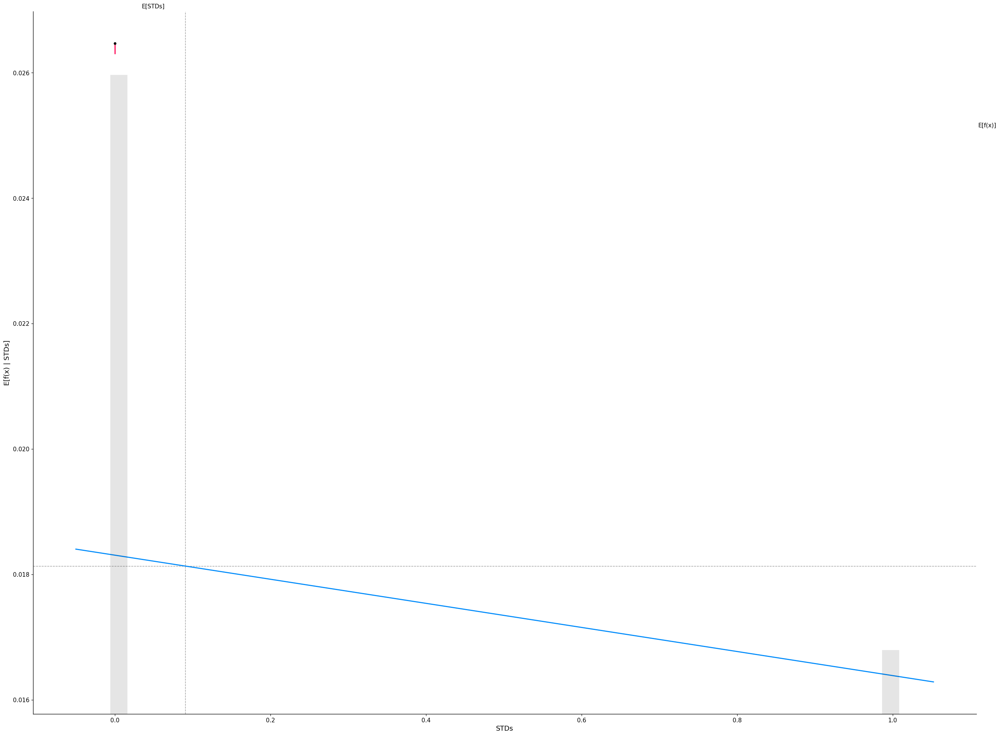

/usr/local/lib/python3.10/dist-packages/shap/plots/_partial_dependence.py:137: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax3.set_xlim(xmin,xmax)


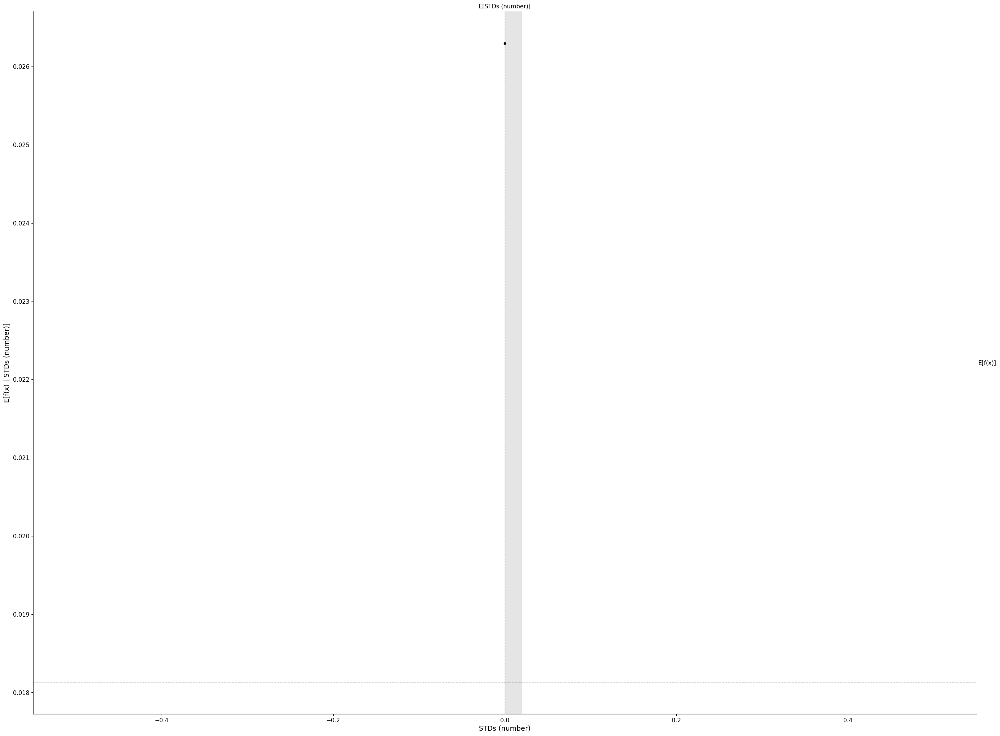

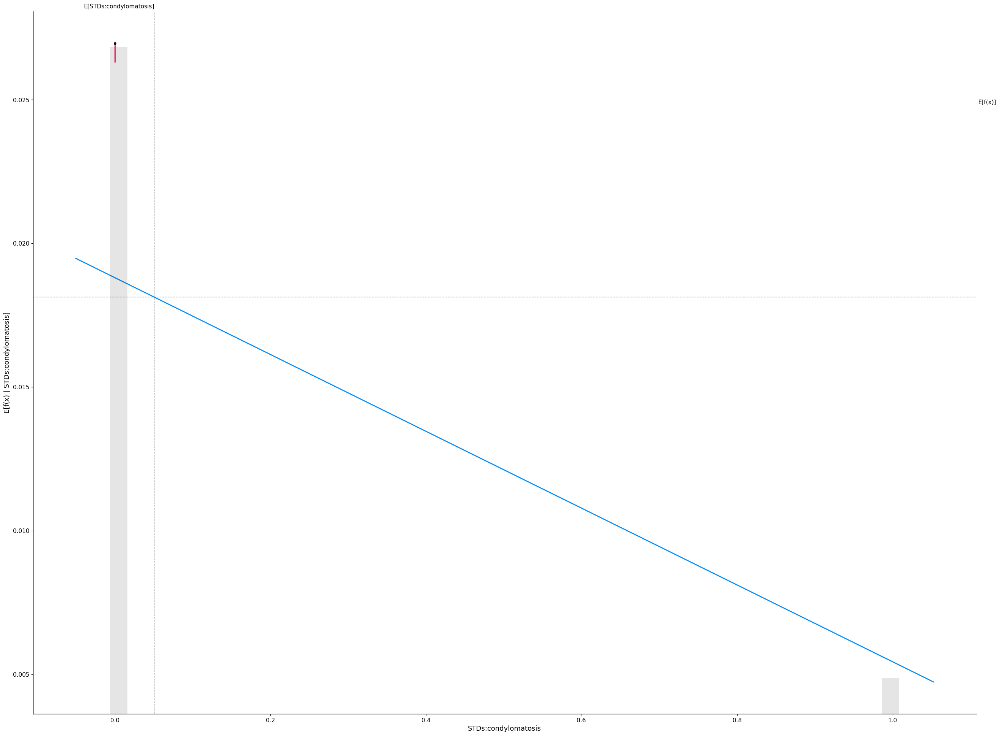

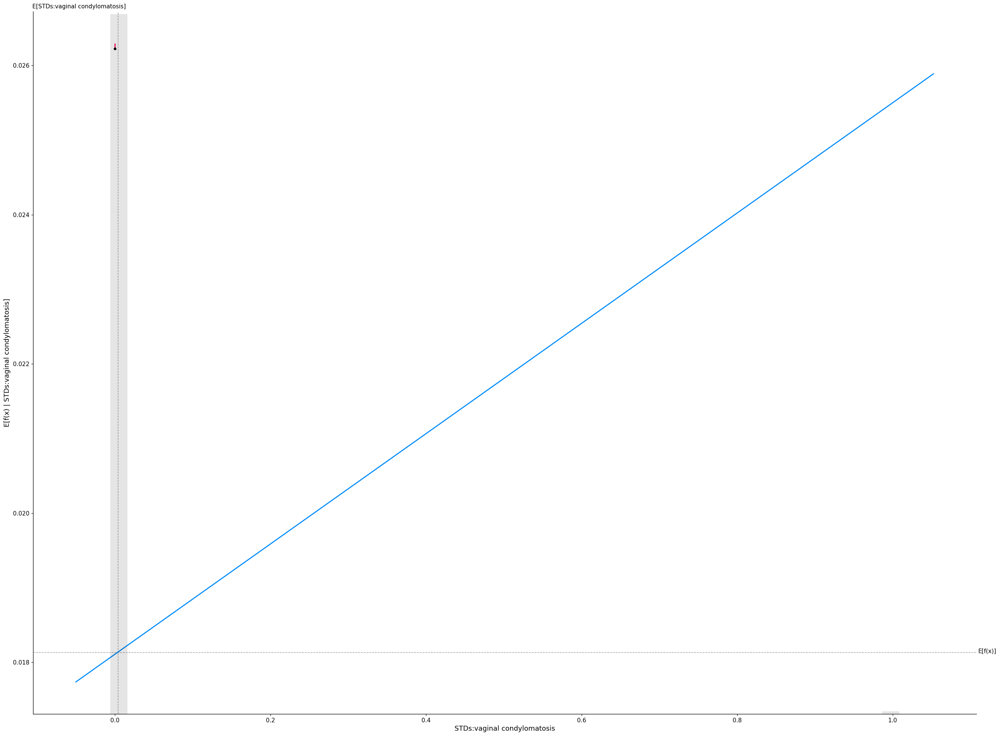

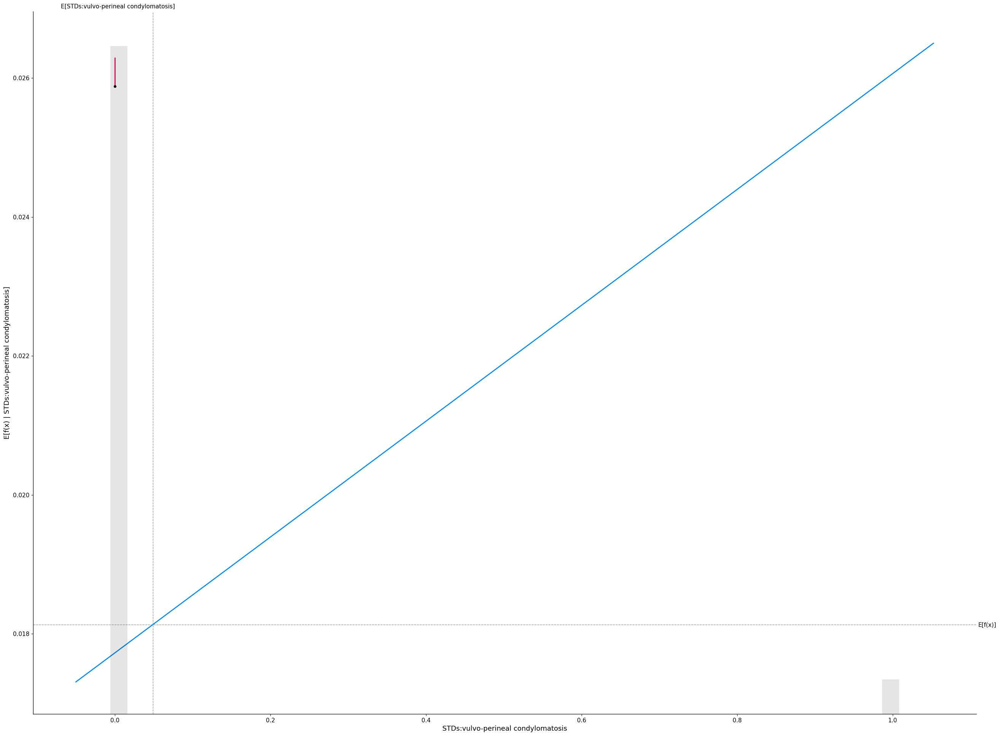

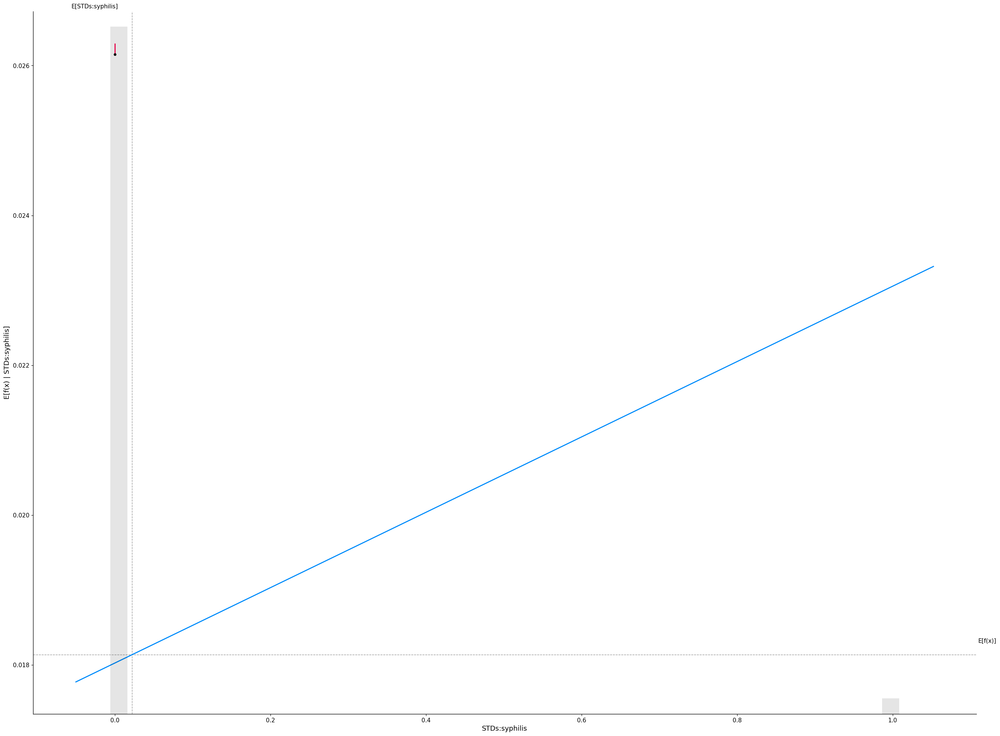

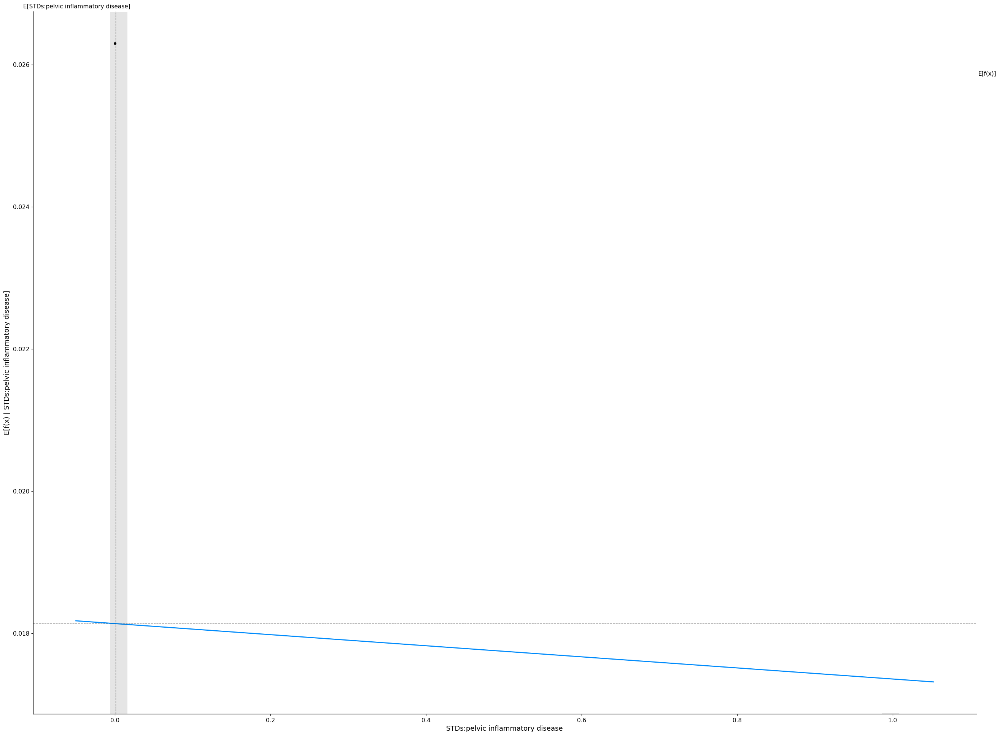

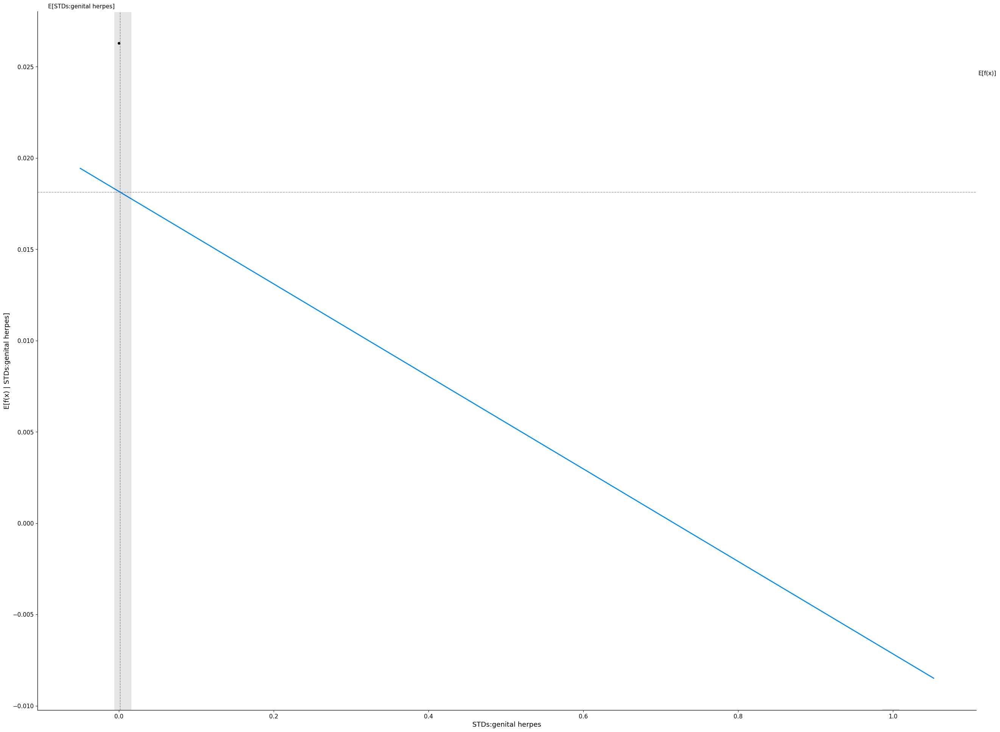

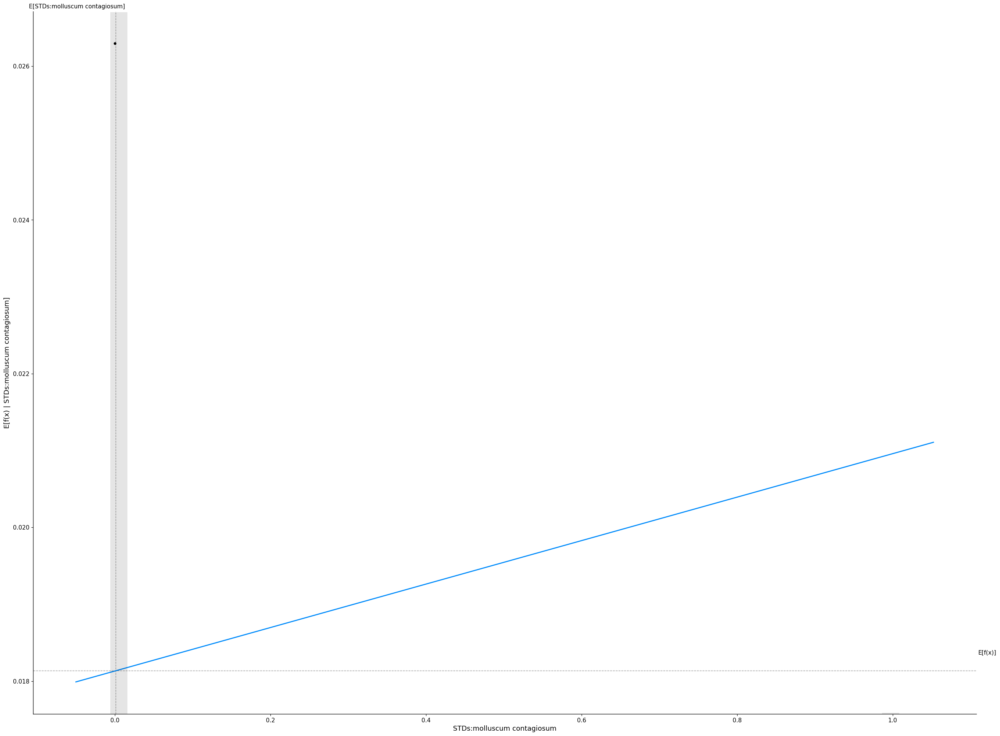

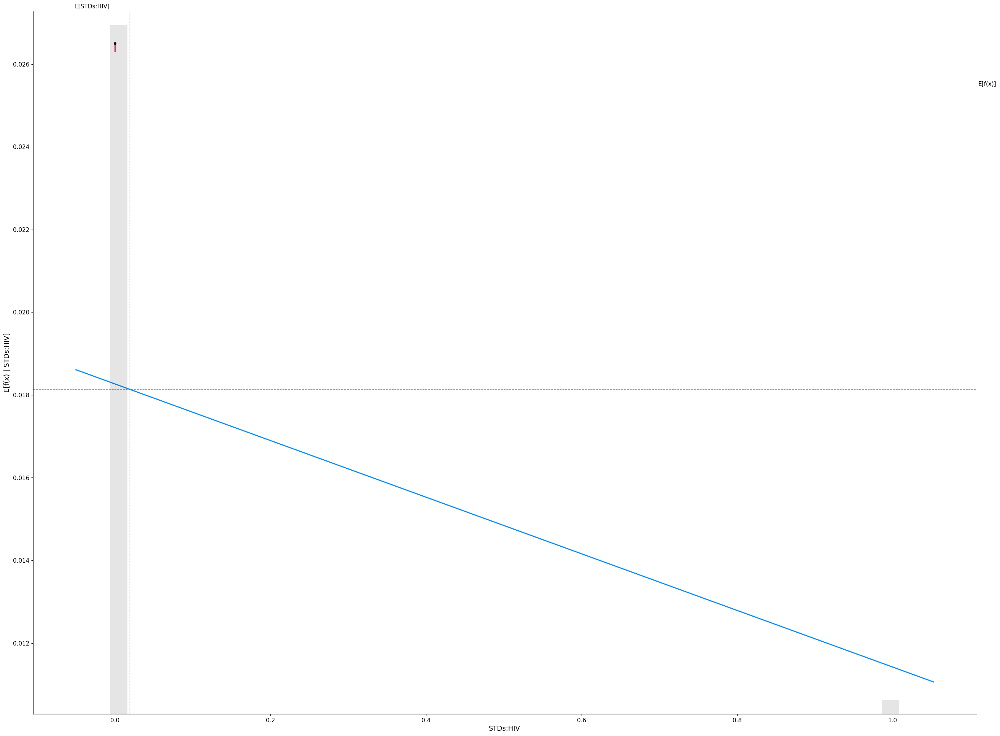

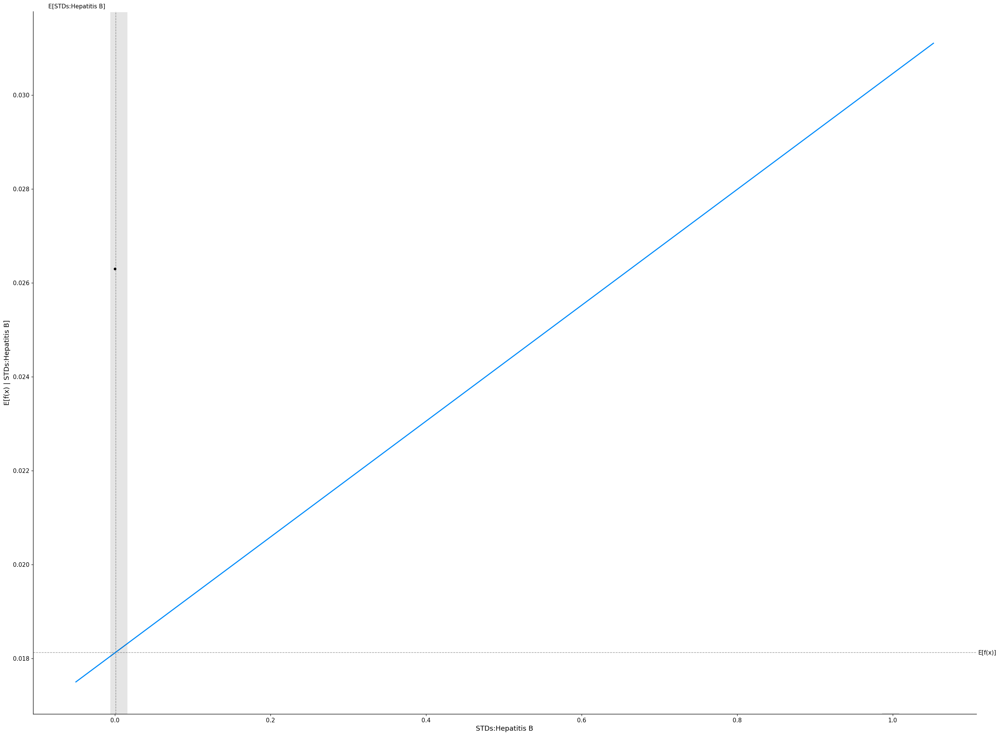

/usr/local/lib/python3.10/dist-packages/shap/plots/_partial_dependence.py:137: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax3.set_xlim(xmin,xmax)


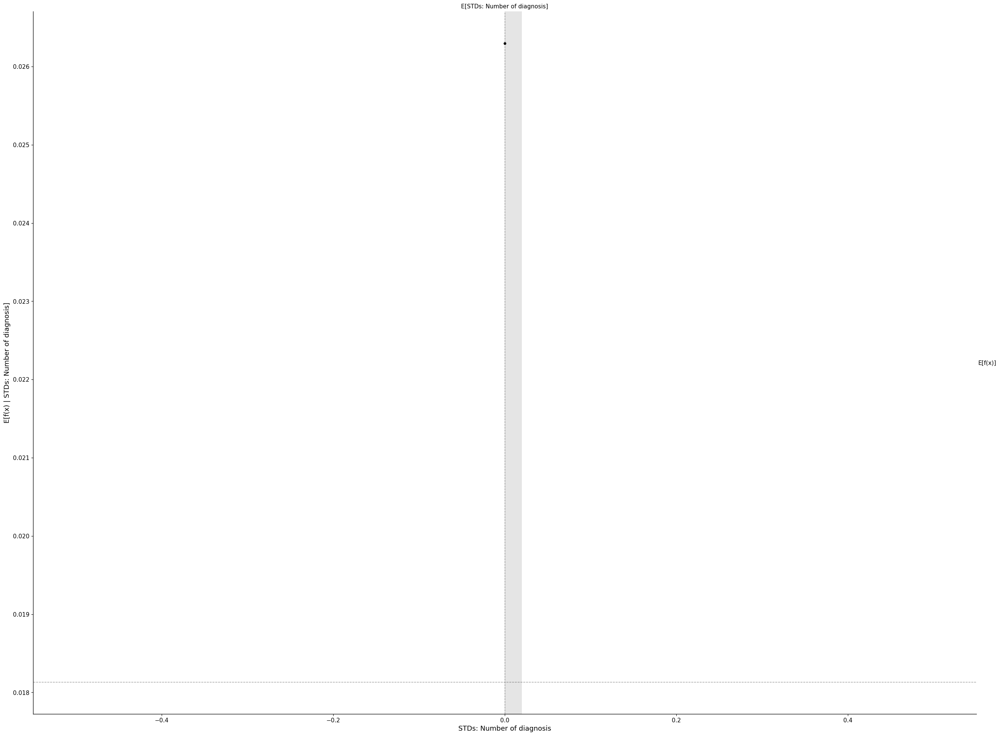

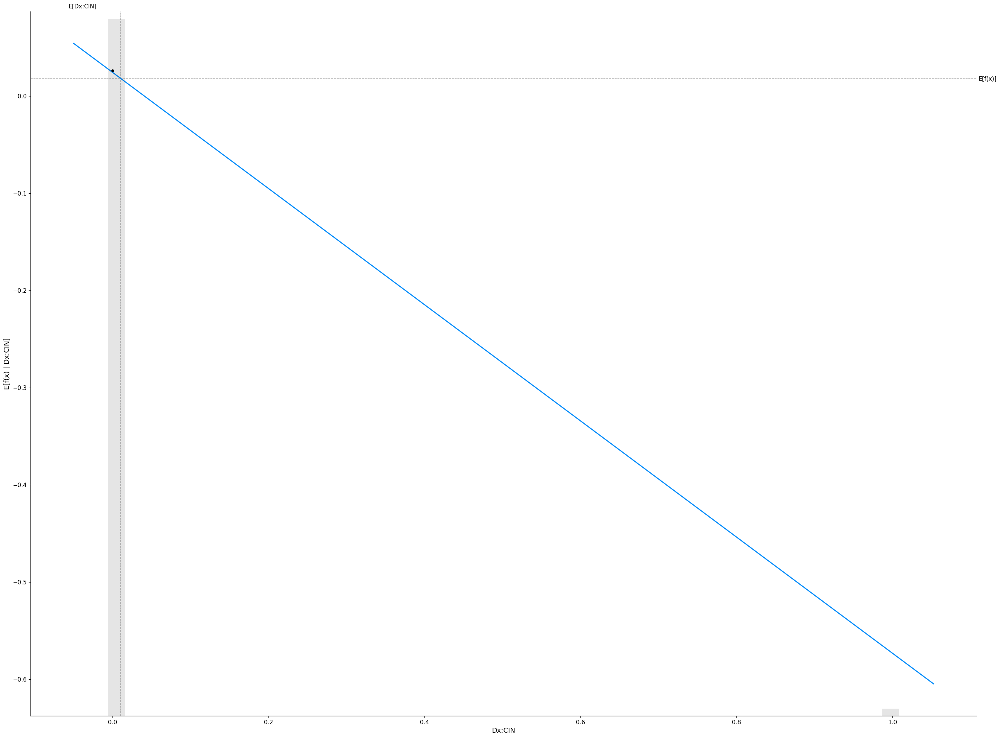

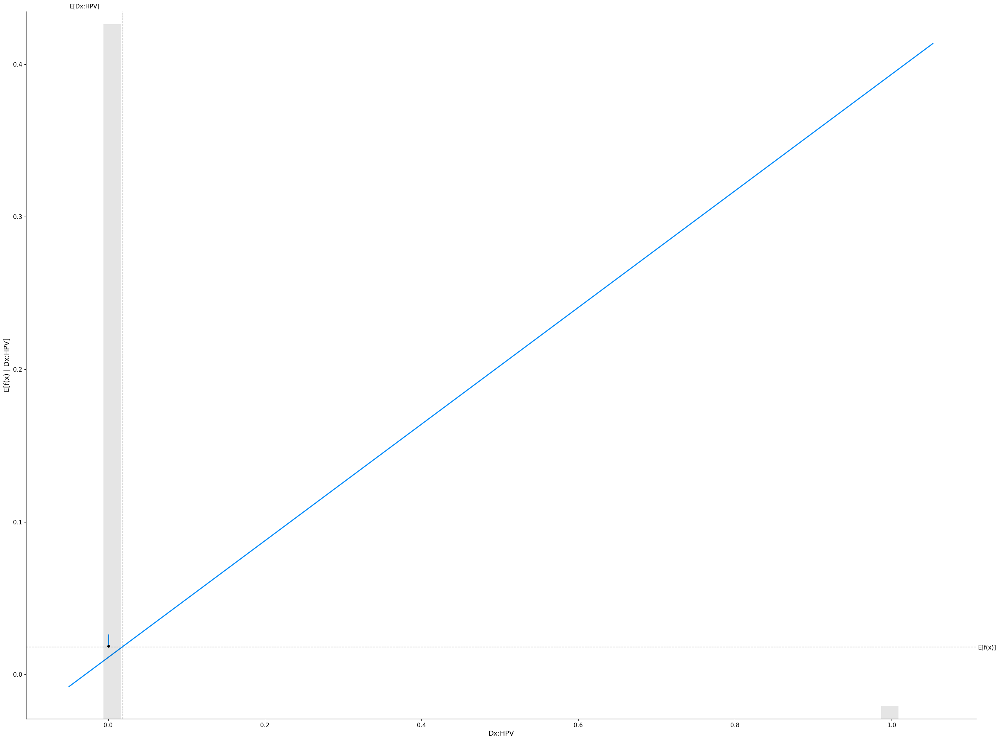

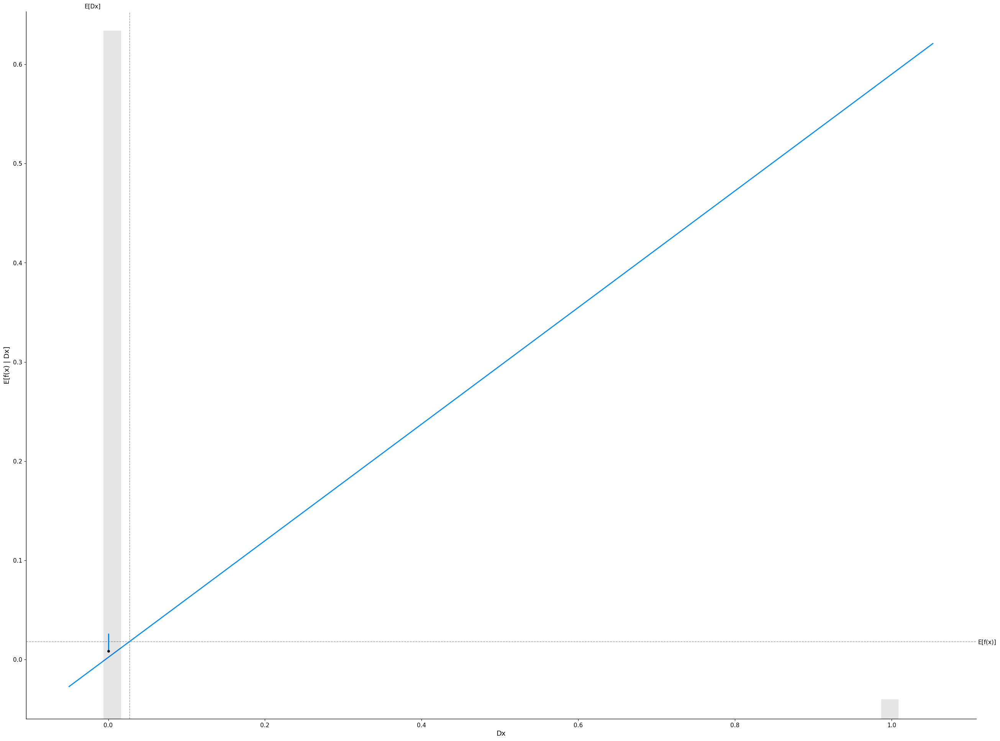

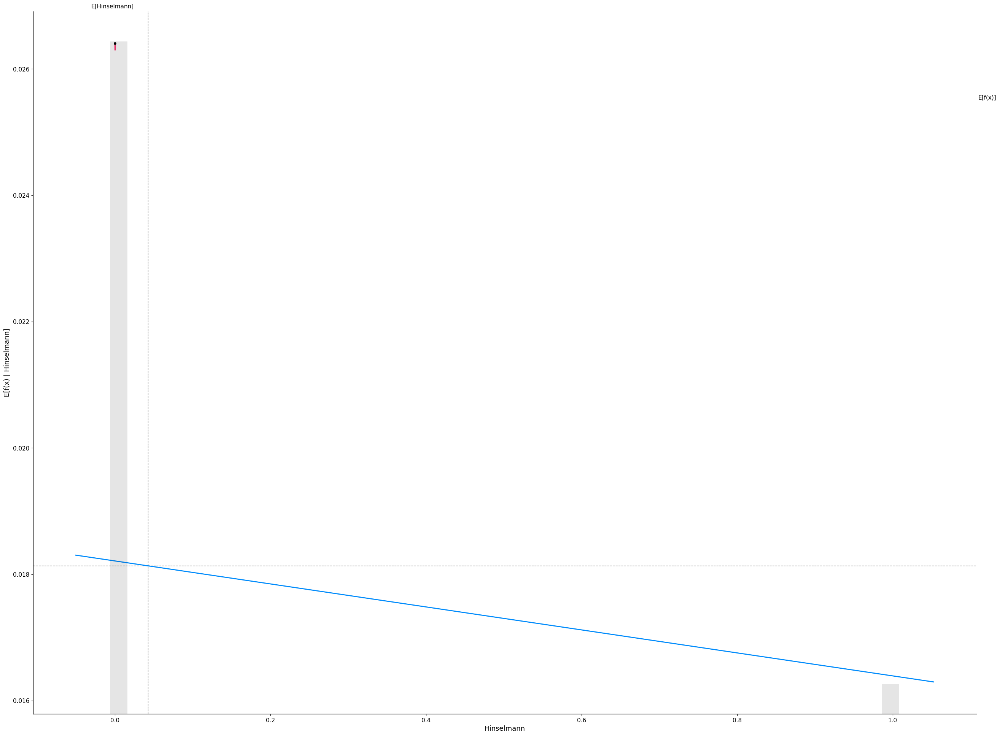

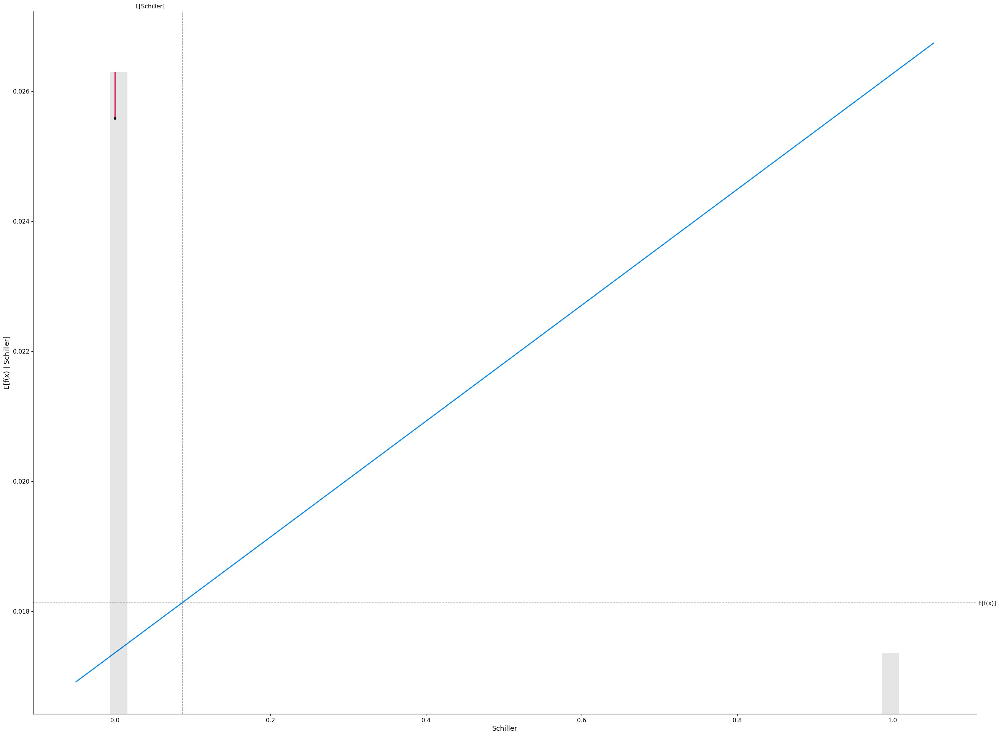

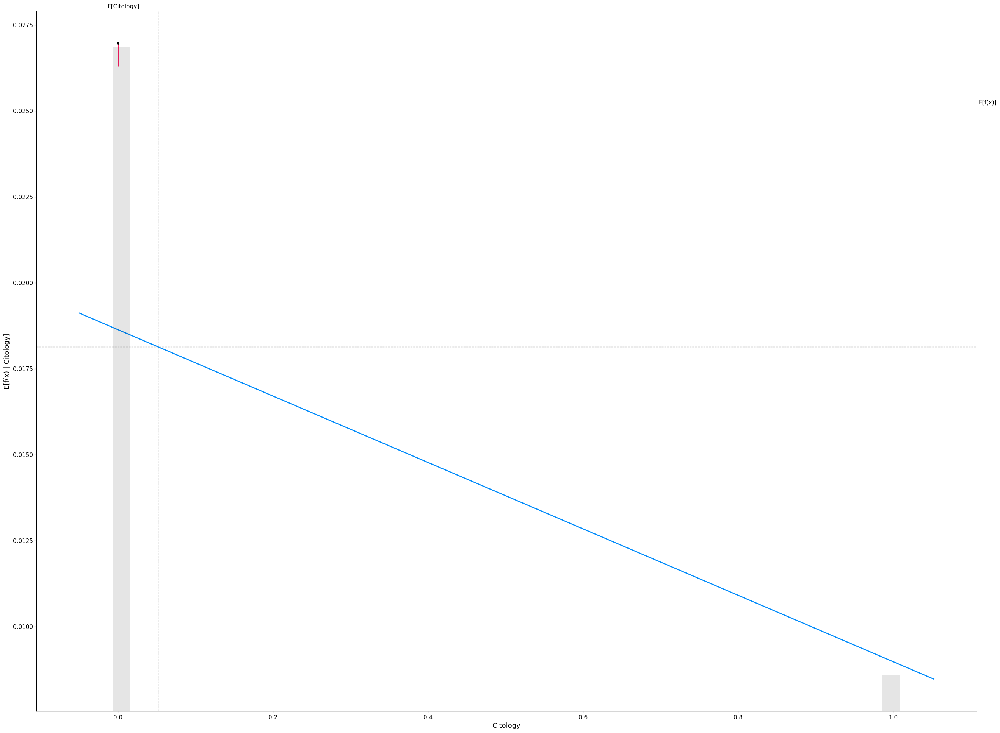

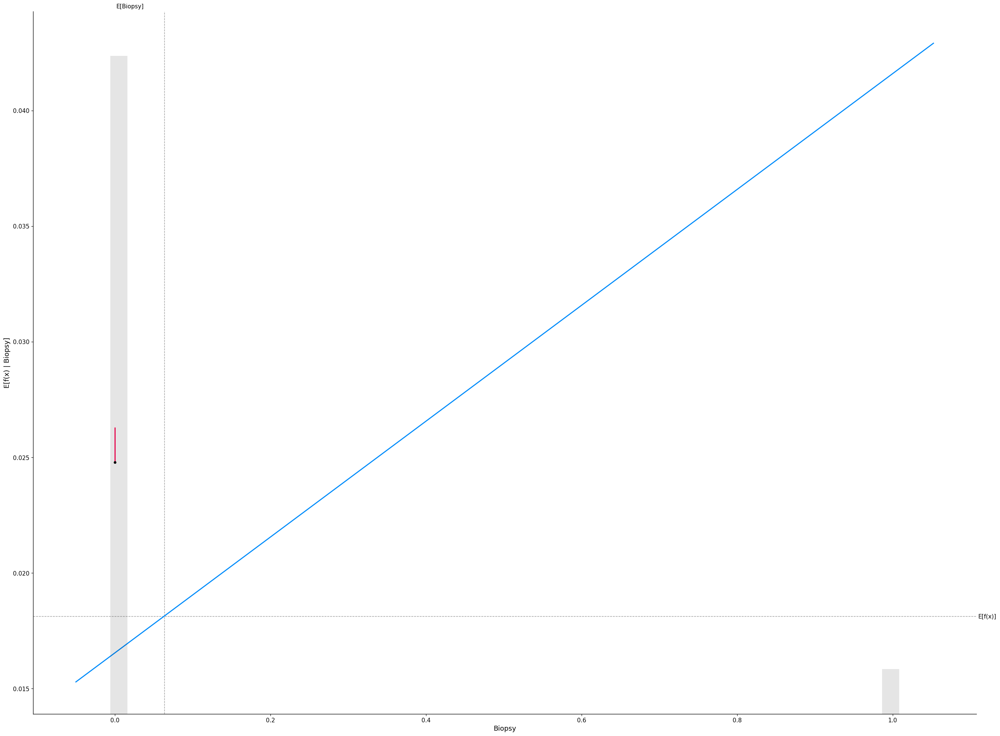

In [73]:
# SHAP explanation of a Linear Model
linear_explainer = shap.Explainer(linear_model.predict, X_train_p1)
linear_shap_values = linear_explainer(X_train_p1)
for i in X_train_p1.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        linear_model.predict,
        X_train_p1,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=linear_shap_values[sample_ind : sample_ind + 1, :],
    )

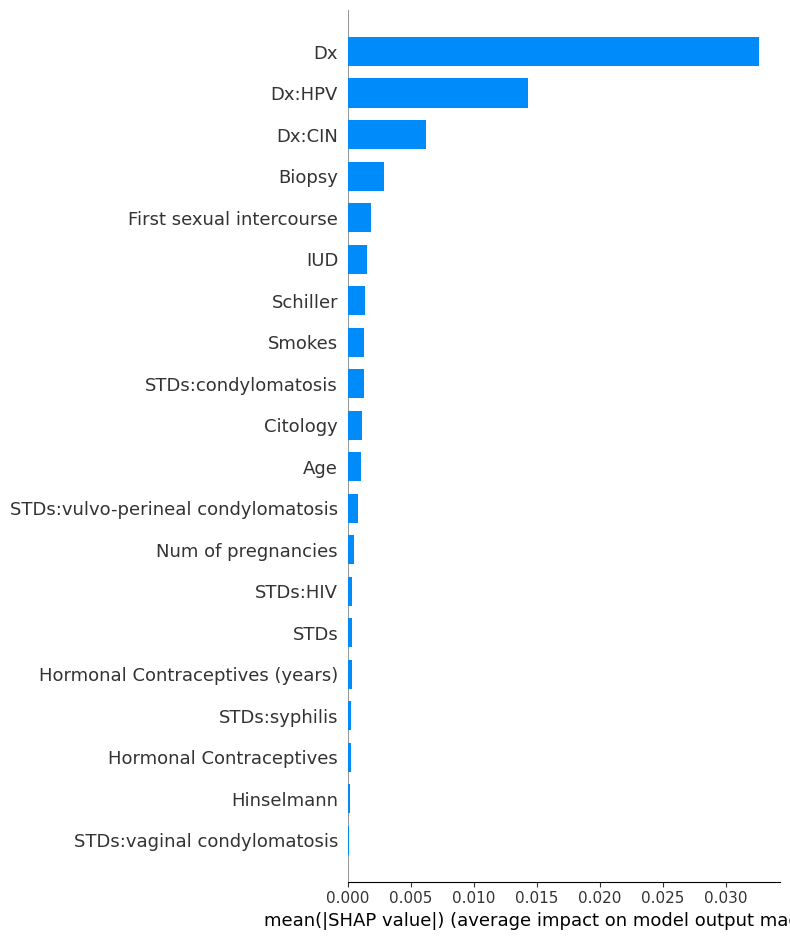

In [74]:
# shap_values = shap.TreeExplainer(model).shap_values(X_train)
shap.summary_plot(linear_shap_values, X_train_p1, plot_type="bar")

From this plot, we see that the feature "Dx" (possibly indicating some diagnostic measure or result) has the highest average impact on the model's predictions. This is followed by "Dx:HPV" (indicating a diagnosis of Human Papillomavirus), "Dx:CIN" (indicating a diagnosis of Cervical Intraepithelial Neoplasia), and "Biopsy". These top features are likely key indicators that the model relies on to predict cervical cancer.

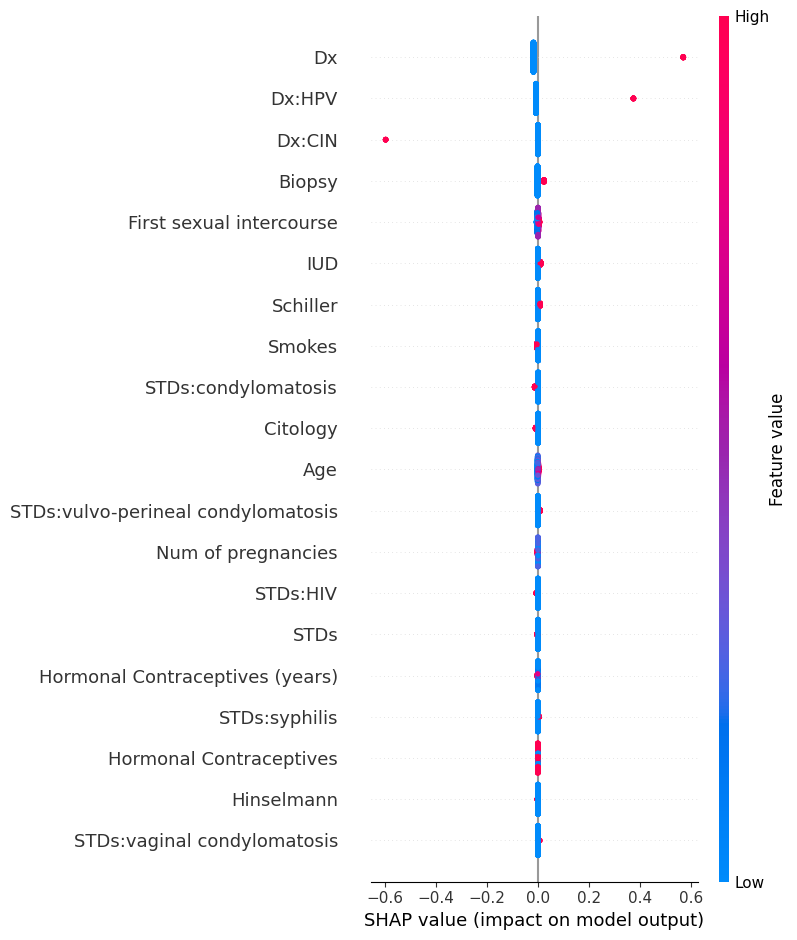

In [75]:
shap.summary_plot(linear_shap_values, X_train_p1)

This plot highlights "Dx:CIN", "Dx:HPV", and "Dx" as the top features that contribute positively to the model's prediction of cervical cancer. The spread and position of the SHAP values for these features show that their higher values are associated with an increased prediction of cervical cancer by the model.

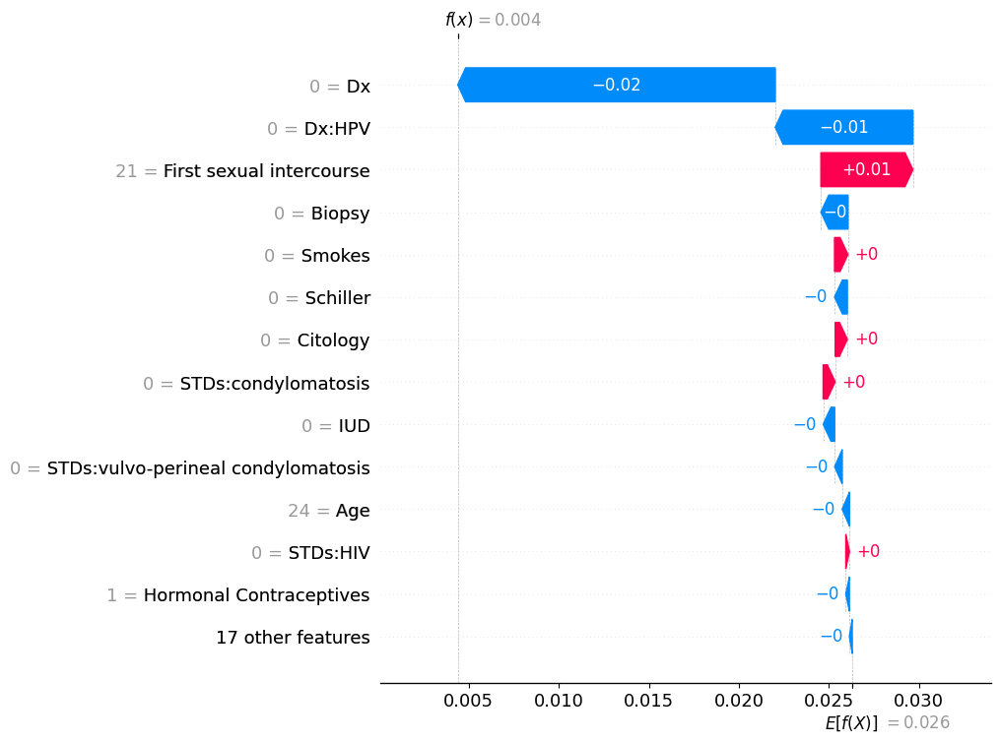

In [76]:
shap.plots.waterfall(linear_shap_values[sample_ind], max_display=14)

The waterfall chart shows the incremental effect of various features on a machine learning prediction, beginning with a base prediction of 0. Negative influences such as 'Dx' slightly decrease the predicted value, while positive contributions from features like 'First Sexual intercourse' and 'Hormonal Contraceptives' increase the prediction, cumulating in a final predicted value of 0.026. The chart helps in understanding how each feature's presence or absence (indicated by the value next to the feature name) pushes the model's output higher or lower for a particular instance.

**Shap Analysis on Treebased Model**

PermutationExplainer explainer: 773it [00:50, 11.95it/s]


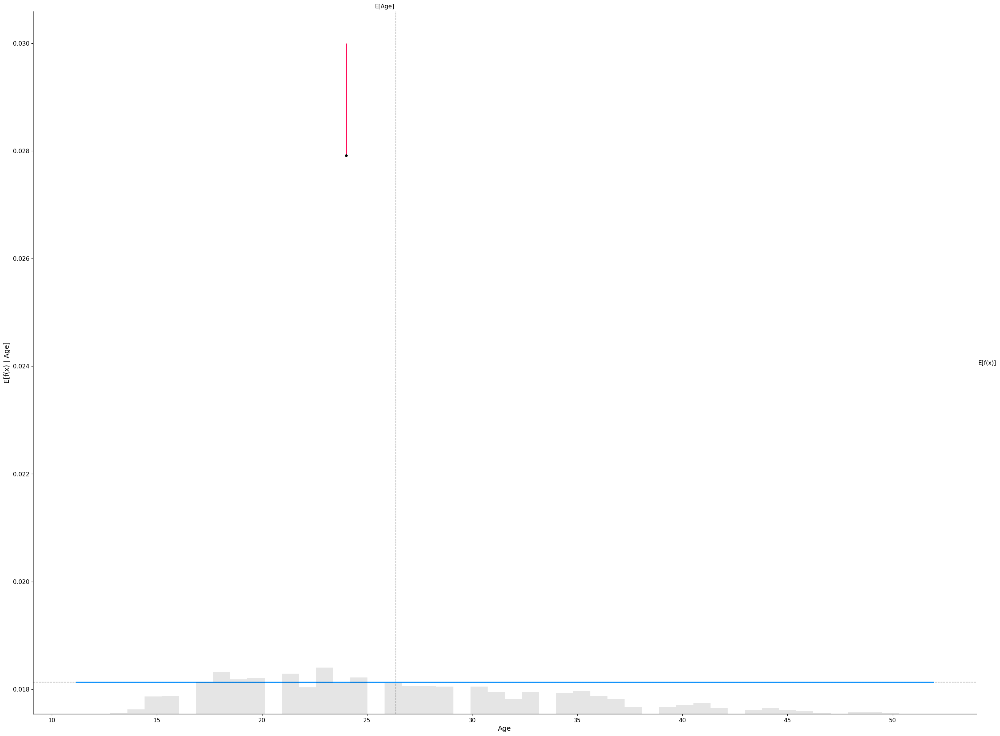

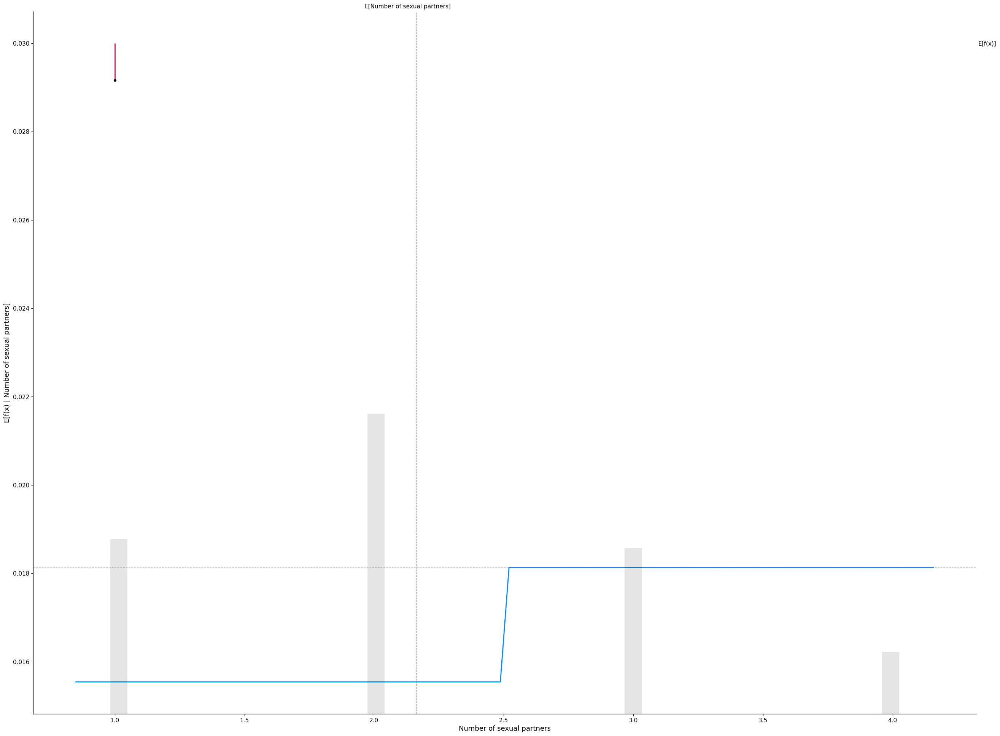

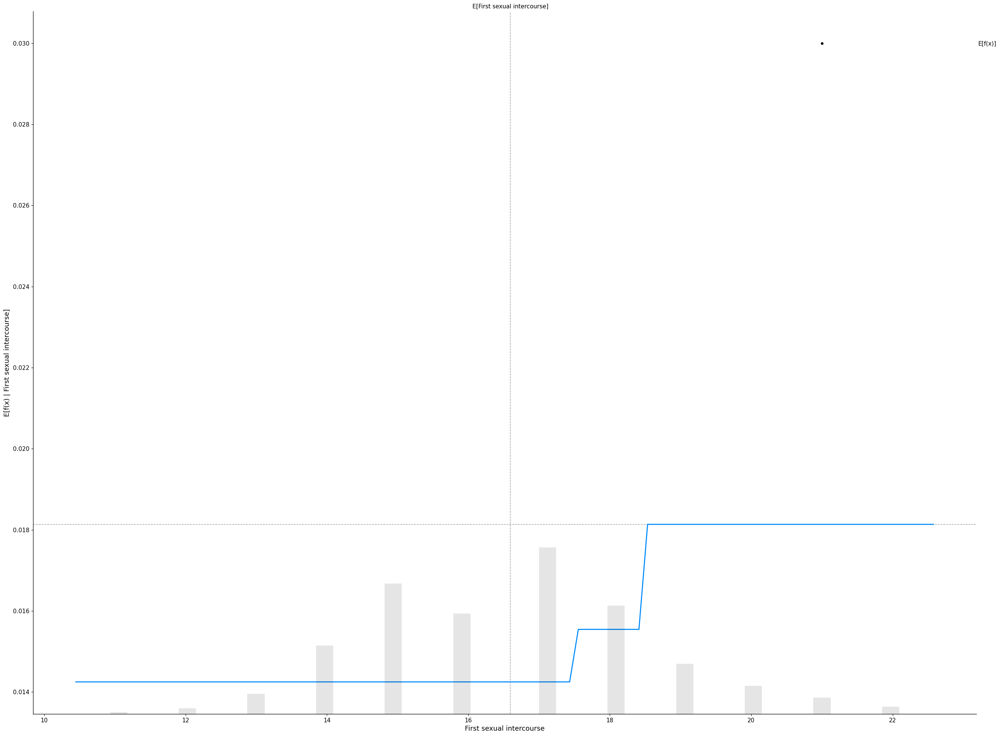

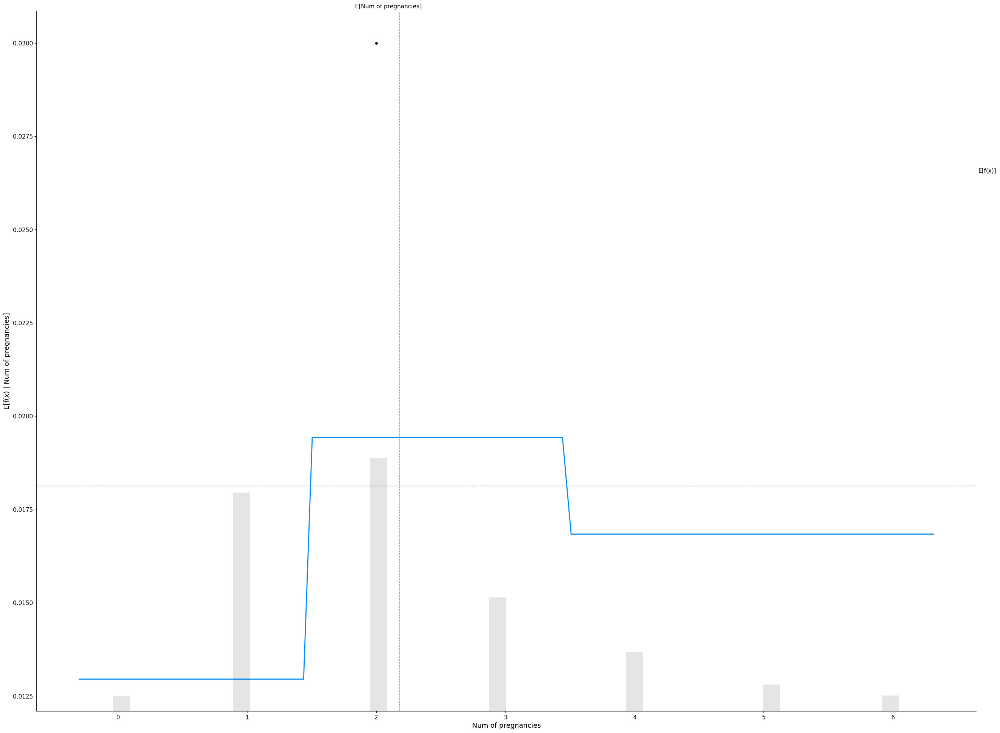

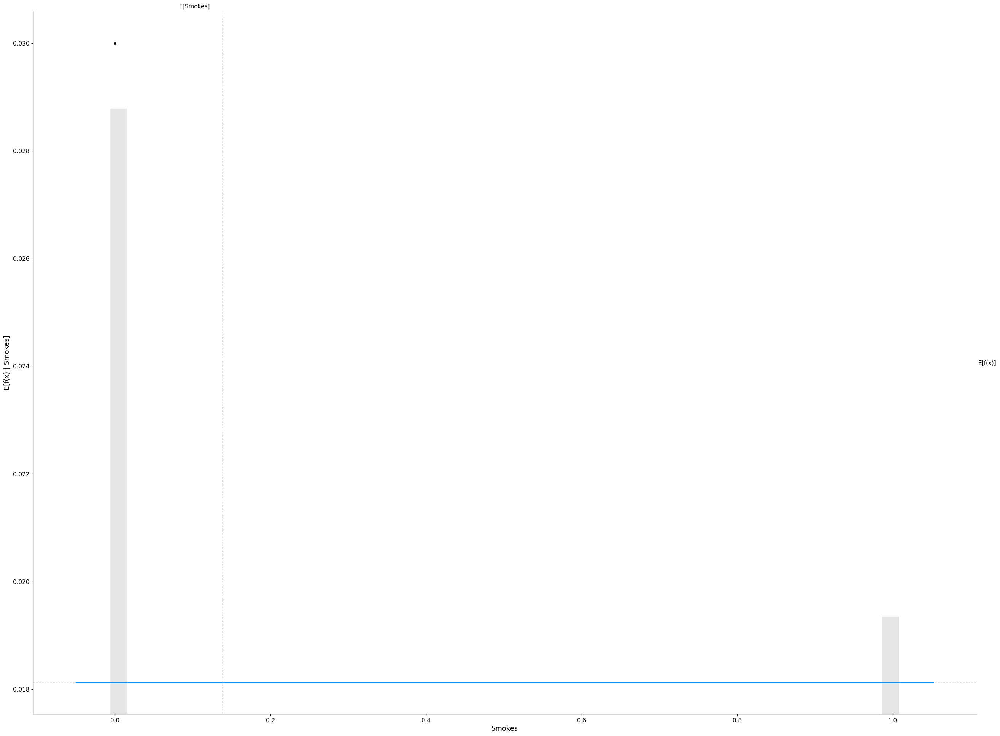

/usr/local/lib/python3.10/dist-packages/shap/plots/_partial_dependence.py:137: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax3.set_xlim(xmin,xmax)


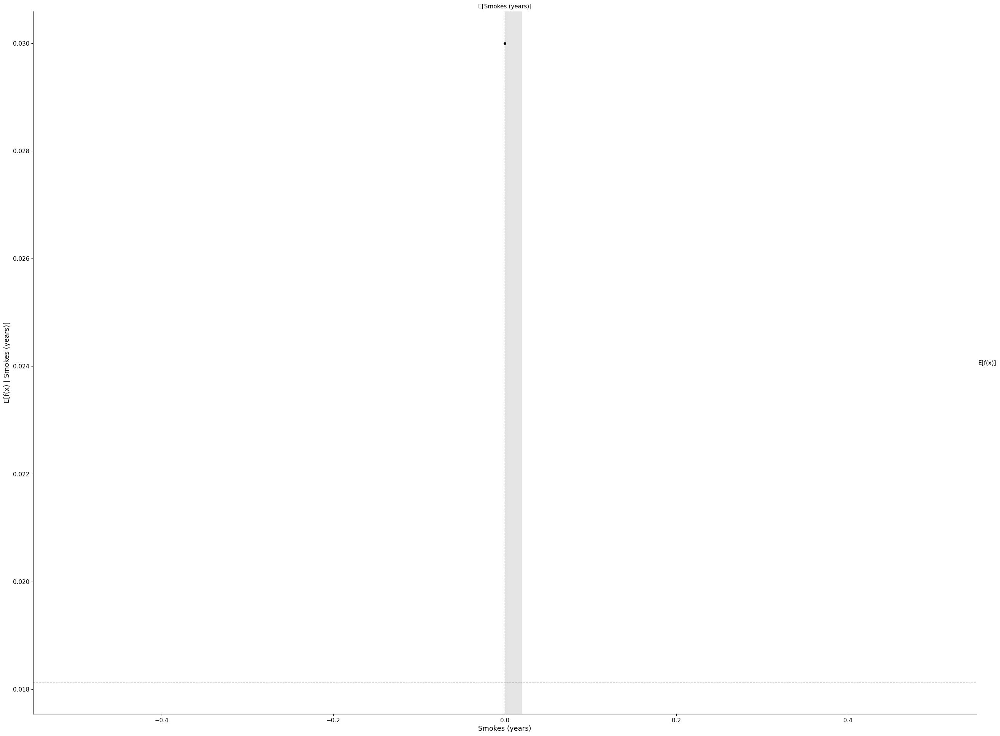

/usr/local/lib/python3.10/dist-packages/shap/plots/_partial_dependence.py:137: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax3.set_xlim(xmin,xmax)


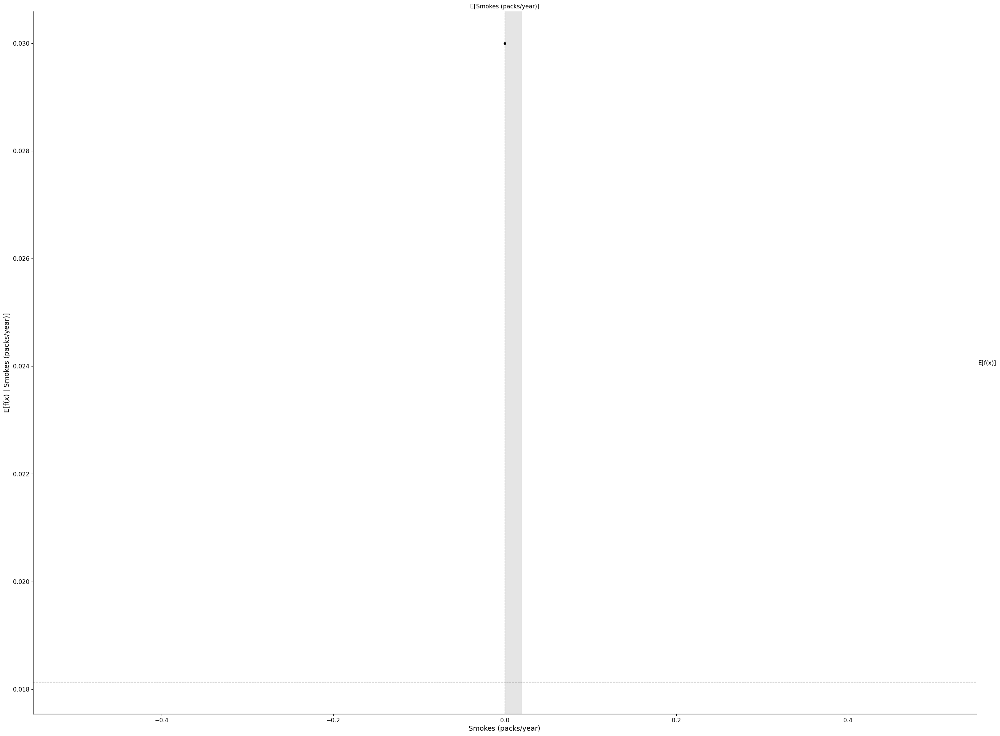

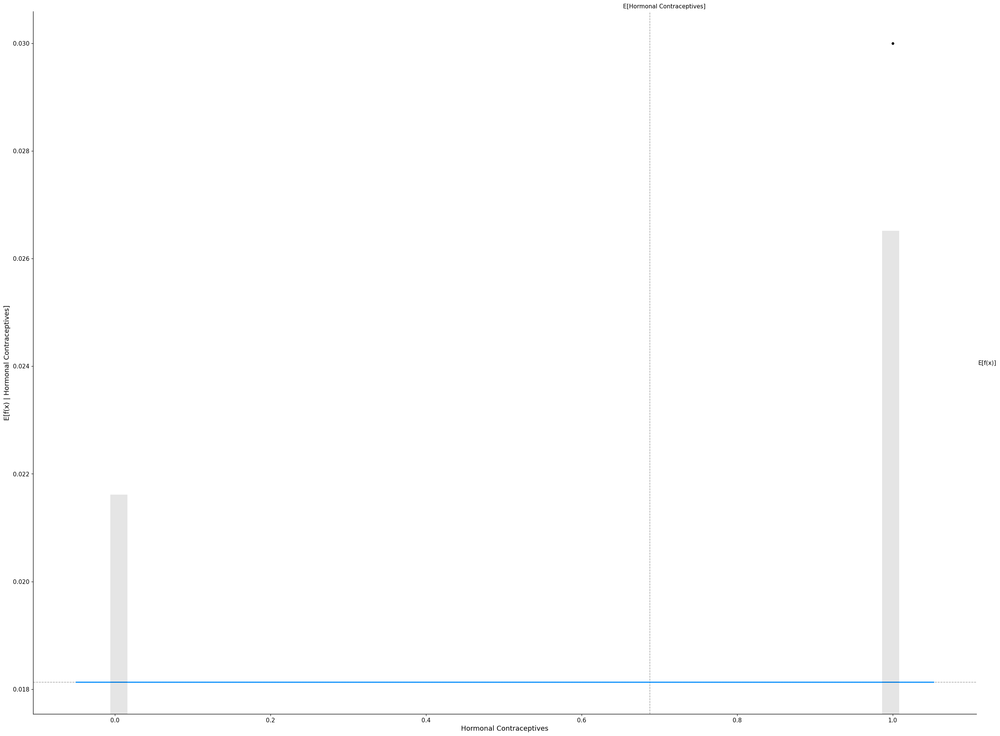

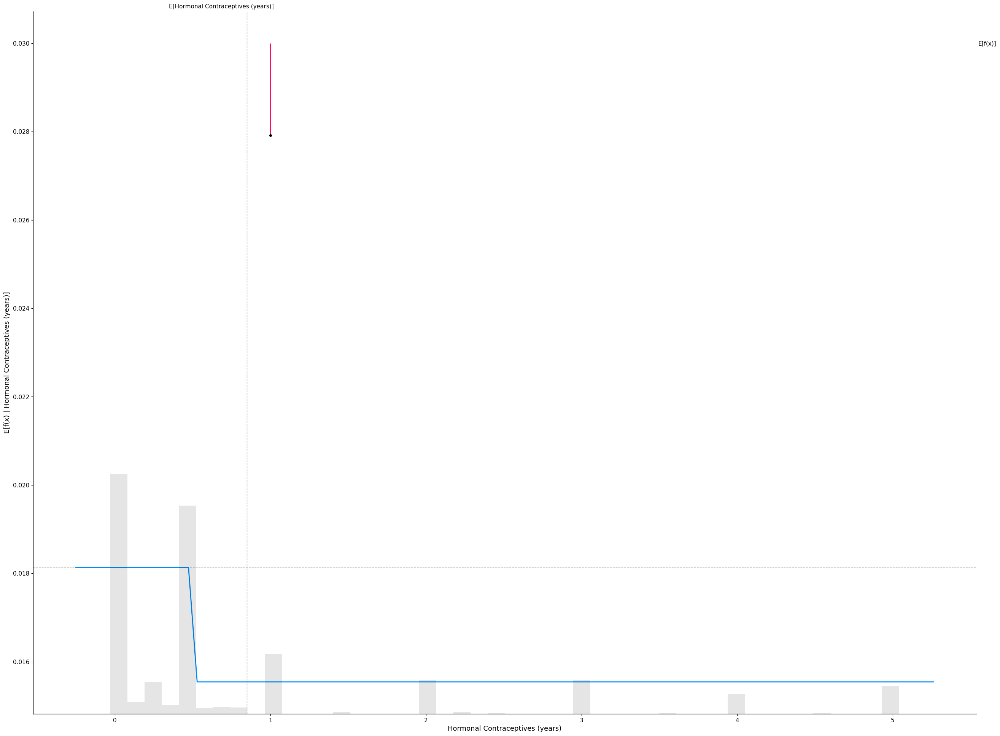

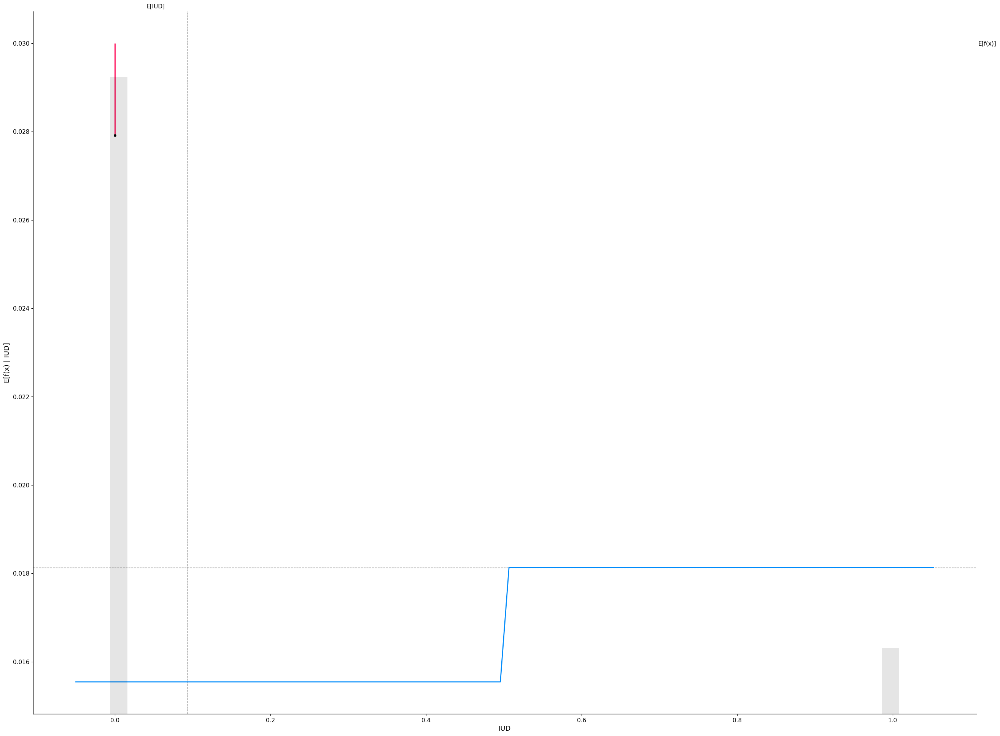

/usr/local/lib/python3.10/dist-packages/shap/plots/_partial_dependence.py:137: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax3.set_xlim(xmin,xmax)


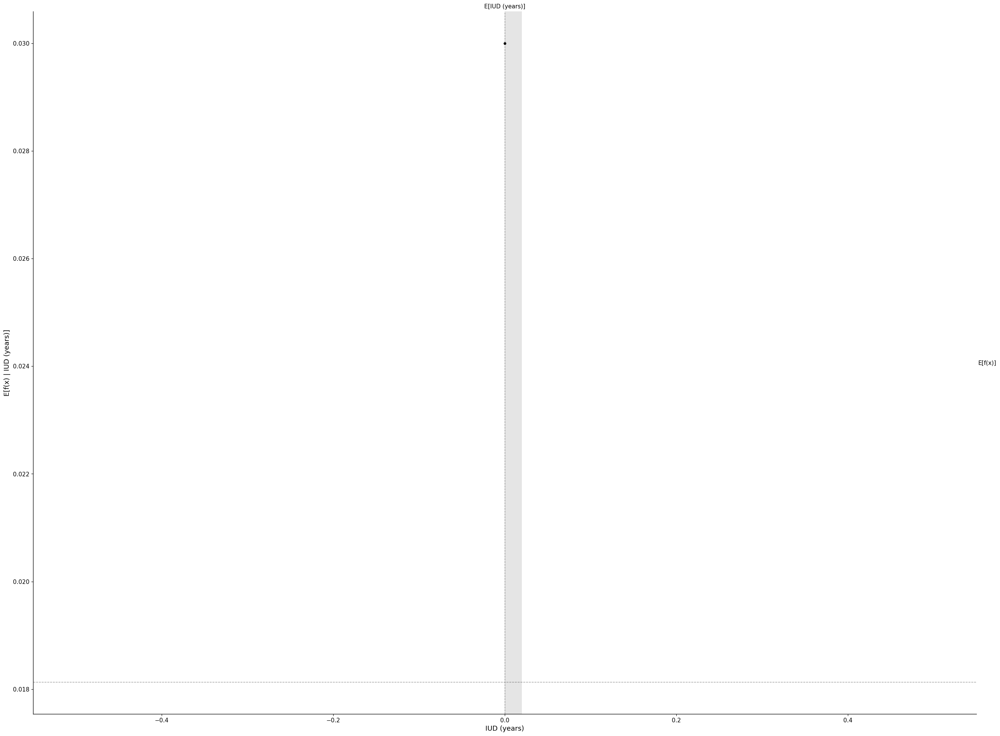

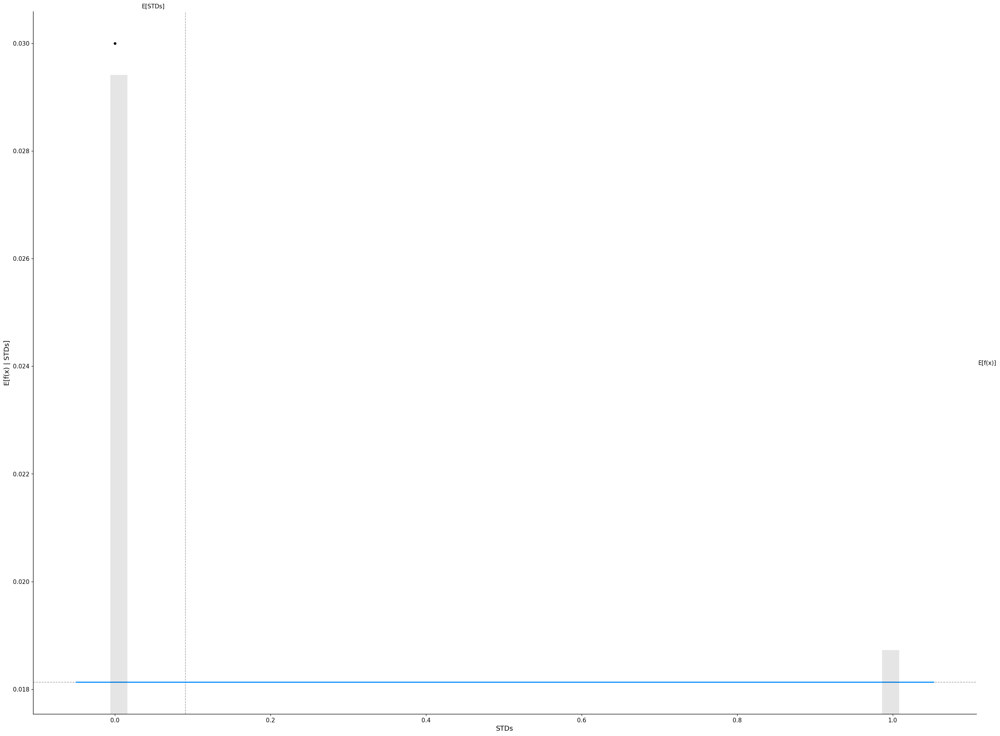

/usr/local/lib/python3.10/dist-packages/shap/plots/_partial_dependence.py:137: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax3.set_xlim(xmin,xmax)


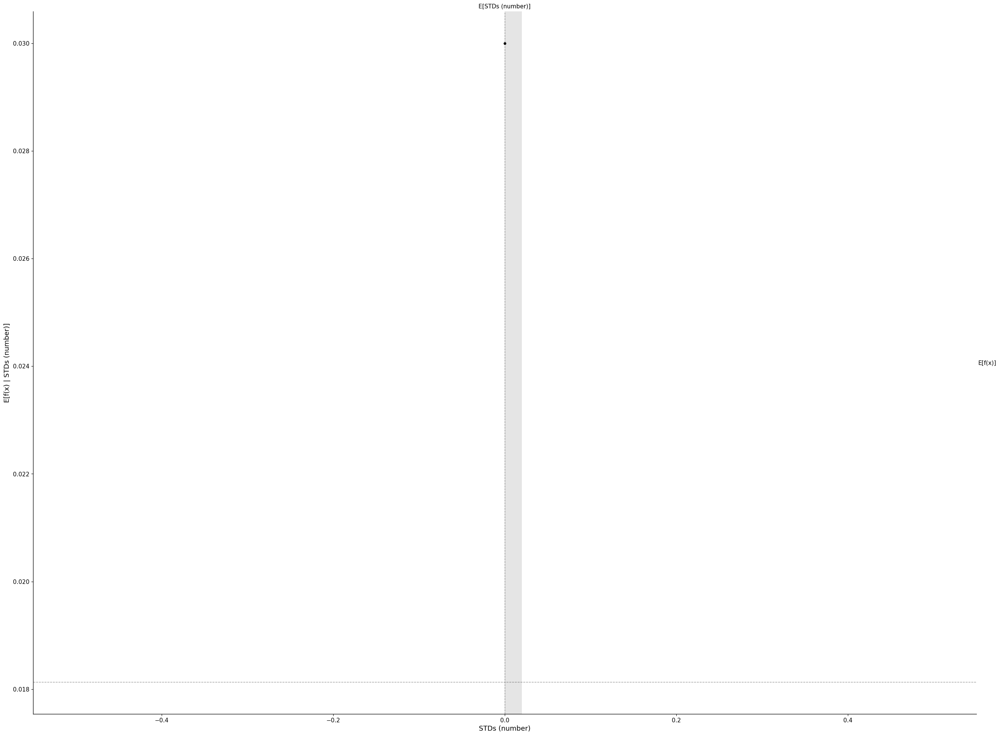

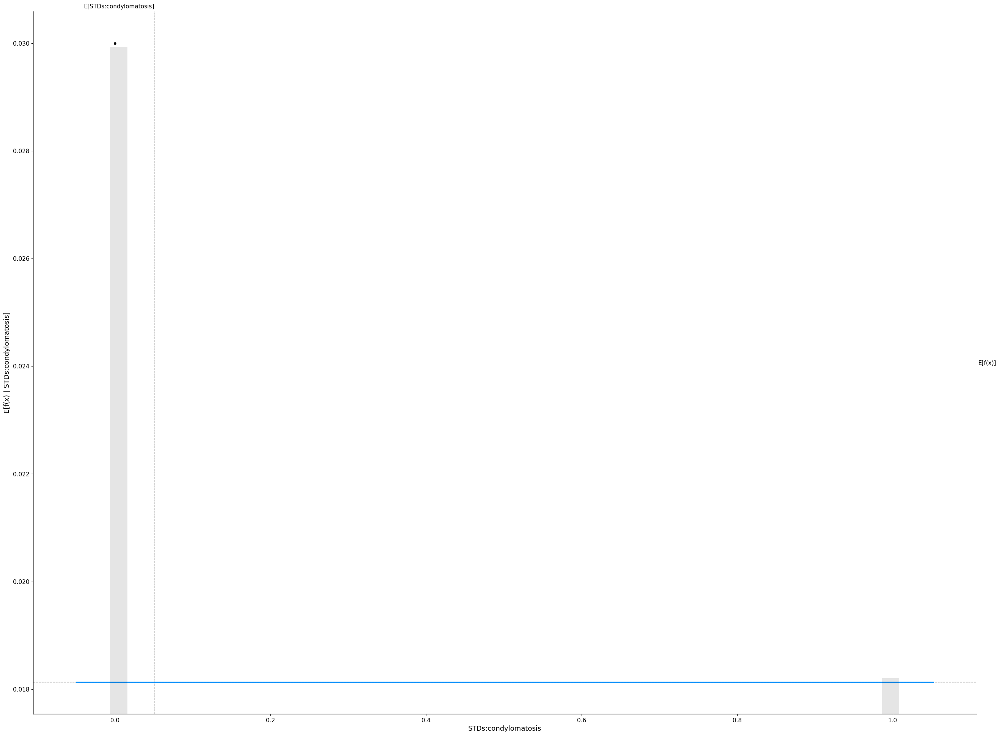

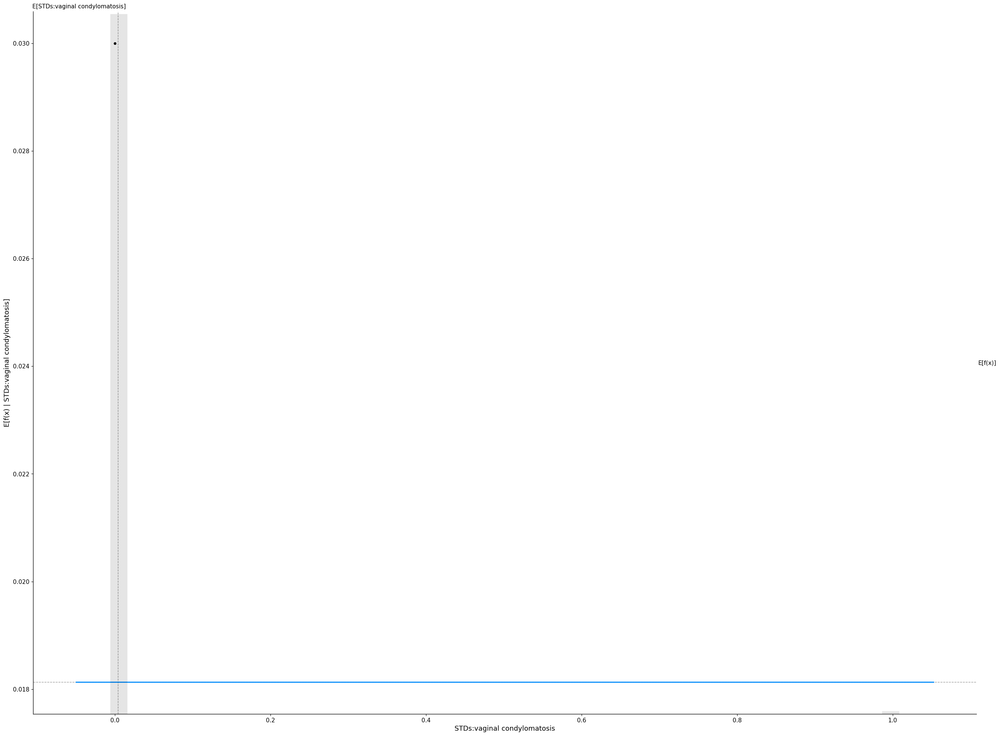

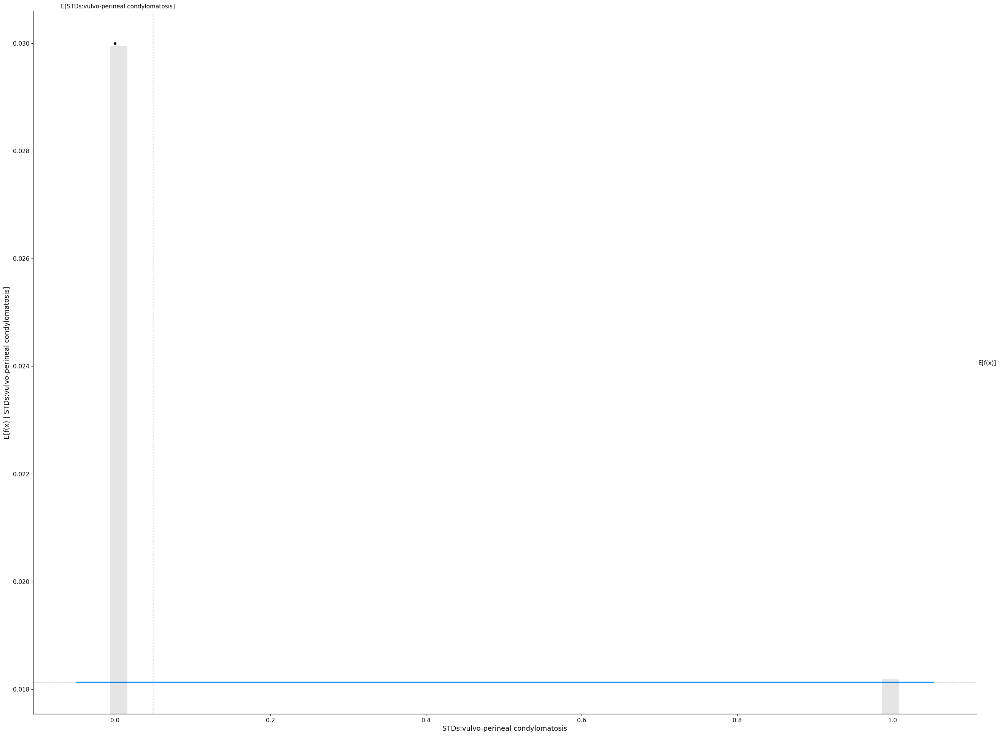

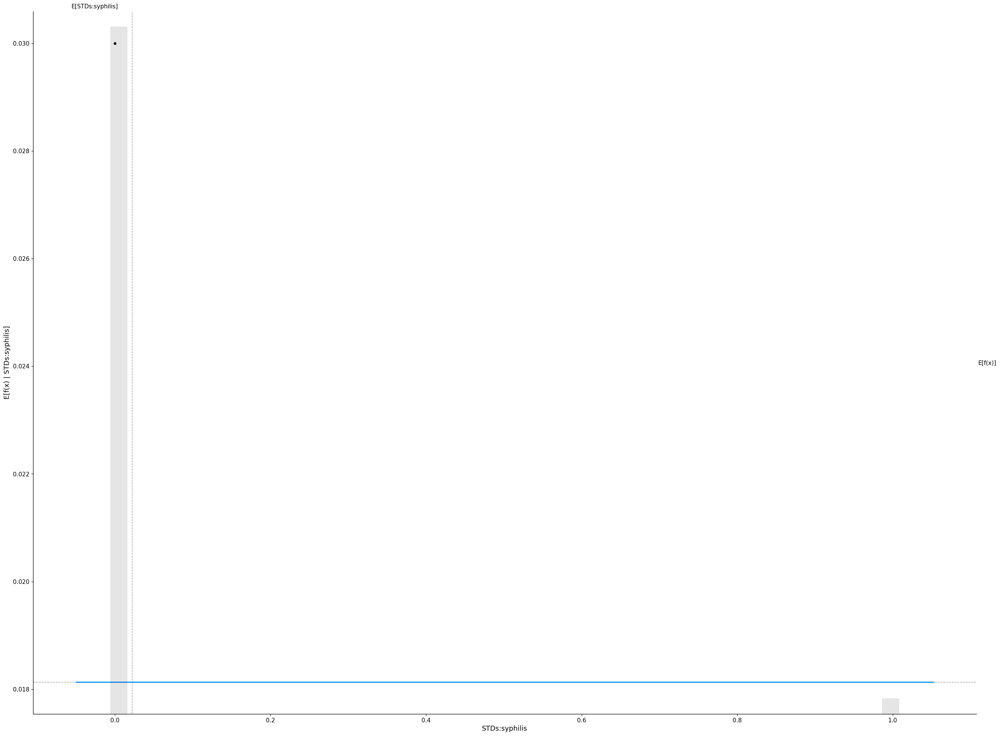

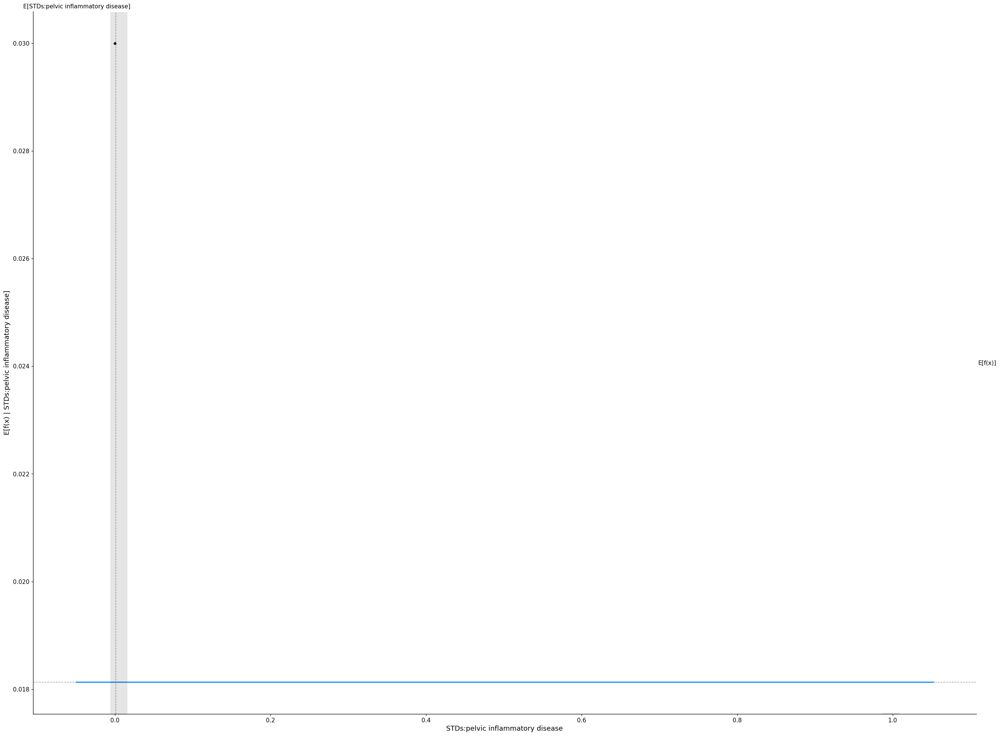

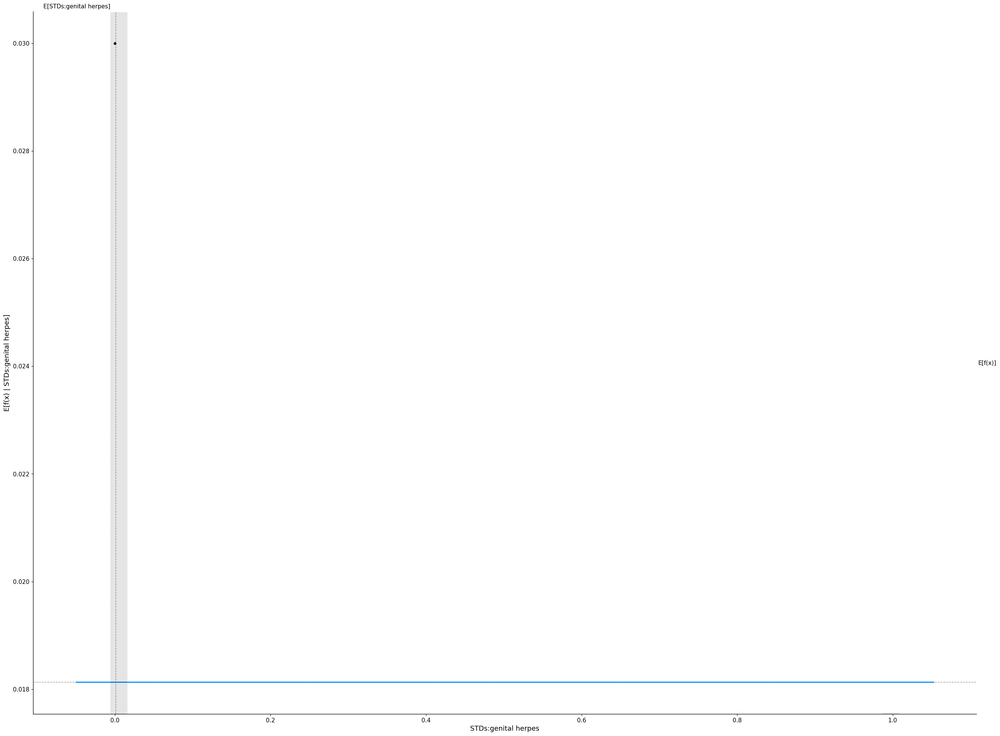

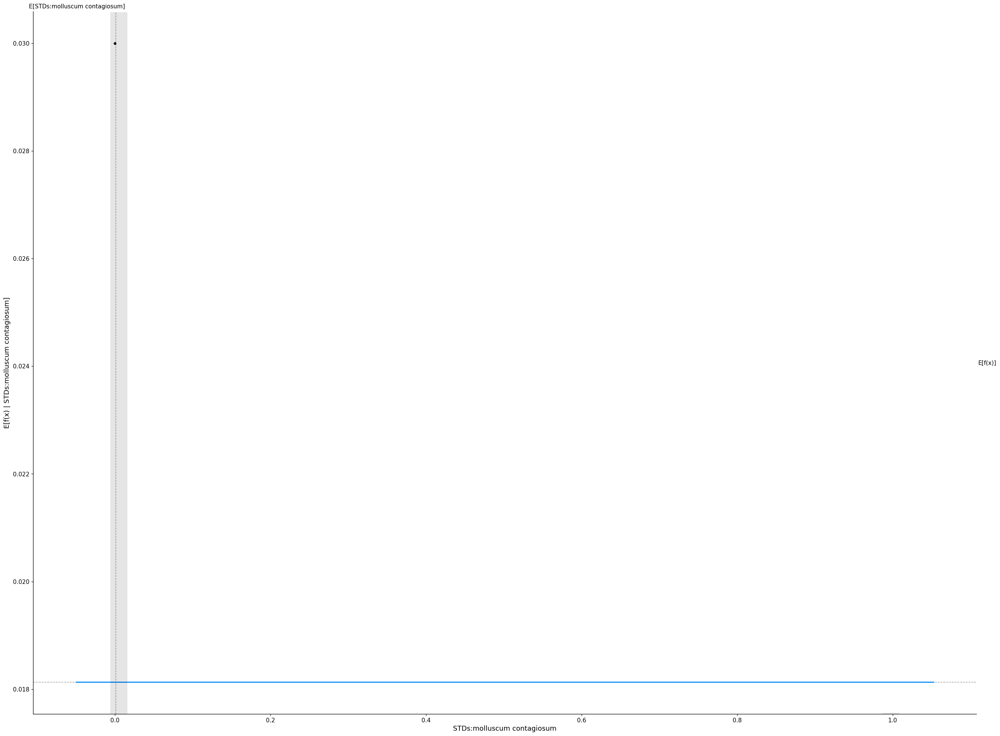

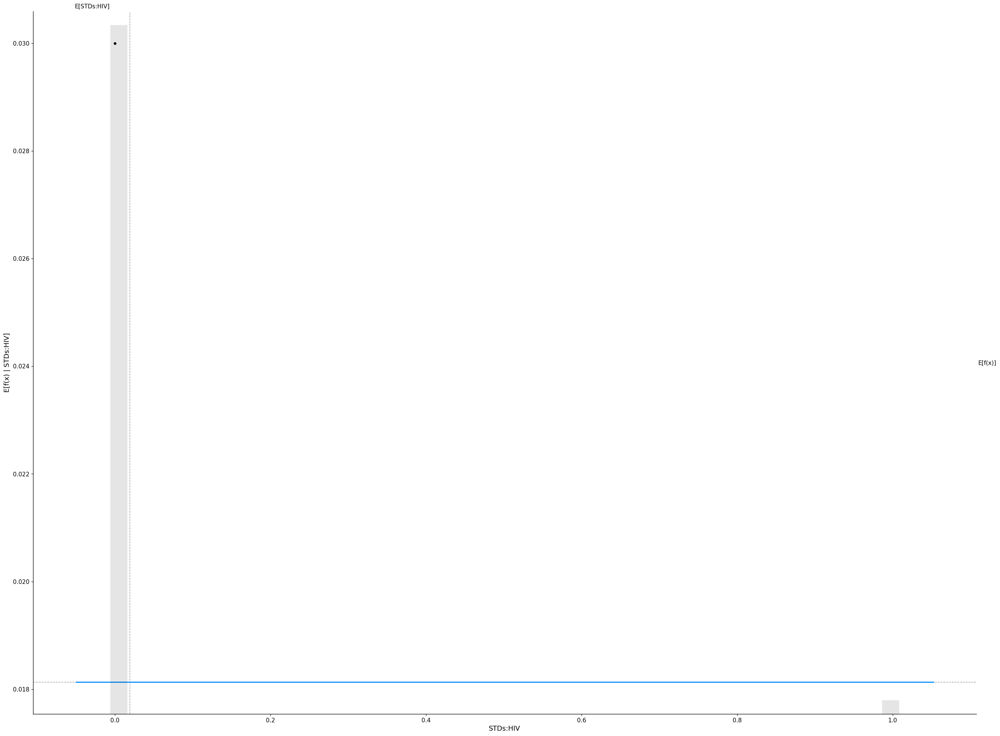

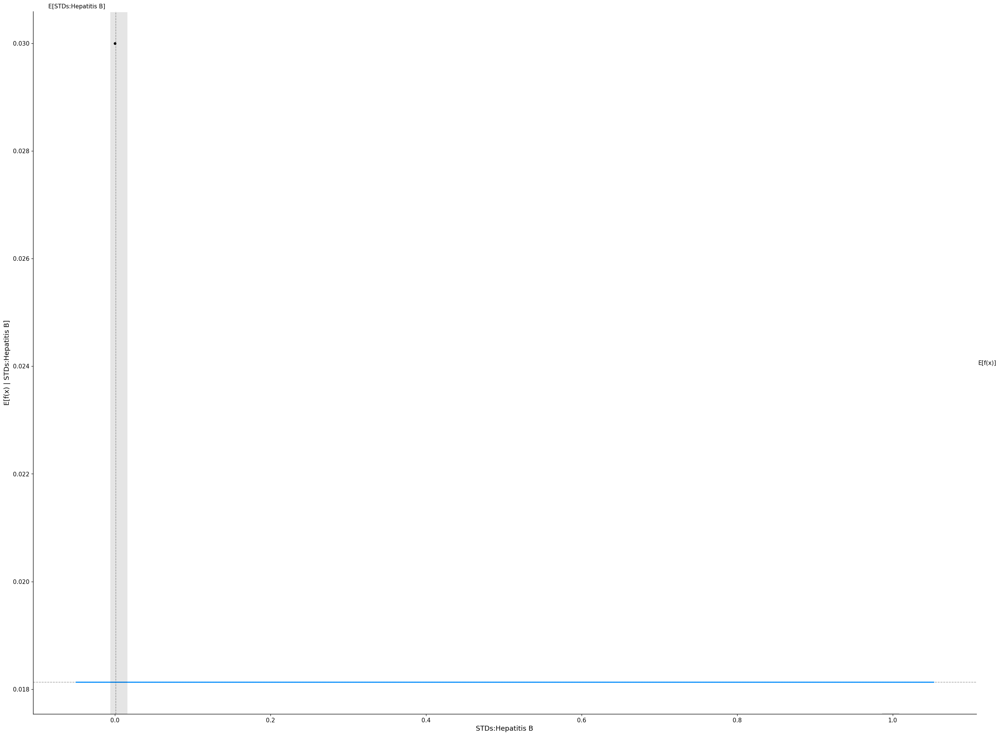

/usr/local/lib/python3.10/dist-packages/shap/plots/_partial_dependence.py:137: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax3.set_xlim(xmin,xmax)


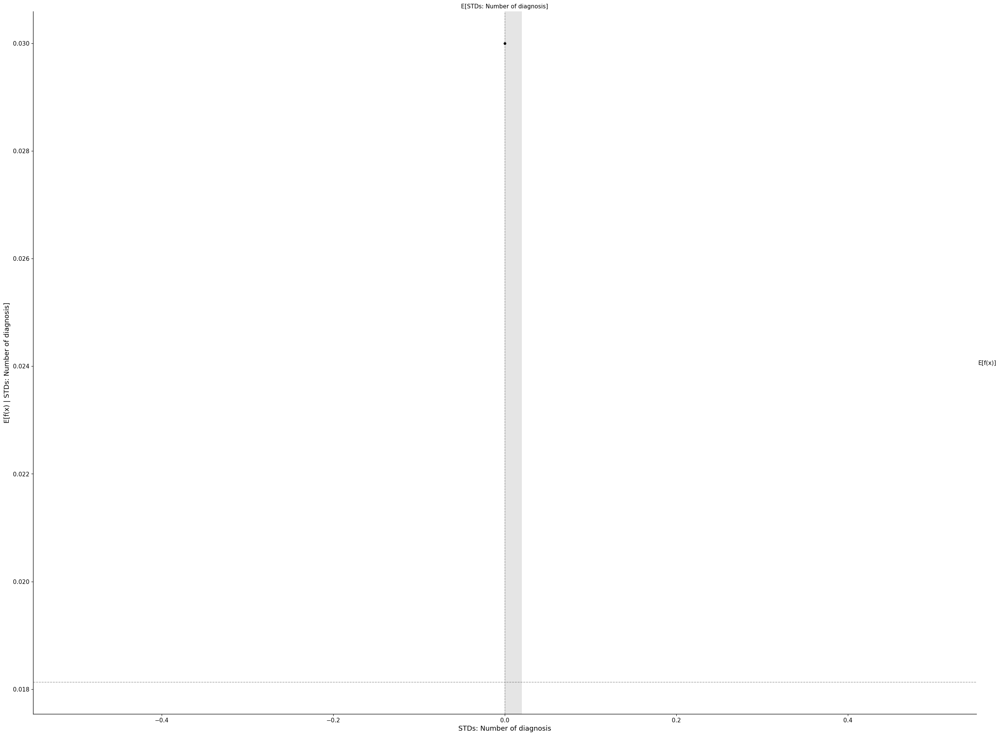

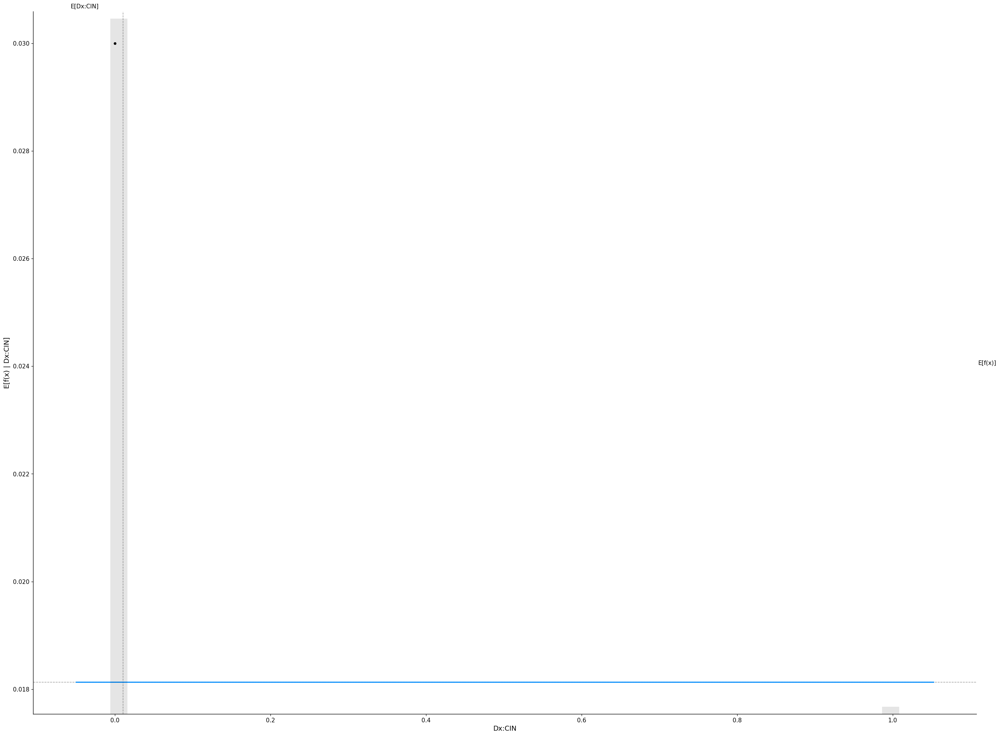

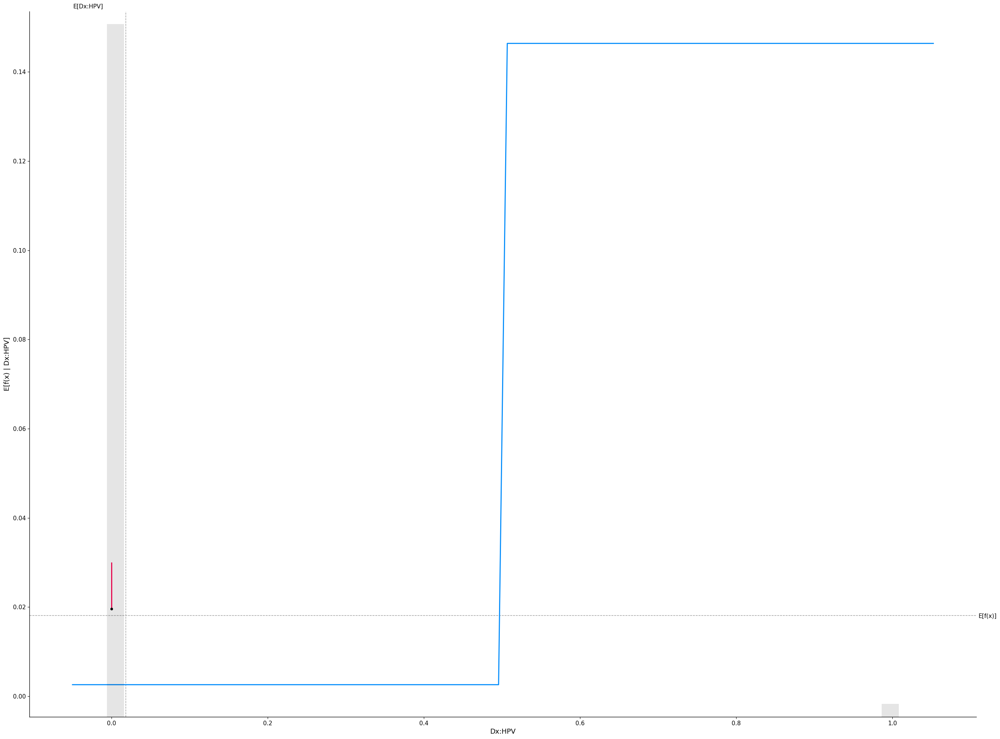

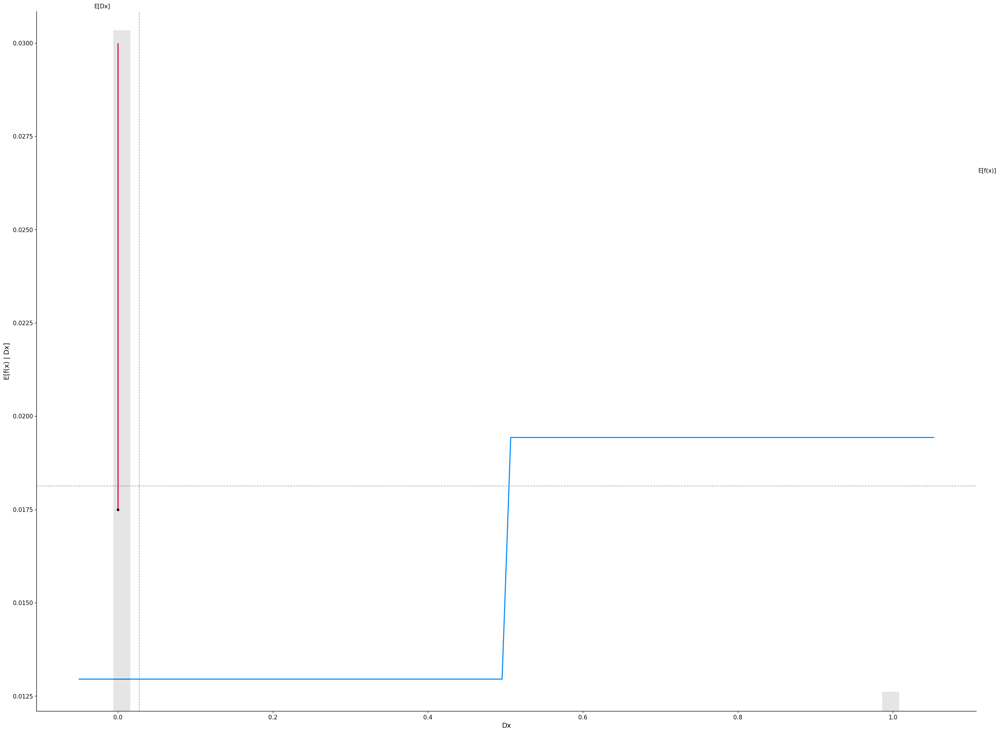

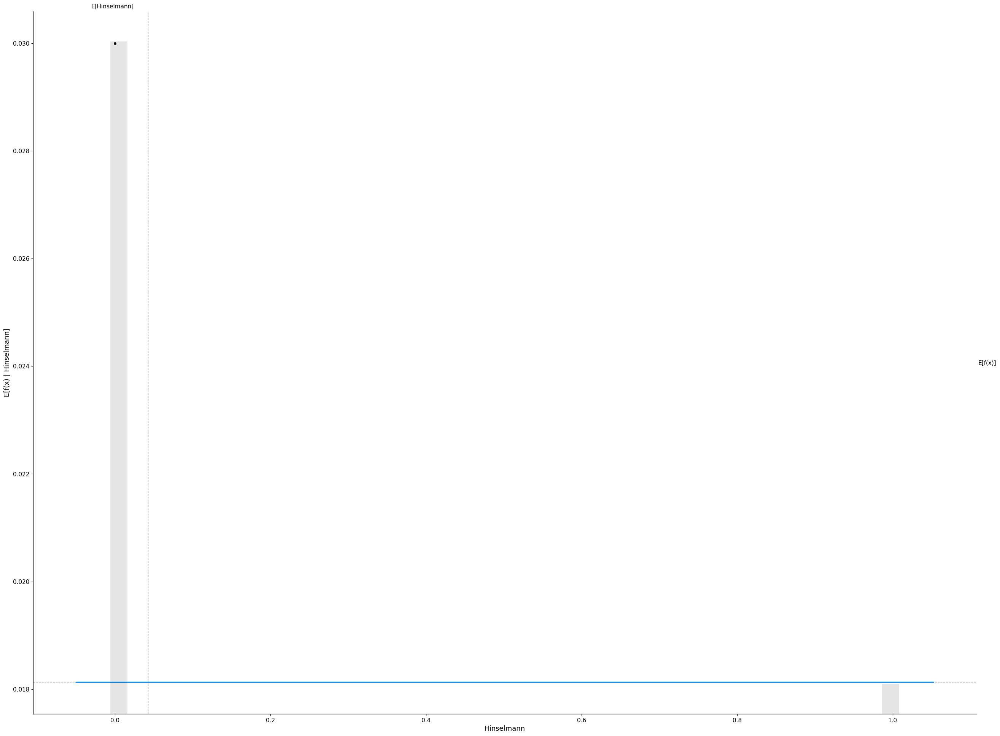

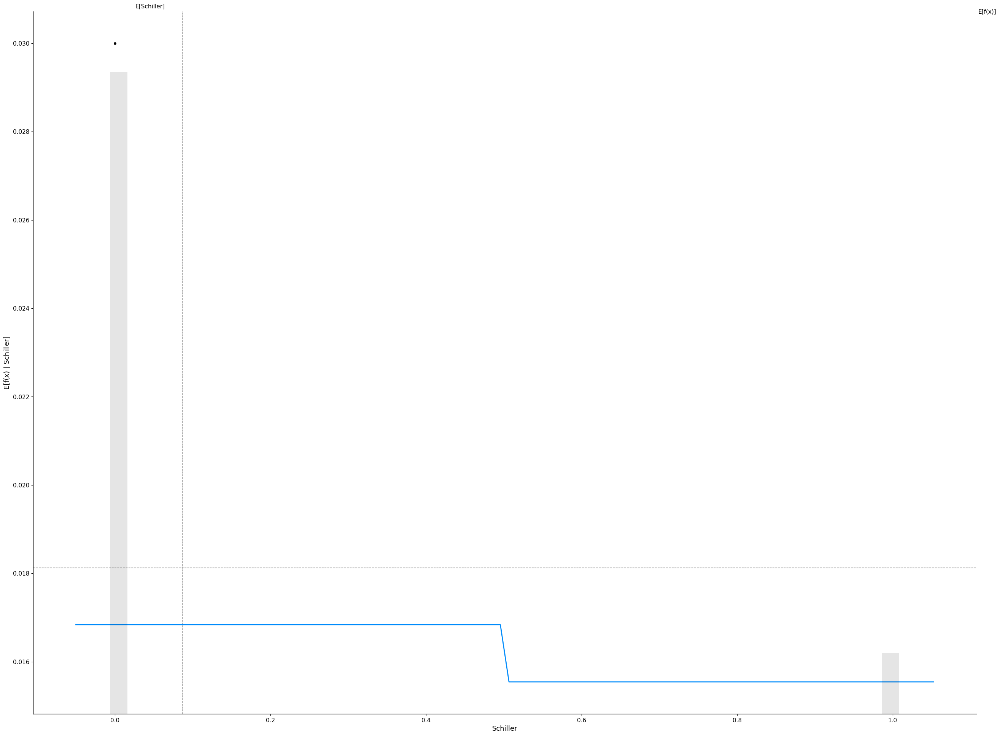

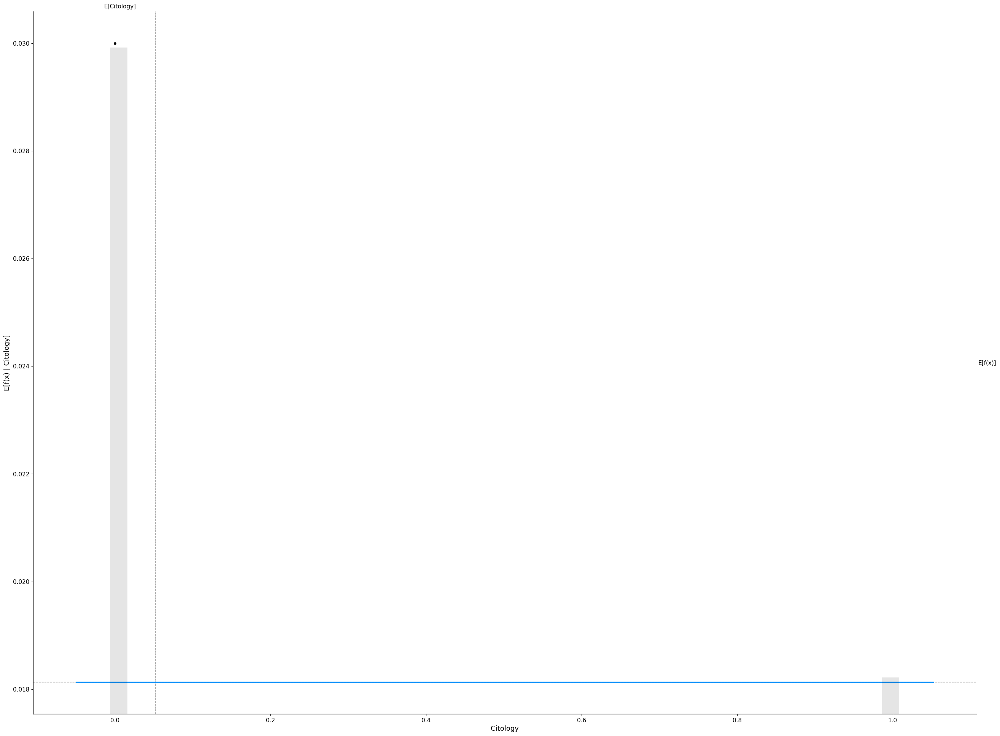

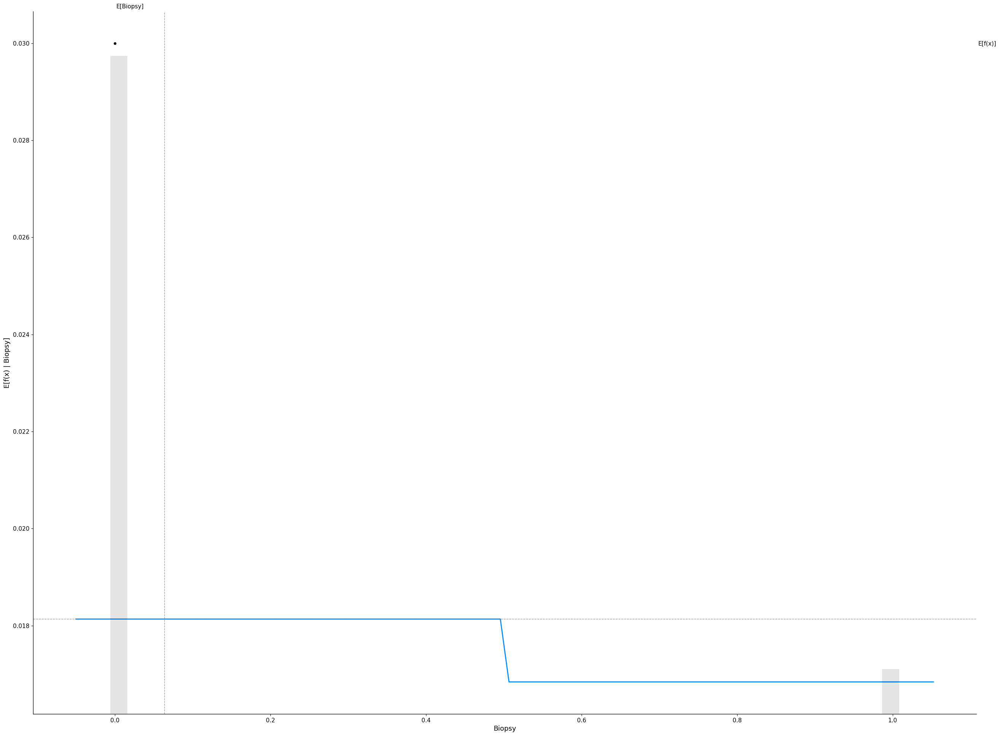

In [77]:
# SHAP explanation of a tree based model
tree_explainer = shap.Explainer(random_model.predict, X_train_p1)
tree_shap_values = tree_explainer(X_train_p1)
for i in X_train_p1.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        random_model.predict,
        X_train_p1,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=tree_shap_values[sample_ind : sample_ind + 1, :],
    )

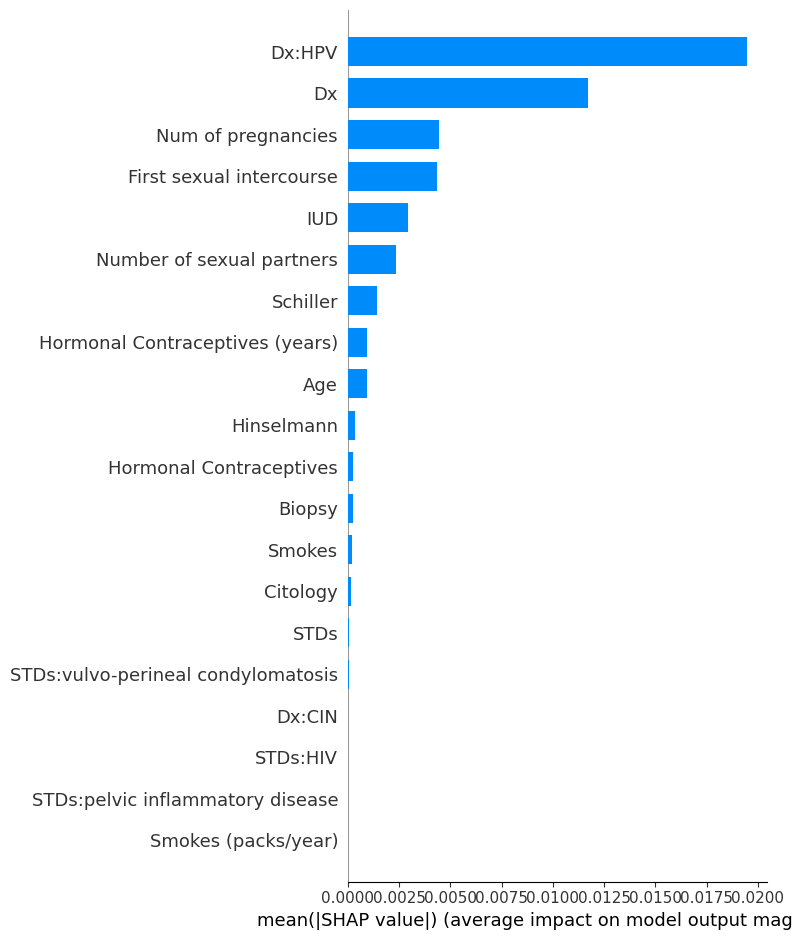

In [78]:
shap.summary_plot(tree_shap_values, X_train_p1, plot_type="bar")

This bar chart suggests that the Random Forest model considers "Dx:HPV", "Dx", and "Number of pregnancies" as the most influential factors in predicting the outcome. The presence or higher values of these features likely indicate a higher likelihood of the model predicting a positive outcome for cervical cancer. Conversely, other factors such as "STDs:genital herpes" and "Smokes (packs/year)" seem to have a lesser average impact on the model’s predictions.

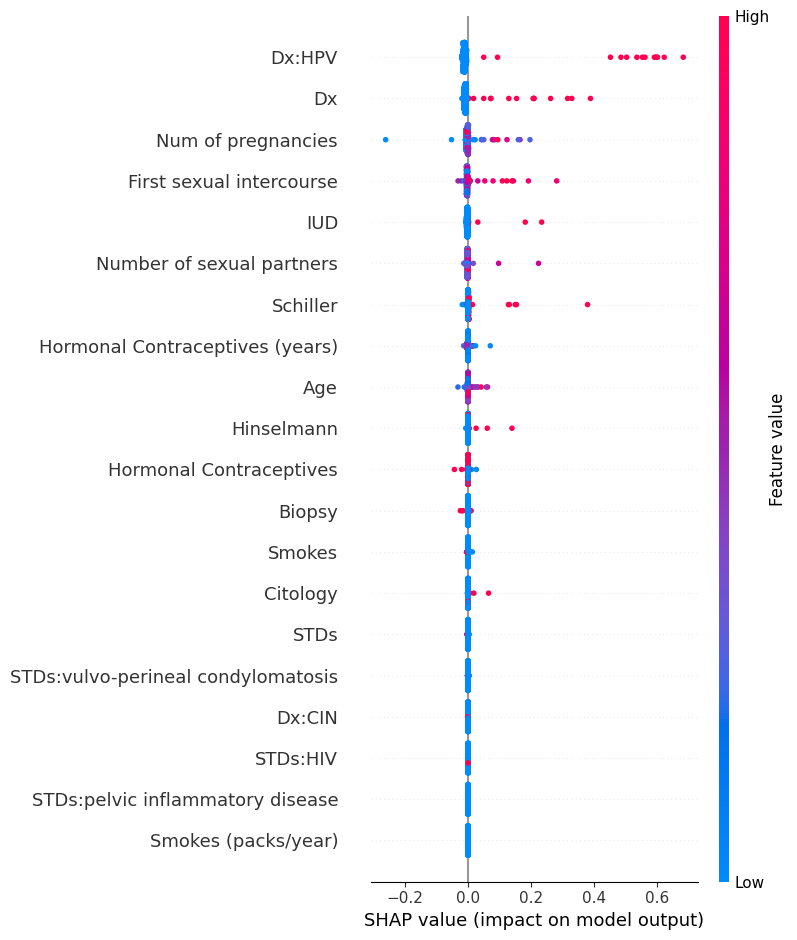

In [79]:
shap.summary_plot(tree_shap_values, X_train_p1)

This plot shows that "Dx:HPV", "Dx", and "Number of pregnancies" have a significant impact on the model's predictions, with higher values generally contributing to a higher model output, which could correspond to a higher probability of cervical cancer prediction in the context of this model. Other features like "STDs:genital herpes" and "Smokes (packs/year)" seem to have less influence on the model’s predictions.

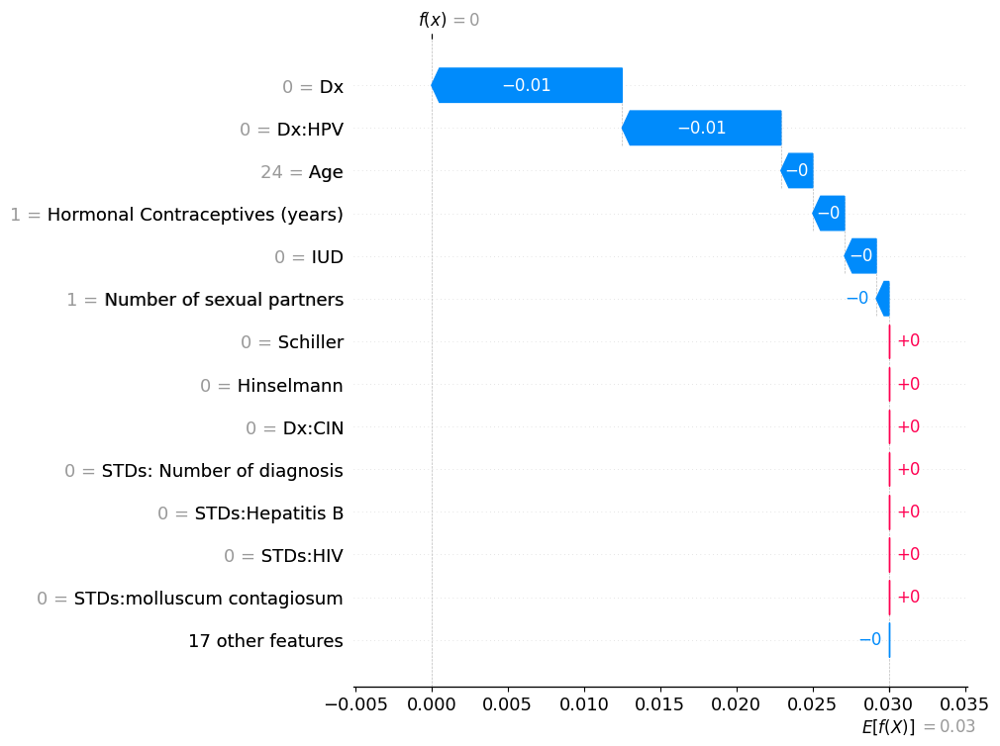

In [80]:
shap.plots.waterfall(tree_shap_values[sample_ind], max_display=14)

The waterfall chart illustrates how individual features contribute to a specific prediction generated by a machine learning model. It shows the incremental impact of each feature, starting from a baseline prediction of 0. Contributions from features such as 'Dx:HPV' and 'Dx' that have negative effects slightly reduce the prediction value, whereas positive contributions from features like 'Number of sexual partners', 'Age', and 'Num of pregnancies' incrementally raise it. These combined effects lead to a final prediction value of 0.03. This visualization aids in understanding how the model makes decisions for a single data point, with red and blue bars indicating the extent to which each feature either diminishes or enhances the prediction.

**Shap Analysis on AutoML Model**

In [81]:
class H2OProbWrapper:
    def __init__(self, h2o_model, feature_names):
        self.h2o_model = h2o_model
        self.feature_names = feature_names
    def predict_binary_prob(self, X):
        if isinstance(X, pd.Series):
            X = X.values.reshape(1,-1)
        self.dataframe= pd.DataFrame(X, columns=self.feature_names)
        self.predictions = self.h2o_model.predict(h2o.H2OFrame(self.dataframe)).as_data_frame().values
        return self.predictions.astype('float64')[:,-1] #probability of True class

In [82]:
df2

,Number of sexual partners,Num of pregnancies,Smokes,Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,STDs:vaginal condylomatosis,STDs:syphilis,STDs:pelvic inflammatory disease,STDs:genital herpes,...,STDs:Hepatitis B,STDs:HPV,Dx:Cancer,Dx:CIN,Dx:HPV,Dx,Hinselmann,Schiller,Citology,Biopsy
0,4.0,1.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,1.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,1.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2.0,4.0,1.0,1.0,3.00,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,3.0,4.0,0.0,1.0,0.50,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
853,3.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
854,2.0,1.0,0.0,1.0,0.50,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
855,2.0,0.0,0.0,1.0,0.08,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
856,2.0,2.0,0.0,1.0,0.08,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [83]:
data=df2

In [84]:
data.columns

Index(['Number of sexual partners', 'Num of pregnancies', 'Smokes',
       'Hormonal Contraceptives', 'Hormonal Contraceptives (years)', 'IUD',
       'STDs:vaginal condylomatosis', 'STDs:syphilis',
       'STDs:pelvic inflammatory disease', 'STDs:genital herpes',
       'STDs:molluscum contagiosum', 'STDs:HIV', 'STDs:Hepatitis B',
       'STDs:HPV', 'Dx:Cancer', 'Dx:CIN', 'Dx:HPV', 'Dx', 'Hinselmann',
       'Schiller', 'Citology', 'Biopsy'],
      dtype='object')

In [85]:
from sklearn.model_selection import train_test_split

X = data[
    [
       'Number of sexual partners', 'Num of pregnancies', 'Smokes',
       'Hormonal Contraceptives', 'Hormonal Contraceptives (years)', 'IUD',
       'STDs:vaginal condylomatosis', 'STDs:syphilis',
       'STDs:pelvic inflammatory disease', 'STDs:genital herpes',
       'STDs:molluscum contagiosum', 'STDs:HIV', 'STDs:Hepatitis B',
       'STDs:HPV', 'Dx:Cancer', 'Dx:CIN', 'Dx:HPV', 'Dx', 'Hinselmann',
       'Schiller', 'Citology', 'Biopsy'

    ]
]

y = data["Dx:Cancer"]

# Spliting data into Training 90%, Test set 10%

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=1)

In [86]:
feature_names = list(X_train.columns)
h2o_wrapper = H2OProbWrapper(best_model,feature_names)

In [87]:
explainer = shap.KernelExplainer(h2o_wrapper.predict_binary_prob,X_test[:50])

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


In [88]:
shap_values = explainer.shap_values(X_test[:50])

  0%|          | 0/50 [00:00<?, ?it/s]

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


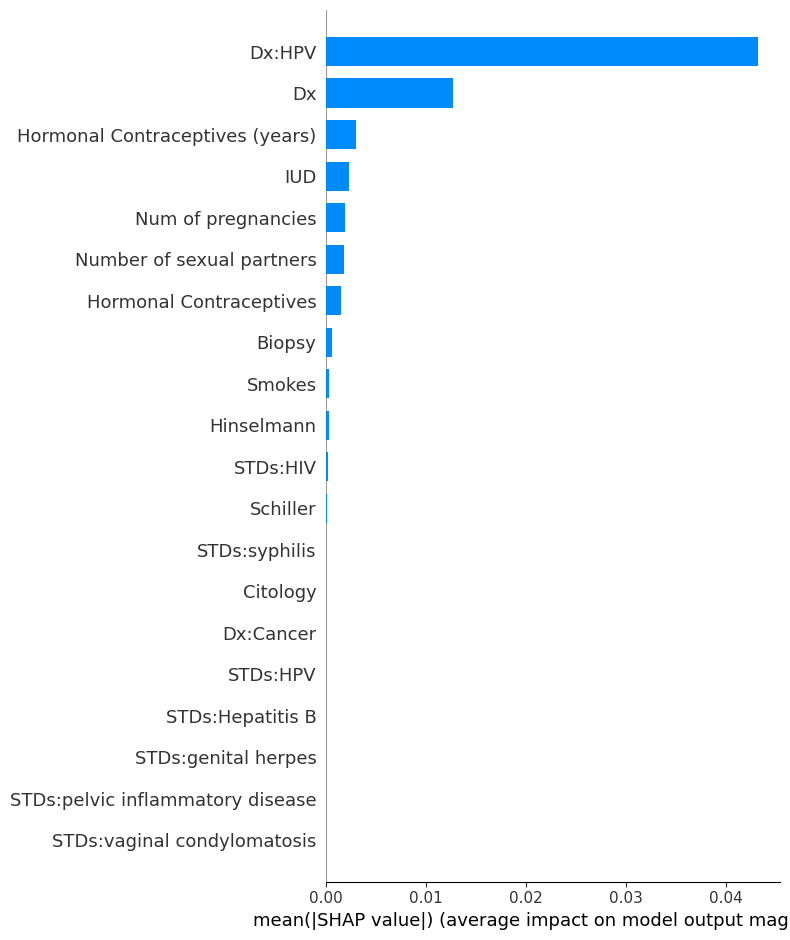

In [89]:
shap.summary_plot(shap_values, X_test, plot_type="bar")

The bar chart visualizes feature importance from an AutoML model, using mean absolute SHAP values to show each feature's average impact on the model's output. The most impactful features include the diagnosis of HPV, general diagnosis, duration of hormonal contraceptive use, number of pregnancies, age, whether hormonal contraceptives are used, number of sexual partners, and smoking status, in that order. HPV diagnosis is by far the most significant predictor, followed by general diagnosis, indicating their strong influence in the model's predictions

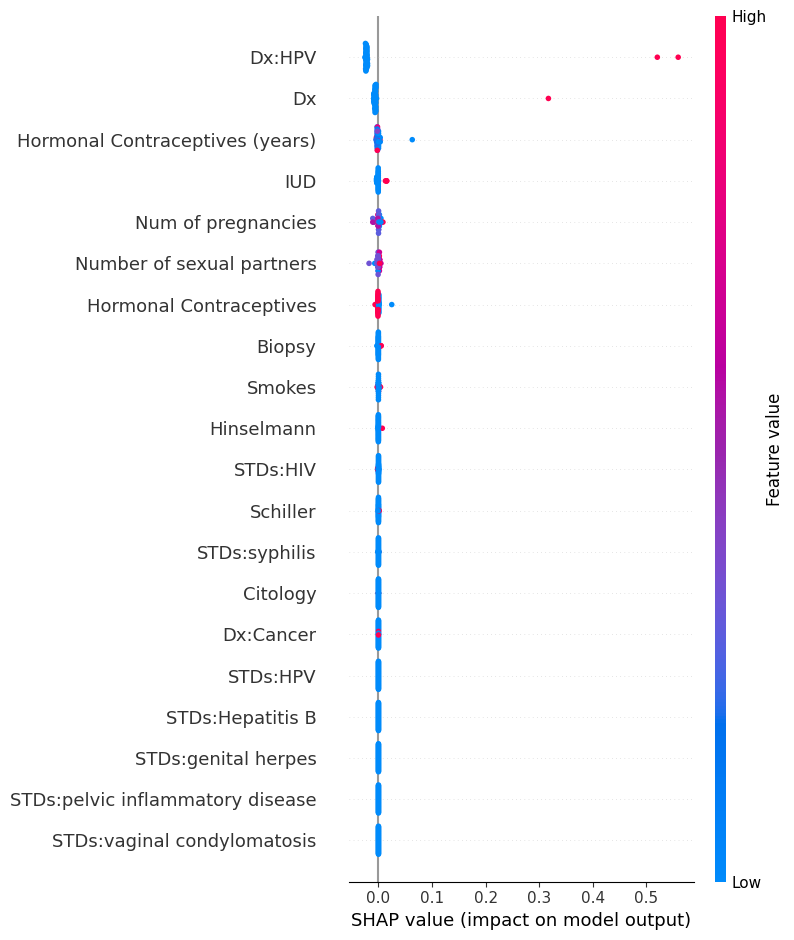

In [90]:
shap.summary_plot(shap_values, X_test[:50], feature_names=X_test.columns)

This plot illustrates the SHAP values from an AutoML model, displaying the impact of individual features on model predictions. Features such as 'Dx:HPV', 'Dx', and 'Hormonal Contraceptives' show a wide range of influence, with their SHAP values dispersed across the spectrum, indicating that these features significantly affect the predictions in a varied manner. Conversely, features like 'STDs:genital herpes' and 'STDs:syphilis' have SHAP values clustered around zero, suggesting a minimal impact.

In [91]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=fbe7eabd3f0bdb7b1c7973ac57e29411dcff5fa60c75559439ad7e391afb0670
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


### **LIME Analysis**
LIME (Local Interpretation Model-Agnostic Explanation) builds a surrogate model, i.e. converts a more complicated model (say a deep tree-based model into a simple linear model) around the data points in which we are interested and then it will try to make an approximation out of this simple model on the whole model. LIME builds a local model in such a way that it can interpret the whole Black-Box. LIME works well on tabular, text, image datasets - hence it works on different datasets

**LIME Analysis on Linear Model**

In [92]:
import lime
from lime import lime_tabular
# Initializing LIME explainer for Linear Model
lime_linear_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train_p1), feature_names=X_train_p1.columns, mode="regression"
)


In [93]:
# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(X_test_p1)
np_y_test = np.array(y_test_p1)
print("Prediction : ", linear_model.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_linear_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], linear_model.predict, num_features=np_x_test.shape[1]
)
lime_linear_explanation

Prediction :  [0.00137497]
Actual :      0.0


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


In [94]:
lime_linear_explanation.show_in_notebook()

The model's predicted value for this instance leans toward the positive class, as indicated by the features pushing towards a higher value (closer to 1.00).
Features such as 'Biopsy', 'Schiller', and 'Num of pregnancies',and 'Dx:CIN' have strong positive weights, implying a significant contribution towards a positive diagnosis.
Other features like 'Dx', 'Dx:HPV',  are weighted negatively, indicating a contribution towards a negative diagnosis.

**LIME Analysis on Random Forest Model**

In [95]:
# Initializing LIME explainer for Tree Based Model
lime_tree_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train_p1), feature_names=X_train_p1.columns, mode="regression"
)

In [96]:
# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(X_test_p1)
np_y_test = np.array(y_test_p1)
print("Prediction : ", random_model.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_tree_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], random_model.predict, num_features=np_x_test.shape[1]
)
lime_tree_explanation

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Prediction :  [0.]
Actual :      0.0


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [97]:
lime_tree_explanation.show_in_notebook()

The predicted outcome leans towards the positive class, indicating a higher likelihood of a positive cervical cancer diagnosis.Features contributing positively to the prediction (indicated by the orange color) include 'STDs:pelvic inflammatory disease', 'STDs:vaginal condylomatosis', and 'Schiller'. These features have relatively high weights, suggesting a strong influence on the model's prediction towards a positive diagnosis.'Dx:HPV' and 'Dx' are negatively weighted (indicated by blue), suggesting they contribute towards a negative prediction.
Most features, particularly those related to sexually transmitted diseases (STDs), show zero weight, implying no significant influence on this particular prediction.

### Interpretability

From the SHAP analysis for the linear model, it highlights "Dx", "Dx:HPV","Dx:CIN", and "Biopsy"  as the top features positively contributing to the prediction of cervical cancer.For the random forest model, the SHAP analysis indicates that "Dx:HPV", "Dx", and "First sexual intercourse" significantly influence the predictions.The SHAP analysis for the AutoML DRF model reveals that "Dx:HPV" has the most substantial impact on the predictions, followed by "Dx" and "First sexual intercourse". These features exhibit varied effects on the model's output across different observations, with some features showing a mix of positive and negative impacts. Whereas LIME Analysis for linear model highlights "Dx:CIN", "Dx', and "Dx:HPV", are the top features contributing towards the prediction and for the random forest model, the LIME Analysis indicates "Dx:HPV","STDs:molluscum contagiosum" and "Hinselmann"have the signinficant impact

**Data Imputation Methods**

We will remove 1%, 5% and 10% of the data from Dx:HPV column in our dataset and see how well Mean Imputation and MICE imputation will recover the data back

In [98]:
df

,Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,...,STDs:HPV,STDs: Number of diagnosis,Dx:Cancer,Dx:CIN,Dx:HPV,Dx,Hinselmann,Schiller,Citology,Biopsy
0,18.0,4.0,15.0,1.0,0.0,0.0,0.0,0.0,0.00,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,15.0,1.0,14.0,1.0,0.0,0.0,0.0,0.0,0.00,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,34.0,1.0,17.0,1.0,0.0,0.0,0.0,0.0,0.00,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,25.0,2.0,16.0,4.0,1.0,0.0,0.0,1.0,3.00,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,46.0,3.0,21.0,4.0,0.0,0.0,0.0,1.0,0.50,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
853,34.0,3.0,18.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
854,32.0,2.0,19.0,1.0,0.0,0.0,0.0,1.0,0.50,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
855,25.0,2.0,17.0,0.0,0.0,0.0,0.0,1.0,0.08,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
856,33.0,2.0,17.0,2.0,0.0,0.0,0.0,1.0,0.08,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [99]:
df_imputation = df.copy()
# Creating three extra coloumns of Alcohol for performing Data Imputation techniques
df_imputation["HPV_1_percent"] = df_imputation[["Dx:HPV"]]
df_imputation["HPV_5_percent"] = df_imputation[["Dx:HPV"]]
df_imputation["HPV_10_percent"] = df_imputation[["Dx:HPV"]]

In [100]:
# Data Imputation
!pip install fancyimpute
from fancyimpute import IterativeImputer as MICE

  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.7/154.7 kB 7.1 MB/s eta 0:00:00
  Created wheel for fancyimpute: filename=fancyimpute-0.7.0-py3-none-any.whl size=29881 sha256=72f816ceb66e3f259c774a2e4f3a74f9572c1f62acca8a92e5147d9466341716
  Stored in directory: /root/.cache/pip/wheels/7b/0c/d3/ee82d1fbdcc0858d96434af108608d01703505d453720c84ed
  Created wheel for knnimpute: filename=knnimpute-0.1.0-py3-none-any.whl size=11330 sha256=b8b0a520a9fb4975d658bf30cb9e462ff4977a7a3870bb0085b142692071355d
  Stored in directory: /root/.cache/pip/wheels/46/06/a5/45a724630562413c374e29c08732411d496092408b3a7bf754
Successfully built fancyimpute knnimpute


In [101]:
def get_percent_missing(dataframe):

    percent_missing = dataframe.isnull().sum() * 100 / len(dataframe)
    missing_value_df = pd.DataFrame(
        {"column_name": dataframe.columns, "percent_missing": percent_missing}
    )
    return missing_value_df


# Function to create missing values
def create_missing(dataframe, percent, col):
    dataframe.loc[dataframe.sample(frac=percent).index, col] = np.nan


# Modified function to impute data using mean imputation
def mean_impute(train_df):
    mm_impute_train_df = train_df.copy()  # Make a copy of dataframe for imputation
    mm_impute_train_df["HPV_1_percent"] = mm_impute_train_df[
        "HPV_1_percent"
    ].fillna(mm_impute_train_df["Dx:HPV"].mean())
    mm_impute_train_df["HPV_5_percent"] = mm_impute_train_df[
        "HPV_5_percent"
    ].fillna(mm_impute_train_df["Dx:HPV"].mean())
    mm_impute_train_df["HPV_10_percent"] = mm_impute_train_df[
        "HPV_10_percent"
    ].fillna(mm_impute_train_df["Dx:HPV"].mean())
    return mm_impute_train_df


# Function to impute data using MICE method
def mice_impute(train_df):
    mice_imputed_train_df = pd.DataFrame(
        MICE().fit_transform(train_df), columns=list(train_df.columns)
    )
    return mice_imputed_train_df


# Function to calculate how well the data has been recovered after performing data imputation
def percentage_change(l1, l2):
    percent_change = abs(l2 - l1) / (l1 + 0.000000001)
    avg_change = (percent_change.sum() / percent_change.count()) * 100
    return avg_change

In [102]:
# Checking for % missing values in dataset
print(get_percent_missing(df_imputation))

                                                           column_name  \
Age                                                                Age   
Number of sexual partners                    Number of sexual partners   
First sexual intercourse                      First sexual intercourse   
Num of pregnancies                                  Num of pregnancies   
Smokes                                                          Smokes   
Smokes (years)                                          Smokes (years)   
Smokes (packs/year)                                Smokes (packs/year)   
Hormonal Contraceptives                        Hormonal Contraceptives   
Hormonal Contraceptives (years)        Hormonal Contraceptives (years)   
IUD                                                                IUD   
IUD (years)                                                IUD (years)   
STDs                                                              STDs   
STDs (number)                         

In [103]:
# Creating missing values in respected coloumns to perform data imputation
create_missing(df_imputation, 0.01, "HPV_1_percent")
create_missing(df_imputation, 0.05, "HPV_5_percent")
create_missing(df_imputation, 0.1, "HPV_10_percent")

In [104]:
# Performing Mean Imputation
mm_imputed_df_imputation = mean_impute(df_imputation)

In [105]:

# Dataframe for 1% missing value
df_imputation_1_percent = df_imputation.drop(
    ["Dx:HPV", "HPV_5_percent", "HPV_10_percent"], axis=1
)
# Dataframe for 5% missing value
df_imputation_5_percent = df_imputation.drop(
    ["Dx:HPV", "HPV_1_percent", "HPV_10_percent"], axis=1
)
# Dataframe for 10% missing value
df_imputation_10_percent = df_imputation.drop(
    ["Dx:HPV", "HPV_1_percent", "HPV_5_percent"], axis=1
)

# Performing Imputation on Dataframe with 1% missing values
mice_imputed_df_imputation_1_percent = mice_impute(df_imputation_1_percent)
# Performing Imputation on Dataframe with 5% missing values
mice_imputed_df_imputation_5_percent = mice_impute(df_imputation_5_percent)
# Performing Imputation on Dataframe with 10% missing values
mice_imputed_df_imputation_10_percent = mice_impute(df_imputation_10_percent)

In [106]:
# This is the average % error on residuals for 1% missing data imputed using Mean Imputation
print("Average % error on residuals for 1% missing data imputed using Mean Imputation")
print(
    percentage_change(
        mm_imputed_df_imputation["Dx:HPV"],
        mm_imputed_df_imputation["HPV_1_percent"],
    )
)

# This is the average % error on residuals for 1% missing data imputed using MICE Imputation
print("Average % error on residuals for 1% missing data imputed using MICE Imputation")
print(
    percentage_change(
        df_imputation["Dx:HPV"],
        mice_imputed_df_imputation_1_percent["HPV_1_percent"],
    )
)

# This is the average % error on residuals for 5% missing data imputed using Mean Imputation
print("Average % error on residuals for 5% missing data imputed using Mean Imputation")
print(
    percentage_change(
        mm_imputed_df_imputation["Dx:HPV"],
        mm_imputed_df_imputation["HPV_5_percent"],
    )
)

# This is the average % error on residuals for 5% missing data imputed using MICE Imputation
print("Average % error on residuals for 5% missing data imputed using MICE Imputation")
print(
    percentage_change(
        df_imputation["Dx:HPV"],
        mice_imputed_df_imputation_5_percent["HPV_5_percent"],
    )
)

# This is the average % error on residuals for 10% missing data imputed using Mean Imputation
print("Average % error on residuals for 10% missing data imputed using Mean Imputation")
print(
    percentage_change(
        mm_imputed_df_imputation["Dx:HPV"],
        mm_imputed_df_imputation["HPV_10_percent"],
    )
)

# This is the average % error on residuals for 10% missing data imputed using MICE Imputation
print("Average % error on residuals for 10% missing data imputed using MICE Imputation")
print(
    percentage_change(
        df_imputation["Dx:HPV"],
        mice_imputed_df_imputation_10_percent["HPV_10_percent"],
    )
)

Average % error on residuals for 1% missing data imputed using Mean Imputation
22005966.06191012
Average % error on residuals for 1% missing data imputed using MICE Imputation
12689218.59600146
Average % error on residuals for 5% missing data imputed using Mean Imputation
102694508.40301889
Average % error on residuals for 5% missing data imputed using MICE Imputation
145240020.08060732
Average % error on residuals for 10% missing data imputed using Mean Imputation
202943909.57993054
Average % error on residuals for 10% missing data imputed using MICE Imputation
82483454.43670374


It's evident that MICE Imputation consistently outperforms Mean Imputation across all levels of missing data, exhibiting significantly lower average percentage error on residuals. This suggests that MICE Imputation is a more effective method for handling missing data, providing more accurate imputations and consequently resulting in better model performance.

## **Conclusion**

**What is the question?**

The central question tackled involves identifying and understanding the key factors that contribute to cervical cancer risk. This is approached through a systematic analysis involving data cleaning, feature selection, and modeling, aiming to develop a predictive model that can accurately assess an individual's risk of cervical cancer based on various predictors.

**What did you do?**

Data Preprocessing: I started with data cleaning and preprocessing, addressing missing values and ensuring the data is in a suitable format for analysis. It involves checking for missing values, imputing missing data, and observing the distribution of data to identify any need for normalization or transformation.

Feature Selection: After preprocessing,I explored different feature selection techniques to identify the most significant variables for predicting cervical cancer risk. This might include correlation analysis, heatmap visualizations to identify relationships between variables, and possibly using algorithms that can automatically select important features.

Modeling: Further, I did training and testing of various machine learning models. This process likely includes splitting the data into training and testing sets, selecting different models (e.g., linear models, decision trees, random forests, or more advanced techniques like AutoML for automated model selection), and tuning their parameters to improve performance.

Interpretability: To understand how the models make their predictions, I employed various interpretability techniques like SHAP,PDP and LIME. These methods help to explain the output of machine learning models, identifying which features are most important for predictions and how changes in those features affect the predicted risk of cervical cancer.

**How well did it work?**

The specific outcomes of these metrics would provide a clear picture of the model's predictive performance, with higher values indicating better performance. It likely presents comparisons between different models to identify which performed best under the given circumstances.
The optimal model derived from AutoML,finely tuned, emerges as the most effective choice for this particular task when compared to other models examined in this study. Not only does it boast the highest accuracy, but it also offers interpretability, allowing us to delve into the underlying factors contributing to the prediction of cervical cancer. For all three models, "Dx:HPV" consistently emerges as a common and significant predictor of cervical cancer, with higher values correlating to increased predictions. "Dx:CIN", "Dx" "Hormonal Contraceptives" and "First sexual intercourse" also play notable roles across models, while other features show varying degrees of influence.

**What did you learn?**

I now have a better understanding of the entire lifecycle, right from data preparation, data cleaning, feature selection,modeling to interpreating the model . The most emphasis should be placed on data preparation, which includes activities like feature selection, imputation, regularization, and data cleaning.
Hyperparameter tuning is also the most important step, spending time fine-tuning hyperparameters produces worthwhile outcomes.
It's essential to train multiple models and select the best ones for deployment, as certain algorithms excel in specific tasks compared to others.
The most valuable takeaway from this series of assignments is the ability to interpret models. Techniques like SHAP, LIME, and PDP have helped us in process of understanding what factors influence a model's predictions.
General Insights for Data Imputation Impact: How different strategies for handling missing data (e.g., median imputation, MICE) affect the model's performance.

**Refernces**

1. Cervical Cancer Classification Dataset from Kaggle
2. Referred example Notebook A_Crash_Course_in_Statistical_Learning/AutoML/CC_Kaggle_AutoML_Regression_Melbourne_Housing.ipynb and A_Crash_Course_in_Statistical_Learning/AutoML/AutoML_Smoke_Detection_Example.ipynb
3. Refered youtube video https://www.youtube.com/watch?v=fYhr8eF1ubo for Imputation Methods for Missing Data
4. Referred from example notebooks https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/Full_ML_Report/Wine-Quality-Analysis.ipynb
5. Referred from example notebooks  https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/Model_Interpretability/SHAP%20and%20LIME%20analysis%20Walkthrough.ipynb


MIT License

Copyright (c) 2024 Pranali Chipkar

Permission is hereby granted, free of charge, to any person obtaining a copy
of this software and associated documentation files (the "Software"), to deal
in the Software without restriction, including without limitation the rights
to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
copies of the Software, and to permit persons to whom the Software is
furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all
copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE
SOFTWARE.